ToDo:
    - merge to group level
    - fine-tune parameters
    - maybe output func?

adapted from https://mne.tools/stable/auto_tutorials/time-freq/20_sensors_time_frequency.html
    
by: Alexandre Gramfort <alexandre.gramfort@inria.fr>
          Stefan Appelhoff <stefan.appelhoff@mailbox.org>
          Richard Höchenberger <richard.hoechenberger@gmail.com>

In [1]:
import os.path as op

import numpy as np
import matplotlib.pyplot as plt

import mne
from mne.time_frequency import tfr_morlet, psd_multitaper, psd_welch
#from mne.datasets import somato

In [2]:

import numpy as np
import os
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib.cm as cm
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colorbar import ColorbarBase
from matplotlib.colors import Normalize
import seaborn as sns
from matplotlib.colors import ListedColormap

from mne import read_epochs, combine_evoked, grand_average
from mne.channels import make_1020_channel_selections
from mne.viz import plot_compare_evokeds



In [3]:
#directory = '/home/michael/data/derivatives/results/erp_plots'

rootdir = '/home/michael/data/derivatives/reaction_epochs'
#subject = '015'

In [4]:
pos_incongruent_incorrect_base = dict()
pos_incongruent_incorrect_erps_base = dict()
pos_incongruent_incorrect_pos = dict()
pos_incongruent_incorrect_erps_pos = dict()
pos_incongruent_incorrect_neg = dict()
pos_incongruent_incorrect_erps_neg = dict()

neg_incongruent_incorrect_base = dict()
neg_incongruent_incorrect_erps_base = dict()
neg_incongruent_incorrect_pos = dict()
neg_incongruent_incorrect_erps_pos = dict()
neg_incongruent_incorrect_neg = dict()
neg_incongruent_incorrect_erps_neg = dict()

rootdir = '/home/michael/data/derivatives/reaction_epochs'

counter = 0
directory = '/home/michael/data/derivatives/results/erp_plots'

if not os.path.exists(directory):
    os.makedirs(directory)

for subdir, dirs, files in os.walk(rootdir):
    for file in files:
        filepath = subdir + os.sep + file
        if filepath.endswith(".fif"):
            print (filepath)
            print((filepath.split('/')[-2].split('-')[-1]))
            subject = (filepath.split('/')[-2].split('-')[-1])[-2:]
            target_epo = read_epochs(filepath, preload=True)

            display(target_epo.metadata['negative_first'].iloc[0])
            # split by group membership
            if target_epo.metadata['negative_first'].iloc[0] == True:
                display('########################')
                display(target_epo.metadata['negative_first'].iloc[0])
                display('sorted to negative first')
                display('########################')
                # and apply baseline
                neg_incongruent_incorrect_base['subj_' + subject] = target_epo['condition == 1']['incorrect_incongruent'].apply_baseline((-0.300, -0.050))
                neg_incongruent_incorrect_pos['subj_' + subject] = target_epo['condition == 2']['incorrect_incongruent'].apply_baseline((-0.300, -0.050))
                neg_incongruent_incorrect_neg['subj_' + subject] = target_epo['condition == 3']['incorrect_incongruent'].apply_baseline((-0.300, -0.050))

                # compute ERP
                neg_incongruent_incorrect_erps_base['subj_' + subject] = neg_incongruent_incorrect_base['subj_' + subject].average()
                neg_incongruent_incorrect_erps_pos['subj_' + subject] = neg_incongruent_incorrect_pos['subj_' + subject].average()
                neg_incongruent_incorrect_erps_neg['subj_' + subject] = neg_incongruent_incorrect_neg['subj_' + subject].average()
                #display(incongruent_incorrect_erps_neu)
            elif target_epo.metadata['negative_first'].iloc[0] == False:
                display('########################')
                display(target_epo.metadata['negative_first'].iloc[0])
                display('sorted to positive first')
                display('########################')
                # and apply baseline
                pos_incongruent_incorrect_base['subj_' + subject] = target_epo['condition == 1']['incorrect_incongruent'].apply_baseline((-0.300, -0.050))
                pos_incongruent_incorrect_pos['subj_' + subject] = target_epo['condition == 2']['incorrect_incongruent'].apply_baseline((-0.300, -0.050))
                pos_incongruent_incorrect_neg['subj_' + subject] = target_epo['condition == 3']['incorrect_incongruent'].apply_baseline((-0.300, -0.050))

                # compute ERP
                pos_incongruent_incorrect_erps_base['subj_' + subject] = pos_incongruent_incorrect_base['subj_' + subject].average()
                pos_incongruent_incorrect_erps_pos['subj_' + subject] = pos_incongruent_incorrect_pos['subj_' + subject].average()
                pos_incongruent_incorrect_erps_neg['subj_' + subject] = pos_incongruent_incorrect_neg['subj_' + subject].average()                

/home/michael/data/derivatives/reaction_epochs/sub-007/sub-007-reaction_epochs-epo.fif
007
Reading /home/michael/data/derivatives/reaction_epochs/sub-007/sub-007-reaction_epochs-epo.fif ...
    Read a total of 1 projection items:
        Average EEG reference (1 x 64) active
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Adding metadata with 9 columns
Replacing existing metadata with 9 columns
1229 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


True

'########################'

True

'sorted to negative first'

'########################'

Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
/home/michael/data/derivatives/reaction_epochs/sub-009/sub-009-reaction_epochs-epo.fif
009
Reading /home/michael/data/derivatives/reaction_epochs/sub-009/sub-009-reaction_epochs-epo.fif ...
    Read a total of 1 projection items:
        Average EEG reference (1 x 64) active
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Adding metadata with 9 columns
Replacing existing metadata with 9 columns
1234 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


True

'########################'

True

'sorted to negative first'

'########################'

Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
/home/michael/data/derivatives/reaction_epochs/sub-018/sub-018-reaction_epochs-epo.fif
018
Reading /home/michael/data/derivatives/reaction_epochs/sub-018/sub-018-reaction_epochs-epo.fif ...
    Read a total of 1 projection items:
        Average EEG reference (1 x 64) active
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Adding metadata with 9 columns
Replacing existing metadata with 9 columns
1223 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


True

'########################'

True

'sorted to negative first'

'########################'

Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
/home/michael/data/derivatives/reaction_epochs/sub-011/sub-011-reaction_epochs-epo.fif
011
Reading /home/michael/data/derivatives/reaction_epochs/sub-011/sub-011-reaction_epochs-epo.fif ...
    Read a total of 1 projection items:
        Average EEG reference (1 x 64) active
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Adding metadata with 9 columns
Replacing existing metadata with 9 columns
1219 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


False

'########################'

False

'sorted to positive first'

'########################'

Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
/home/michael/data/derivatives/reaction_epochs/sub-023/sub-023-reaction_epochs-epo.fif
023
Reading /home/michael/data/derivatives/reaction_epochs/sub-023/sub-023-reaction_epochs-epo.fif ...
    Read a total of 1 projection items:
        Average EEG reference (1 x 64) active
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Adding metadata with 9 columns
Replacing existing metadata with 9 columns
1181 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


False

'########################'

False

'sorted to positive first'

'########################'

Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
/home/michael/data/derivatives/reaction_epochs/sub-031/sub-031-reaction_epochs-epo.fif
031
Reading /home/michael/data/derivatives/reaction_epochs/sub-031/sub-031-reaction_epochs-epo.fif ...
    Read a total of 1 projection items:
        Average EEG reference (1 x 64) active
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Adding metadata with 9 columns
Replacing existing metadata with 9 columns
1227 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


False

'########################'

False

'sorted to positive first'

'########################'

Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
/home/michael/data/derivatives/reaction_epochs/sub-008/sub-008-reaction_epochs-epo.fif
008
Reading /home/michael/data/derivatives/reaction_epochs/sub-008/sub-008-reaction_epochs-epo.fif ...
    Read a total of 1 projection items:
        Average EEG reference (1 x 64) active
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Adding metadata with 9 columns
Replacing existing metadata with 9 columns
1224 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


False

'########################'

False

'sorted to positive first'

'########################'

Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
/home/michael/data/derivatives/reaction_epochs/sub-022/sub-022-reaction_epochs-epo.fif
022
Reading /home/michael/data/derivatives/reaction_epochs/sub-022/sub-022-reaction_epochs-epo.fif ...
    Read a total of 1 projection items:
        Average EEG reference (1 x 64) active
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Adding metadata with 9 columns
Replacing existing metadata with 9 columns
1236 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


True

'########################'

True

'sorted to negative first'

'########################'

Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
/home/michael/data/derivatives/reaction_epochs/sub-036/sub-036-reaction_epochs-epo.fif
036
Reading /home/michael/data/derivatives/reaction_epochs/sub-036/sub-036-reaction_epochs-epo.fif ...
    Read a total of 1 projection items:
        Average EEG reference (1 x 64) active
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Adding metadata with 9 columns
Replacing existing metadata with 9 columns
1215 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


True

'########################'

True

'sorted to negative first'

'########################'

Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
/home/michael/data/derivatives/reaction_epochs/sub-003/sub-003-reaction_epochs-epo.fif
003
Reading /home/michael/data/derivatives/reaction_epochs/sub-003/sub-003-reaction_epochs-epo.fif ...
    Read a total of 1 projection items:
        Average EEG reference (1 x 64) active
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Adding metadata with 9 columns
Replacing existing metadata with 9 columns
1176 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


True

'########################'

True

'sorted to negative first'

'########################'

Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
/home/michael/data/derivatives/reaction_epochs/sub-029/sub-029-reaction_epochs-epo.fif
029
Reading /home/michael/data/derivatives/reaction_epochs/sub-029/sub-029-reaction_epochs-epo.fif ...
    Read a total of 1 projection items:
        Average EEG reference (1 x 64) active
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Adding metadata with 9 columns
Replacing existing metadata with 9 columns
881 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


False

'########################'

False

'sorted to positive first'

'########################'

Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
/home/michael/data/derivatives/reaction_epochs/sub-004/sub-004-reaction_epochs-epo.fif
004
Reading /home/michael/data/derivatives/reaction_epochs/sub-004/sub-004-reaction_epochs-epo.fif ...
    Read a total of 1 projection items:
        Average EEG reference (1 x 64) active
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Adding metadata with 9 columns
Replacing existing metadata with 9 columns
1215 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


False

'########################'

False

'sorted to positive first'

'########################'

Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
/home/michael/data/derivatives/reaction_epochs/sub-005/sub-005-reaction_epochs-epo.fif
005
Reading /home/michael/data/derivatives/reaction_epochs/sub-005/sub-005-reaction_epochs-epo.fif ...
    Read a total of 1 projection items:
        Average EEG reference (1 x 64) active
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Adding metadata with 9 columns
Replacing existing metadata with 9 columns
1214 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


True

'########################'

True

'sorted to negative first'

'########################'

Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
/home/michael/data/derivatives/reaction_epochs/sub-015/sub-015-reaction_epochs-epo.fif
015
Reading /home/michael/data/derivatives/reaction_epochs/sub-015/sub-015-reaction_epochs-epo.fif ...
    Read a total of 1 projection items:
        Average EEG reference (1 x 64) active
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Adding metadata with 9 columns
Replacing existing metadata with 9 columns
1220 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


False

'########################'

False

'sorted to positive first'

'########################'

Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
/home/michael/data/derivatives/reaction_epochs/sub-002/sub-002-reaction_epochs-epo.fif
002
Reading /home/michael/data/derivatives/reaction_epochs/sub-002/sub-002-reaction_epochs-epo.fif ...
    Read a total of 1 projection items:
        Average EEG reference (1 x 64) active
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Adding metadata with 9 columns
Replacing existing metadata with 9 columns
1231 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


False

'########################'

False

'sorted to positive first'

'########################'

Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
/home/michael/data/derivatives/reaction_epochs/sub-037/sub-037-reaction_epochs-epo.fif
037
Reading /home/michael/data/derivatives/reaction_epochs/sub-037/sub-037-reaction_epochs-epo.fif ...
    Read a total of 1 projection items:
        Average EEG reference (1 x 64) active
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Adding metadata with 9 columns
Replacing existing metadata with 9 columns
1233 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


False

'########################'

False

'sorted to positive first'

'########################'

Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
/home/michael/data/derivatives/reaction_epochs/sub-012/sub-012-reaction_epochs-epo.fif
012
Reading /home/michael/data/derivatives/reaction_epochs/sub-012/sub-012-reaction_epochs-epo.fif ...
    Read a total of 1 projection items:
        Average EEG reference (1 x 64) active
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Adding metadata with 9 columns
Replacing existing metadata with 9 columns
1135 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


True

'########################'

True

'sorted to negative first'

'########################'

Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
/home/michael/data/derivatives/reaction_epochs/sub-010/sub-010-reaction_epochs-epo.fif
010
Reading /home/michael/data/derivatives/reaction_epochs/sub-010/sub-010-reaction_epochs-epo.fif ...
    Read a total of 1 projection items:
        Average EEG reference (1 x 64) active
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Adding metadata with 9 columns
Replacing existing metadata with 9 columns
1051 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


False

'########################'

False

'sorted to positive first'

'########################'

Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
/home/michael/data/derivatives/reaction_epochs/sub-006/sub-006-reaction_epochs-epo.fif
006
Reading /home/michael/data/derivatives/reaction_epochs/sub-006/sub-006-reaction_epochs-epo.fif ...
    Read a total of 1 projection items:
        Average EEG reference (1 x 64) active
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Adding metadata with 9 columns
Replacing existing metadata with 9 columns
1190 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


False

'########################'

False

'sorted to positive first'

'########################'

Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
/home/michael/data/derivatives/reaction_epochs/sub-020/sub-020-reaction_epochs-epo.fif
020
Reading /home/michael/data/derivatives/reaction_epochs/sub-020/sub-020-reaction_epochs-epo.fif ...
    Read a total of 1 projection items:
        Average EEG reference (1 x 64) active
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Adding metadata with 9 columns
Replacing existing metadata with 9 columns
1230 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


True

'########################'

True

'sorted to negative first'

'########################'

Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
/home/michael/data/derivatives/reaction_epochs/sub-032/sub-032-reaction_epochs-epo.fif
032
Reading /home/michael/data/derivatives/reaction_epochs/sub-032/sub-032-reaction_epochs-epo.fif ...
    Read a total of 1 projection items:
        Average EEG reference (1 x 64) active
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Adding metadata with 9 columns
Replacing existing metadata with 9 columns
909 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


True

'########################'

True

'sorted to negative first'

'########################'

Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
/home/michael/data/derivatives/reaction_epochs/sub-024/sub-024-reaction_epochs-epo.fif
024
Reading /home/michael/data/derivatives/reaction_epochs/sub-024/sub-024-reaction_epochs-epo.fif ...
    Read a total of 1 projection items:
        Average EEG reference (1 x 64) active
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Adding metadata with 9 columns
Replacing existing metadata with 9 columns
1229 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


True

'########################'

True

'sorted to negative first'

'########################'

Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
/home/michael/data/derivatives/reaction_epochs/sub-017/sub-017-reaction_epochs-epo.fif
017
Reading /home/michael/data/derivatives/reaction_epochs/sub-017/sub-017-reaction_epochs-epo.fif ...
    Read a total of 1 projection items:
        Average EEG reference (1 x 64) active
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Adding metadata with 9 columns
Replacing existing metadata with 9 columns
1210 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


False

'########################'

False

'sorted to positive first'

'########################'

Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
/home/michael/data/derivatives/reaction_epochs/sub-027/sub-027-reaction_epochs-epo.fif
027
Reading /home/michael/data/derivatives/reaction_epochs/sub-027/sub-027-reaction_epochs-epo.fif ...
    Read a total of 1 projection items:
        Average EEG reference (1 x 64) active
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Adding metadata with 9 columns
Replacing existing metadata with 9 columns
1114 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


False

'########################'

False

'sorted to positive first'

'########################'

Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
/home/michael/data/derivatives/reaction_epochs/sub-035/sub-035-reaction_epochs-epo.fif
035
Reading /home/michael/data/derivatives/reaction_epochs/sub-035/sub-035-reaction_epochs-epo.fif ...
    Read a total of 1 projection items:
        Average EEG reference (1 x 64) active
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Adding metadata with 9 columns
Replacing existing metadata with 9 columns
1232 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


True

'########################'

True

'sorted to negative first'

'########################'

Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
/home/michael/data/derivatives/reaction_epochs/sub-033/sub-033-reaction_epochs-epo.fif
033
Reading /home/michael/data/derivatives/reaction_epochs/sub-033/sub-033-reaction_epochs-epo.fif ...
    Read a total of 1 projection items:
        Average EEG reference (1 x 64) active
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Adding metadata with 9 columns
Replacing existing metadata with 9 columns
1110 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


False

'########################'

False

'sorted to positive first'

'########################'

Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
/home/michael/data/derivatives/reaction_epochs/sub-019/sub-019-reaction_epochs-epo.fif
019
Reading /home/michael/data/derivatives/reaction_epochs/sub-019/sub-019-reaction_epochs-epo.fif ...
    Read a total of 1 projection items:
        Average EEG reference (1 x 64) active
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Adding metadata with 9 columns
Replacing existing metadata with 9 columns
1207 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


False

'########################'

False

'sorted to positive first'

'########################'

Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
/home/michael/data/derivatives/reaction_epochs/sub-014/sub-014-reaction_epochs-epo.fif
014
Reading /home/michael/data/derivatives/reaction_epochs/sub-014/sub-014-reaction_epochs-epo.fif ...
    Read a total of 1 projection items:
        Average EEG reference (1 x 64) active
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Adding metadata with 9 columns
Replacing existing metadata with 9 columns
1122 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


True

'########################'

True

'sorted to negative first'

'########################'

Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
/home/michael/data/derivatives/reaction_epochs/sub-038/sub-038-reaction_epochs-epo.fif
038
Reading /home/michael/data/derivatives/reaction_epochs/sub-038/sub-038-reaction_epochs-epo.fif ...
    Read a total of 1 projection items:
        Average EEG reference (1 x 64) active
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Adding metadata with 9 columns
Replacing existing metadata with 9 columns
992 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


False

'########################'

False

'sorted to positive first'

'########################'

Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
/home/michael/data/derivatives/reaction_epochs/sub-016/sub-016-reaction_epochs-epo.fif
016
Reading /home/michael/data/derivatives/reaction_epochs/sub-016/sub-016-reaction_epochs-epo.fif ...
    Read a total of 1 projection items:
        Average EEG reference (1 x 64) active
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Adding metadata with 9 columns
Replacing existing metadata with 9 columns
1217 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


True

'########################'

True

'sorted to negative first'

'########################'

Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
/home/michael/data/derivatives/reaction_epochs/sub-028/sub-028-reaction_epochs-epo.fif
028
Reading /home/michael/data/derivatives/reaction_epochs/sub-028/sub-028-reaction_epochs-epo.fif ...
    Read a total of 1 projection items:
        Average EEG reference (1 x 64) active
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Adding metadata with 9 columns
Replacing existing metadata with 9 columns
1214 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


True

'########################'

True

'sorted to negative first'

'########################'

Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
/home/michael/data/derivatives/reaction_epochs/sub-013/sub-013-reaction_epochs-epo.fif
013
Reading /home/michael/data/derivatives/reaction_epochs/sub-013/sub-013-reaction_epochs-epo.fif ...
    Read a total of 1 projection items:
        Average EEG reference (1 x 64) active
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Adding metadata with 9 columns
Replacing existing metadata with 9 columns
1223 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


False

'########################'

False

'sorted to positive first'

'########################'

Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


In [5]:
neg_incongruent_incorrect_neg

{'subj_07': <EpochsFIF |  10 events (all good), -1.5 - 1.5 sec, baseline -0.3 – -0.05 sec, ~2.0 MB, data loaded, with metadata,
  'incorrect_incongruent': 10>,
 'subj_09': <EpochsFIF |  6 events (all good), -1.5 - 1.5 sec, baseline -0.3 – -0.05 sec, ~1.2 MB, data loaded, with metadata,
  'incorrect_incongruent': 6>,
 'subj_18': <EpochsFIF |  9 events (all good), -1.5 - 1.5 sec, baseline -0.3 – -0.05 sec, ~1.8 MB, data loaded, with metadata,
  'incorrect_incongruent': 9>,
 'subj_22': <EpochsFIF |  10 events (all good), -1.5 - 1.5 sec, baseline -0.3 – -0.05 sec, ~2.0 MB, data loaded, with metadata,
  'incorrect_incongruent': 10>,
 'subj_36': <EpochsFIF |  30 events (all good), -1.5 - 1.5 sec, baseline -0.3 – -0.05 sec, ~5.7 MB, data loaded, with metadata,
  'incorrect_incongruent': 30>,
 'subj_03': <EpochsFIF |  30 events (all good), -1.5 - 1.5 sec, baseline -0.3 – -0.05 sec, ~5.7 MB, data loaded, with metadata,
  'incorrect_incongruent': 30>,
 'subj_05': <EpochsFIF |  7 events (all good

0
subj_11
    Using multitaper spectrum estimation with 7 DPSS windows


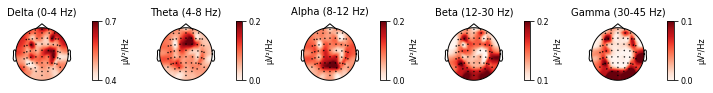

    Using multitaper spectrum estimation with 7 DPSS windows


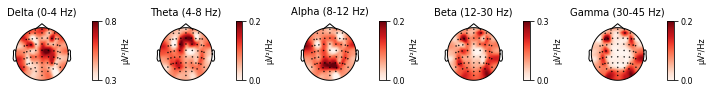

    Using multitaper spectrum estimation with 7 DPSS windows


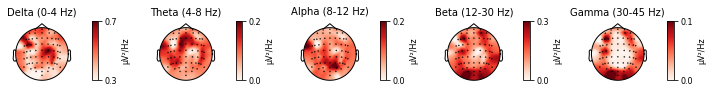

    Using multitaper spectrum estimation with 7 DPSS windows


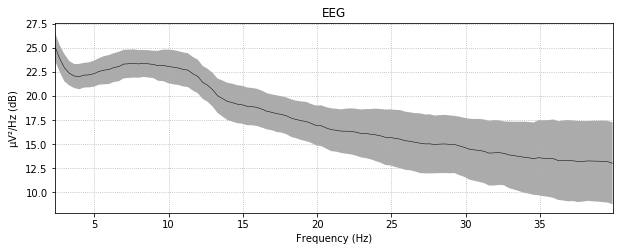

    Using multitaper spectrum estimation with 7 DPSS windows


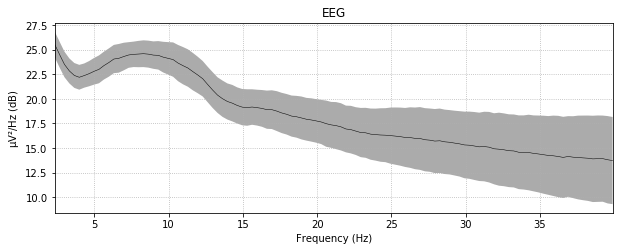

    Using multitaper spectrum estimation with 7 DPSS windows


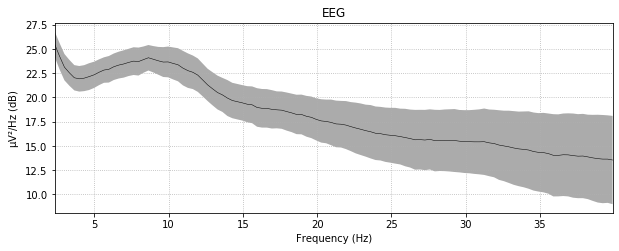

1
subj_23
    Using multitaper spectrum estimation with 7 DPSS windows


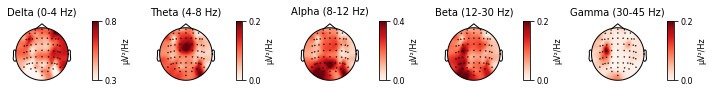

    Using multitaper spectrum estimation with 7 DPSS windows


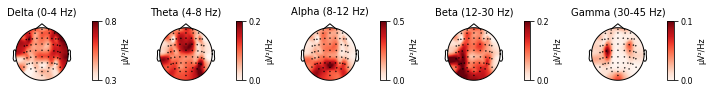

    Using multitaper spectrum estimation with 7 DPSS windows


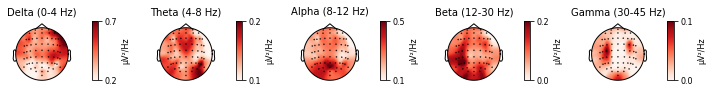

    Using multitaper spectrum estimation with 7 DPSS windows


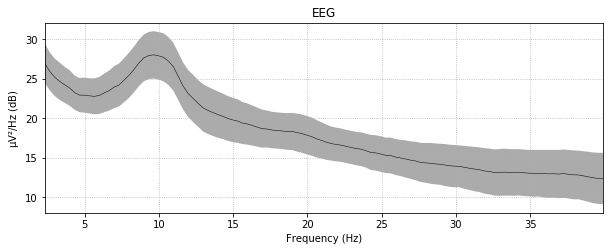

    Using multitaper spectrum estimation with 7 DPSS windows


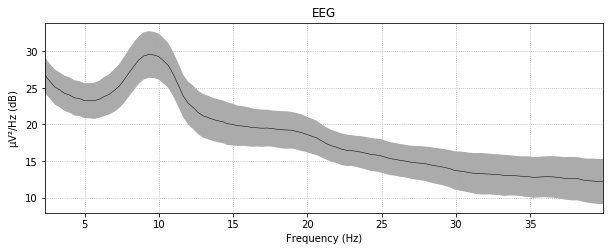

    Using multitaper spectrum estimation with 7 DPSS windows


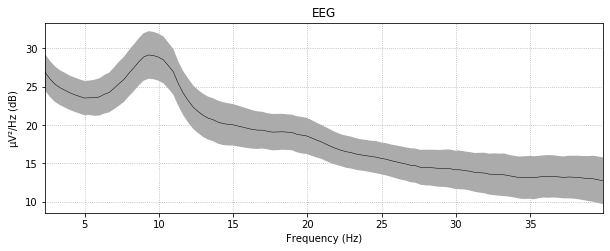

2
subj_31
    Using multitaper spectrum estimation with 7 DPSS windows


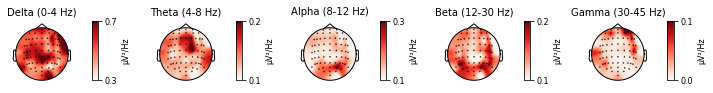

    Using multitaper spectrum estimation with 7 DPSS windows


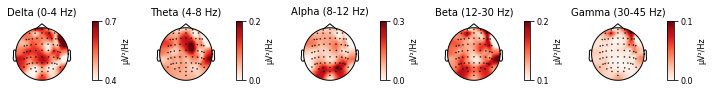

    Using multitaper spectrum estimation with 7 DPSS windows


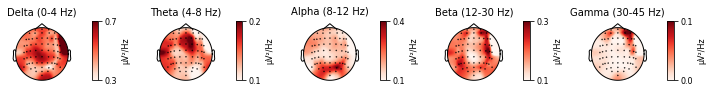

    Using multitaper spectrum estimation with 7 DPSS windows


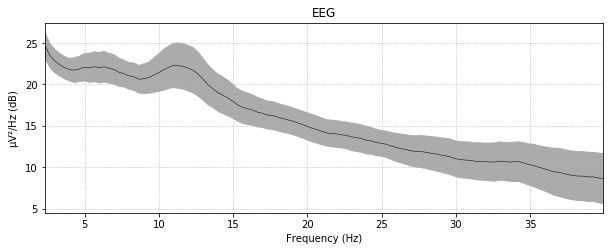

    Using multitaper spectrum estimation with 7 DPSS windows


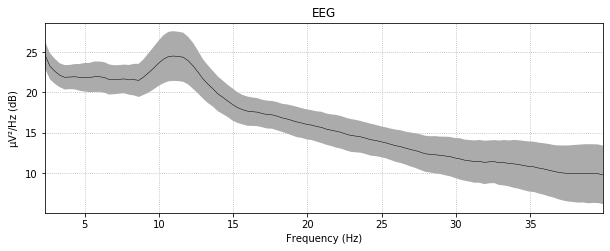

    Using multitaper spectrum estimation with 7 DPSS windows


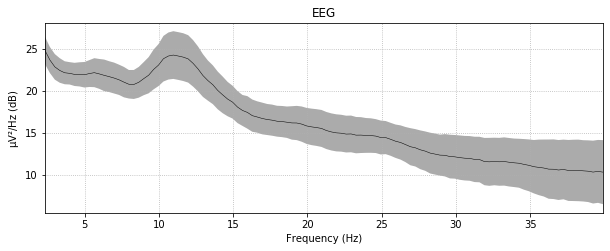

3
subj_08
    Using multitaper spectrum estimation with 7 DPSS windows


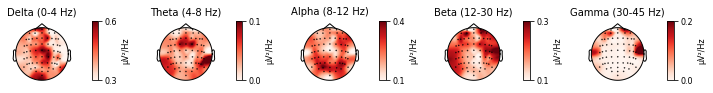

    Using multitaper spectrum estimation with 7 DPSS windows


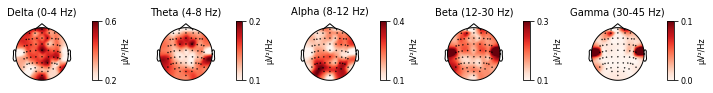

    Using multitaper spectrum estimation with 7 DPSS windows


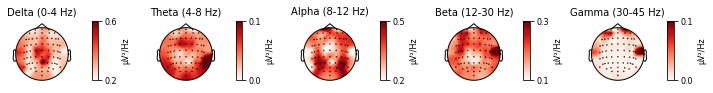

    Using multitaper spectrum estimation with 7 DPSS windows


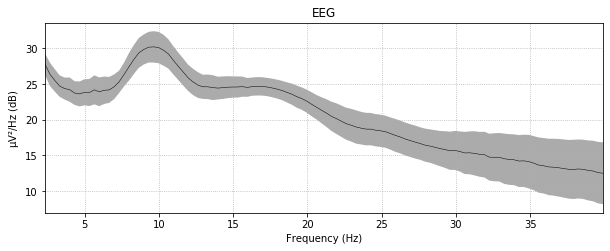

    Using multitaper spectrum estimation with 7 DPSS windows


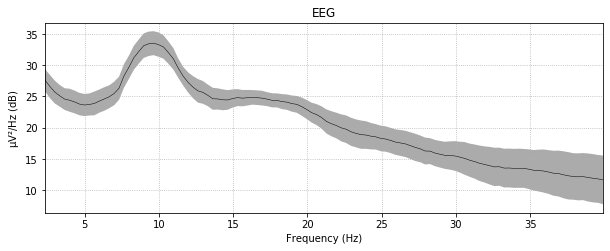

    Using multitaper spectrum estimation with 7 DPSS windows


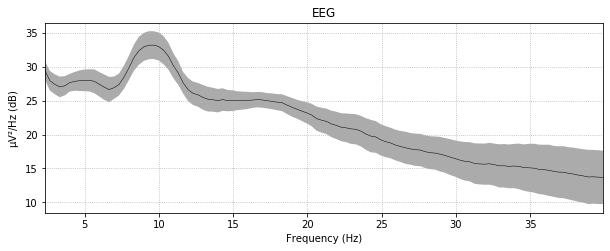

4
subj_29
    Using multitaper spectrum estimation with 7 DPSS windows


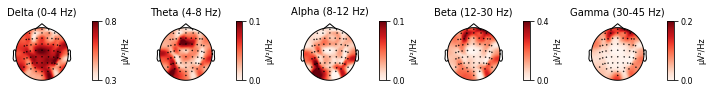

    Using multitaper spectrum estimation with 7 DPSS windows


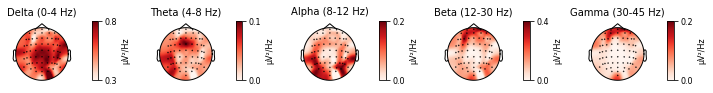

    Using multitaper spectrum estimation with 7 DPSS windows


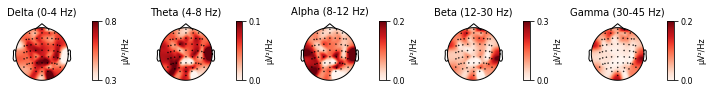

    Using multitaper spectrum estimation with 7 DPSS windows


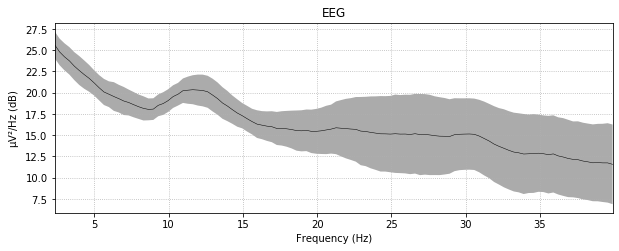

    Using multitaper spectrum estimation with 7 DPSS windows


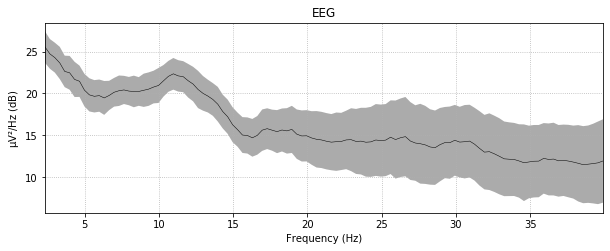

    Using multitaper spectrum estimation with 7 DPSS windows


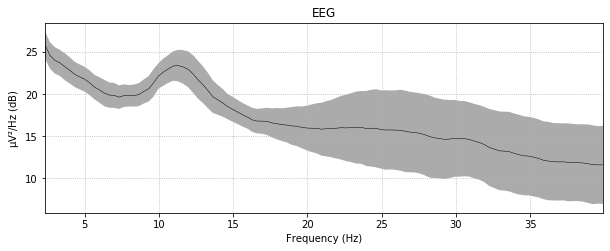

5
subj_04
    Using multitaper spectrum estimation with 7 DPSS windows


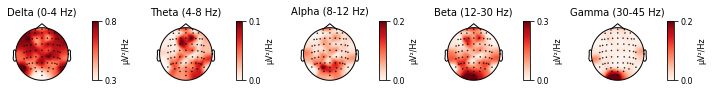

    Using multitaper spectrum estimation with 7 DPSS windows


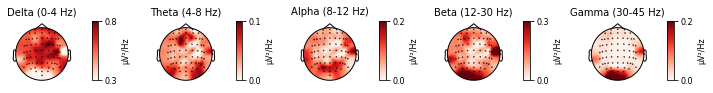

    Using multitaper spectrum estimation with 7 DPSS windows


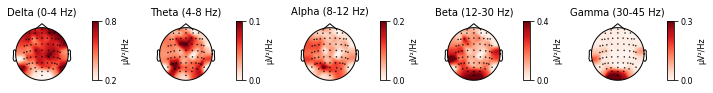

    Using multitaper spectrum estimation with 7 DPSS windows


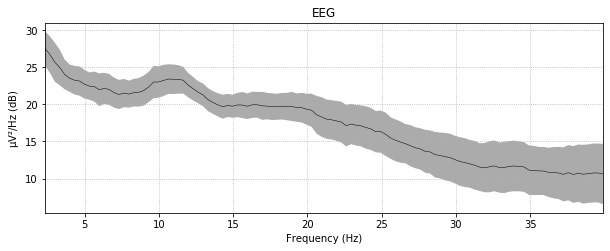

    Using multitaper spectrum estimation with 7 DPSS windows


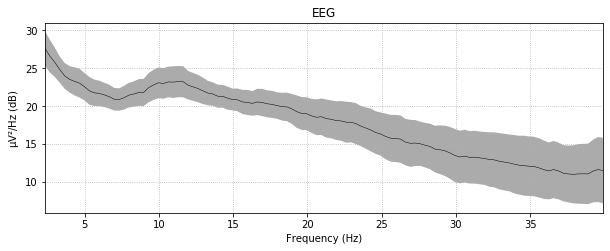

    Using multitaper spectrum estimation with 7 DPSS windows


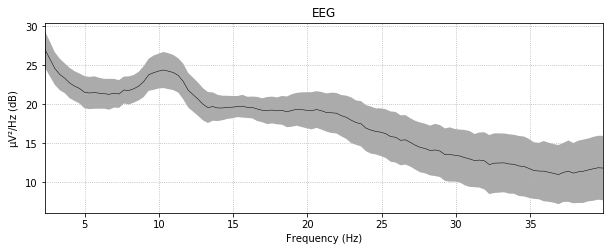

6
subj_15
    Using multitaper spectrum estimation with 7 DPSS windows


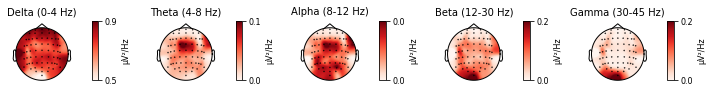

    Using multitaper spectrum estimation with 7 DPSS windows


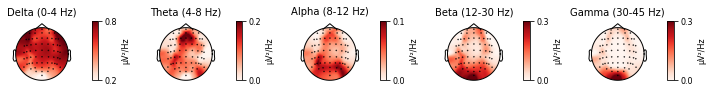

    Using multitaper spectrum estimation with 7 DPSS windows


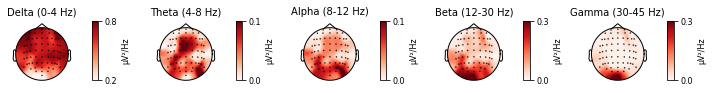

    Using multitaper spectrum estimation with 7 DPSS windows


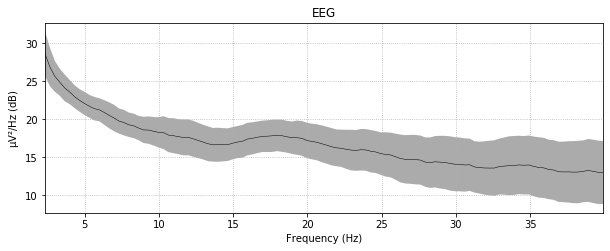

    Using multitaper spectrum estimation with 7 DPSS windows


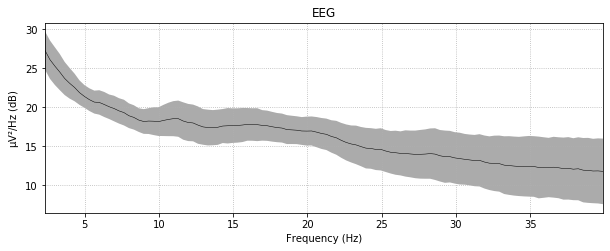

    Using multitaper spectrum estimation with 7 DPSS windows


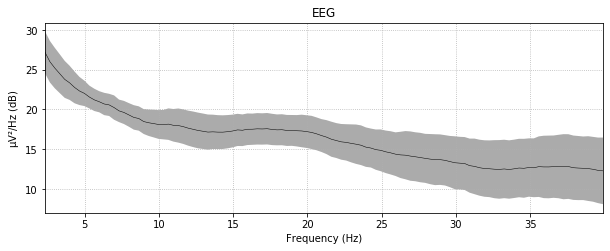

7
subj_02
    Using multitaper spectrum estimation with 7 DPSS windows


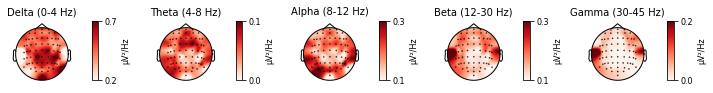

    Using multitaper spectrum estimation with 7 DPSS windows


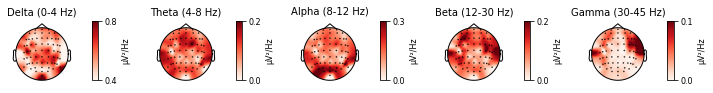

    Using multitaper spectrum estimation with 7 DPSS windows


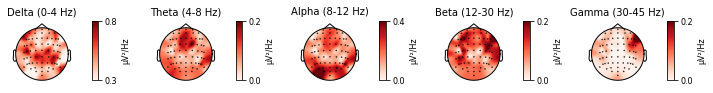

    Using multitaper spectrum estimation with 7 DPSS windows


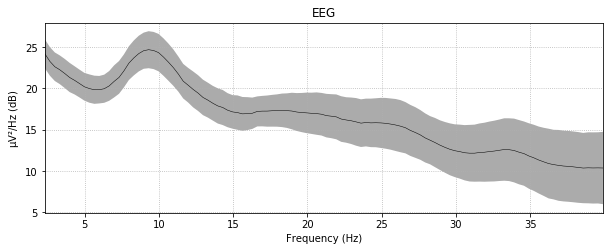

    Using multitaper spectrum estimation with 7 DPSS windows


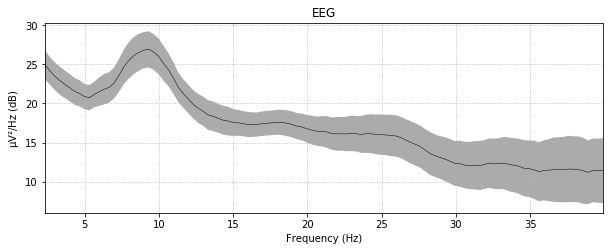

    Using multitaper spectrum estimation with 7 DPSS windows


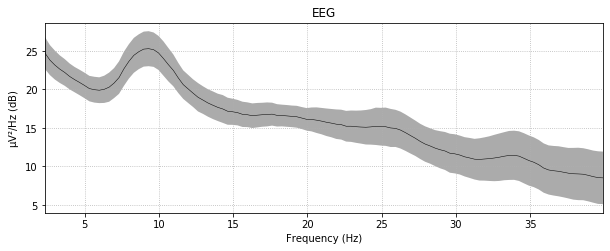

8
subj_37
    Using multitaper spectrum estimation with 7 DPSS windows


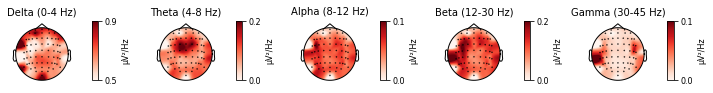

    Using multitaper spectrum estimation with 7 DPSS windows


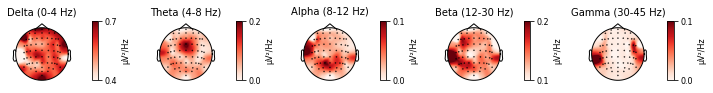

    Using multitaper spectrum estimation with 7 DPSS windows


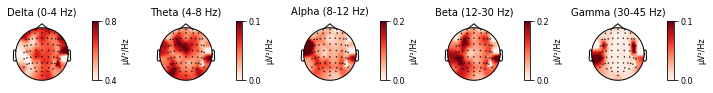

    Using multitaper spectrum estimation with 7 DPSS windows


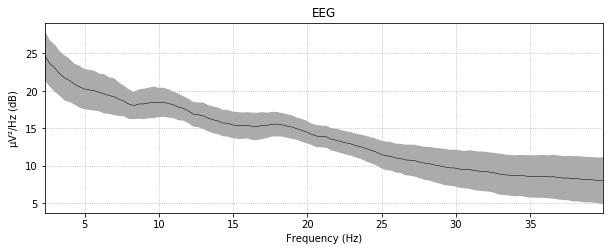

    Using multitaper spectrum estimation with 7 DPSS windows


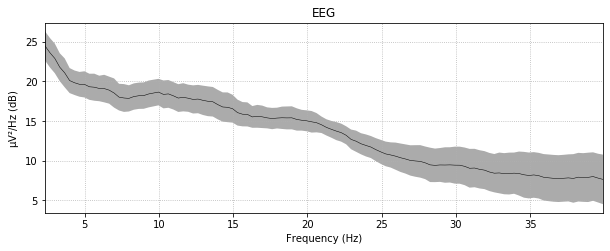

    Using multitaper spectrum estimation with 7 DPSS windows


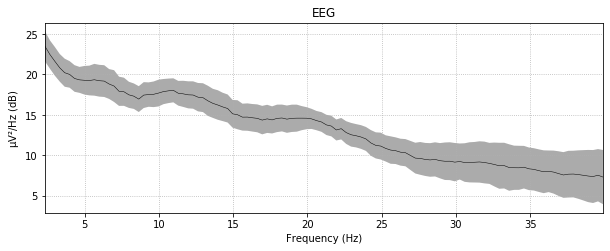

9
subj_10
    Using multitaper spectrum estimation with 7 DPSS windows


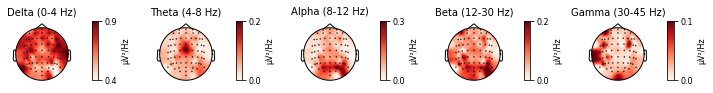

    Using multitaper spectrum estimation with 7 DPSS windows


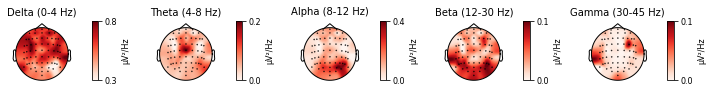

    Using multitaper spectrum estimation with 7 DPSS windows


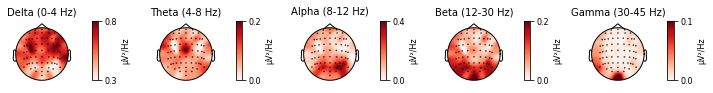

    Using multitaper spectrum estimation with 7 DPSS windows


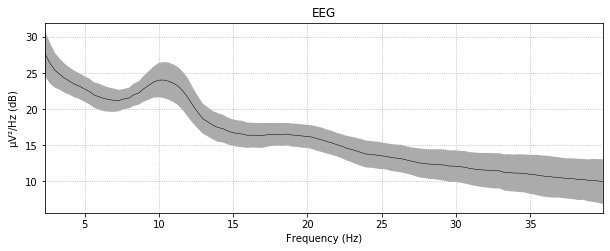

    Using multitaper spectrum estimation with 7 DPSS windows


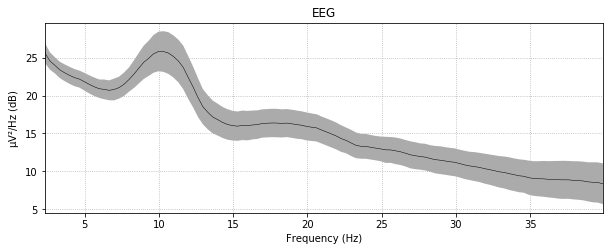

    Using multitaper spectrum estimation with 7 DPSS windows


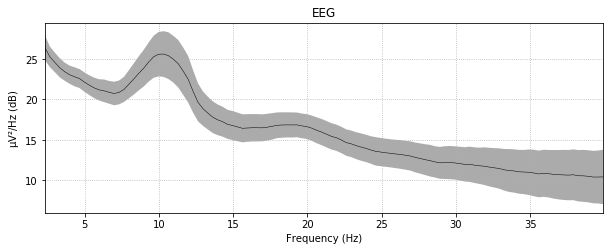

10
subj_06
    Using multitaper spectrum estimation with 7 DPSS windows


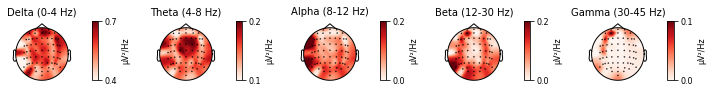

    Using multitaper spectrum estimation with 7 DPSS windows


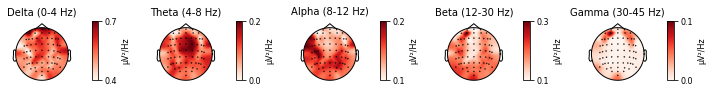

    Using multitaper spectrum estimation with 7 DPSS windows


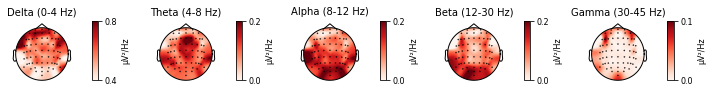

    Using multitaper spectrum estimation with 7 DPSS windows


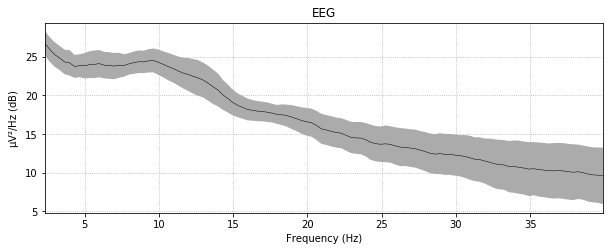

    Using multitaper spectrum estimation with 7 DPSS windows


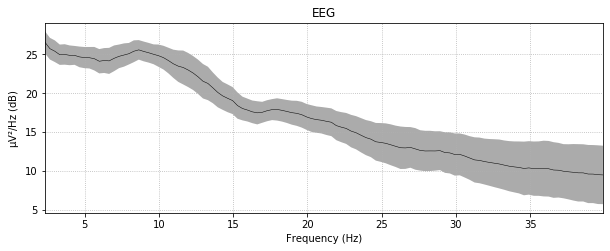

    Using multitaper spectrum estimation with 7 DPSS windows


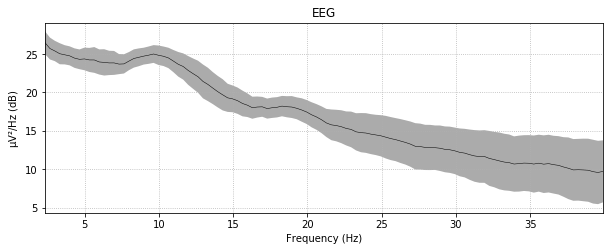

11
subj_17
    Using multitaper spectrum estimation with 7 DPSS windows


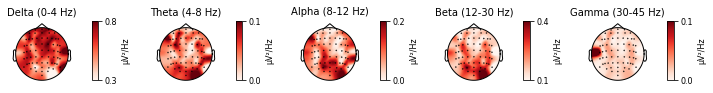

    Using multitaper spectrum estimation with 7 DPSS windows


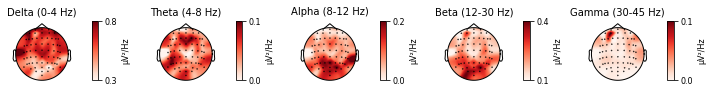

    Using multitaper spectrum estimation with 7 DPSS windows


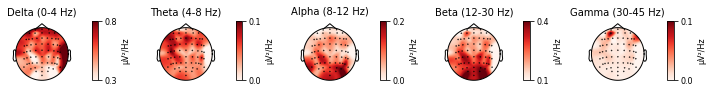

    Using multitaper spectrum estimation with 7 DPSS windows


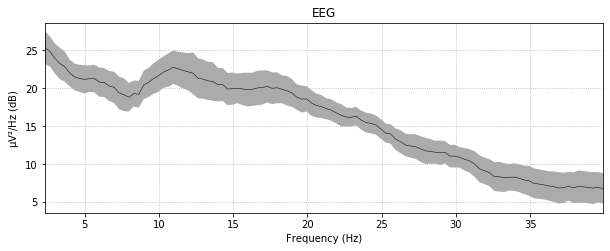

    Using multitaper spectrum estimation with 7 DPSS windows


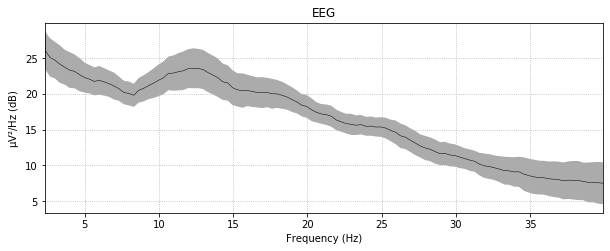

    Using multitaper spectrum estimation with 7 DPSS windows


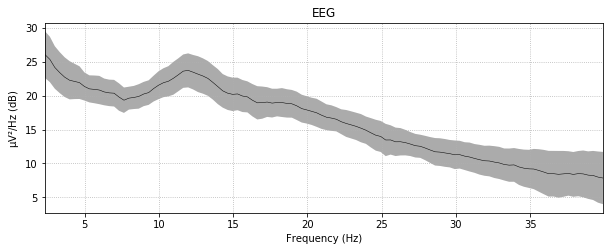

12
subj_27
    Using multitaper spectrum estimation with 7 DPSS windows


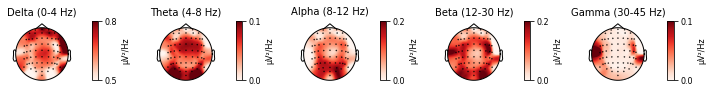

    Using multitaper spectrum estimation with 7 DPSS windows


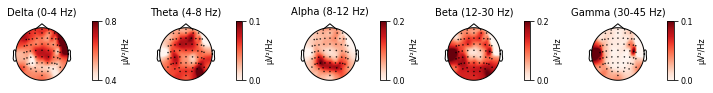

    Using multitaper spectrum estimation with 7 DPSS windows


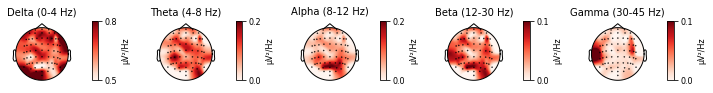

    Using multitaper spectrum estimation with 7 DPSS windows


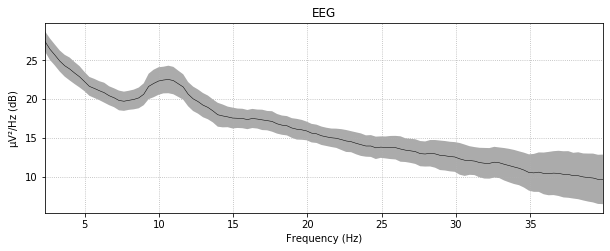

    Using multitaper spectrum estimation with 7 DPSS windows


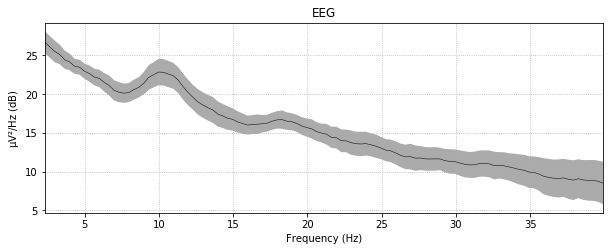

    Using multitaper spectrum estimation with 7 DPSS windows


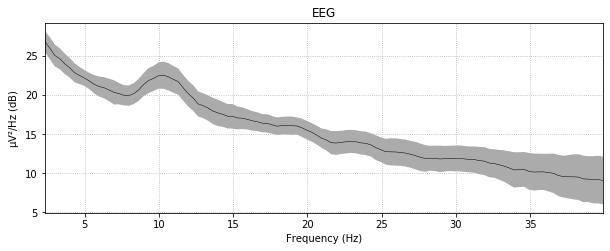

13
subj_33
    Using multitaper spectrum estimation with 7 DPSS windows


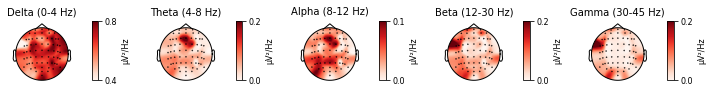

    Using multitaper spectrum estimation with 7 DPSS windows


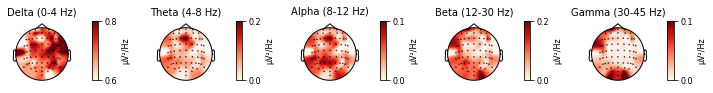

    Using multitaper spectrum estimation with 7 DPSS windows


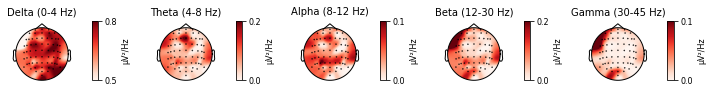

    Using multitaper spectrum estimation with 7 DPSS windows


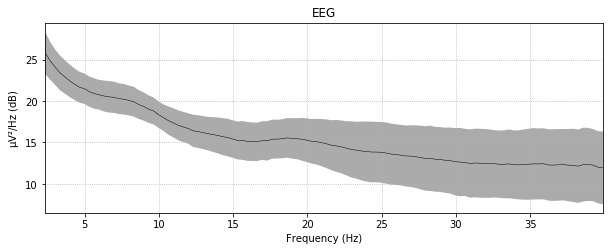

    Using multitaper spectrum estimation with 7 DPSS windows


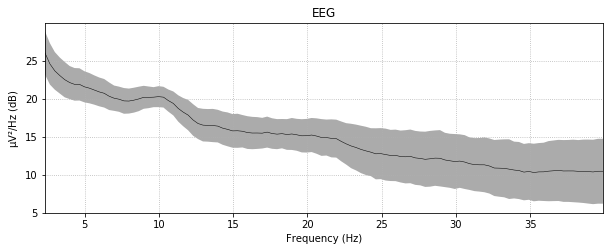

    Using multitaper spectrum estimation with 7 DPSS windows


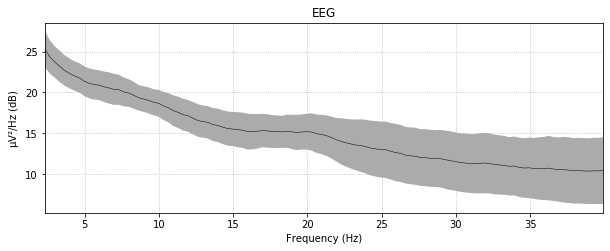

14
subj_19
    Using multitaper spectrum estimation with 7 DPSS windows


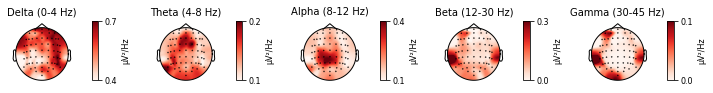

    Using multitaper spectrum estimation with 7 DPSS windows


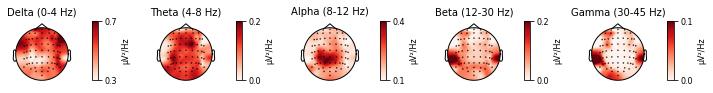

    Using multitaper spectrum estimation with 7 DPSS windows


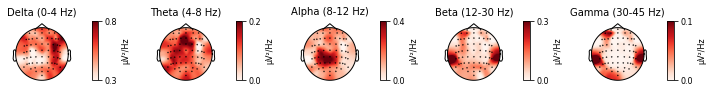

    Using multitaper spectrum estimation with 7 DPSS windows


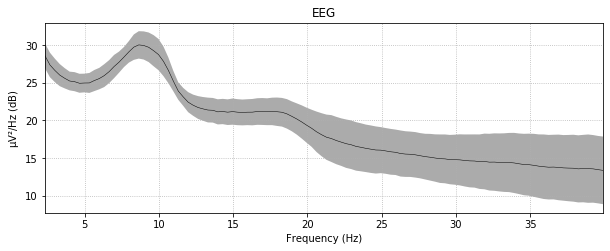

    Using multitaper spectrum estimation with 7 DPSS windows


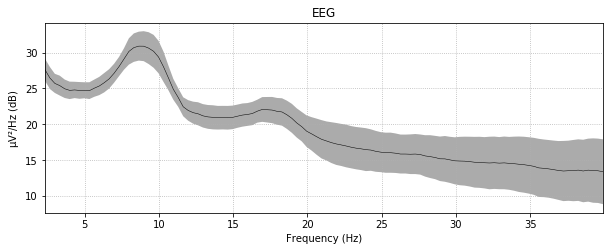

    Using multitaper spectrum estimation with 7 DPSS windows


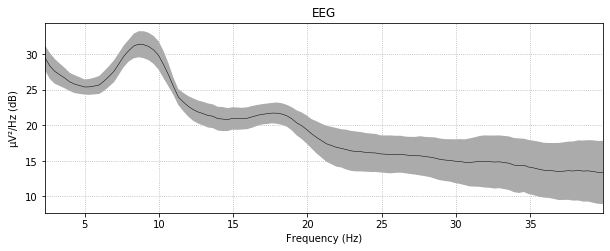

15
subj_38
    Using multitaper spectrum estimation with 7 DPSS windows


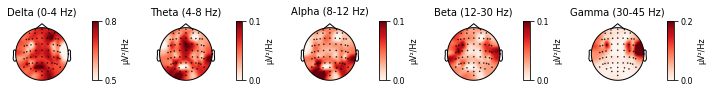

    Using multitaper spectrum estimation with 7 DPSS windows


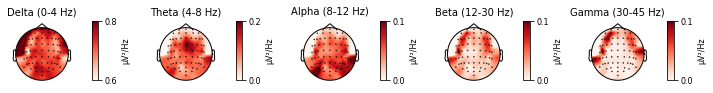

    Using multitaper spectrum estimation with 7 DPSS windows


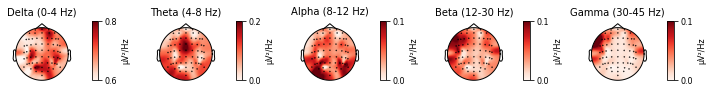

    Using multitaper spectrum estimation with 7 DPSS windows


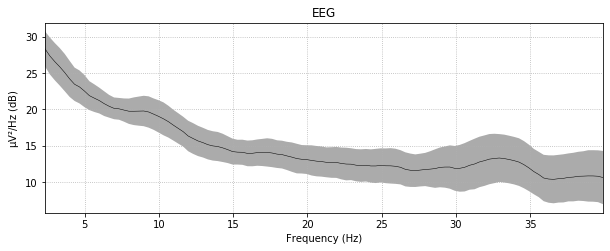

    Using multitaper spectrum estimation with 7 DPSS windows


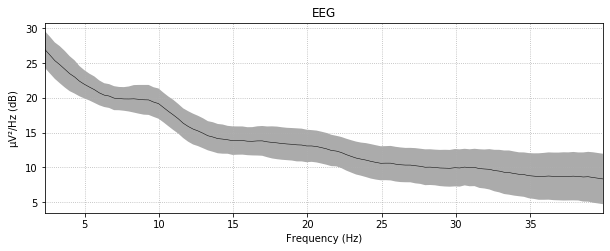

    Using multitaper spectrum estimation with 7 DPSS windows


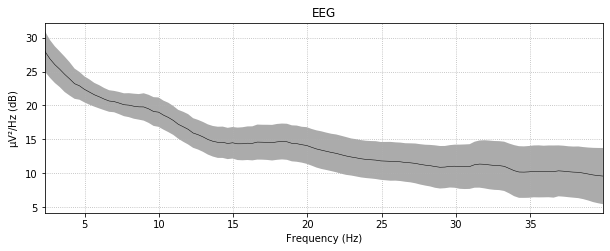

16
subj_13
    Using multitaper spectrum estimation with 7 DPSS windows


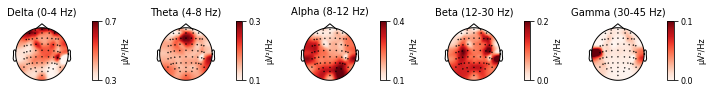

    Using multitaper spectrum estimation with 7 DPSS windows


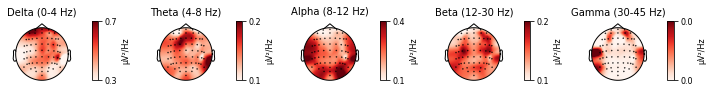

    Using multitaper spectrum estimation with 7 DPSS windows


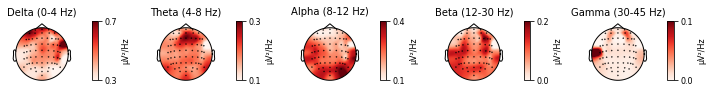

    Using multitaper spectrum estimation with 7 DPSS windows


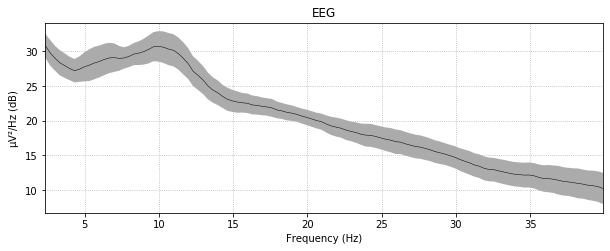

    Using multitaper spectrum estimation with 7 DPSS windows


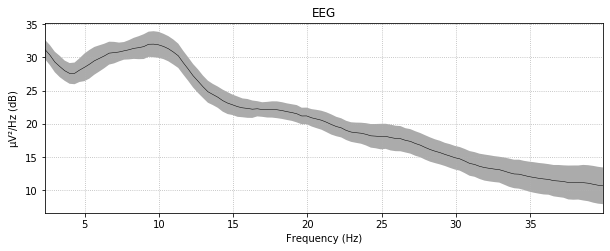

    Using multitaper spectrum estimation with 7 DPSS windows


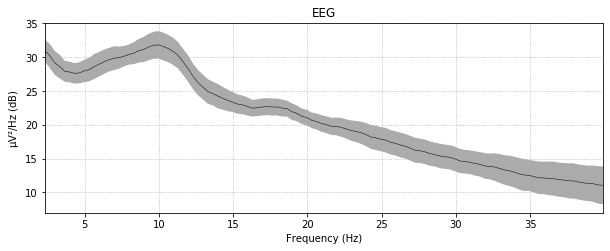

In [6]:
for i, j in enumerate(pos_incongruent_incorrect_erps_base.keys()):
    print(i)
    print(j)
    pos_incon_incorr_epochs_base = pos_incongruent_incorrect_base[j]
    pos_incon_incorr_epochs_pos = pos_incongruent_incorrect_pos[j]
    pos_incon_incorr_epochs_neg = pos_incongruent_incorrect_neg[j]

    pos_incon_incorr_epochs_base.plot_psd_topomap(ch_type='eeg', normalize=True);
    pos_incon_incorr_epochs_pos.plot_psd_topomap(ch_type='eeg', normalize=True);
    pos_incon_incorr_epochs_neg.plot_psd_topomap(ch_type='eeg', normalize=True);
    
    pos_incon_incorr_epochs_base.plot_psd(fmin=2., fmax=40., average=True, spatial_colors=False);
    pos_incon_incorr_epochs_neg.plot_psd(fmin=2., fmax=40., average=True, spatial_colors=False);
    pos_incon_incorr_epochs_pos.plot_psd(fmin=2., fmax=40., average=True, spatial_colors=False);

0
subj_07
baseline
    Using multitaper spectrum estimation with 7 DPSS windows


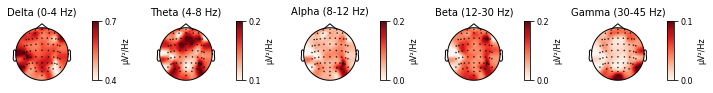

negative
    Using multitaper spectrum estimation with 7 DPSS windows


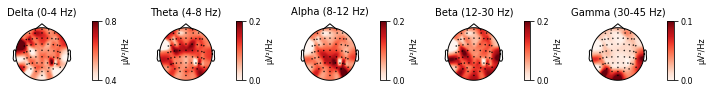

positive
    Using multitaper spectrum estimation with 7 DPSS windows


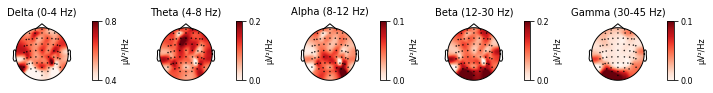

baseline
    Using multitaper spectrum estimation with 7 DPSS windows


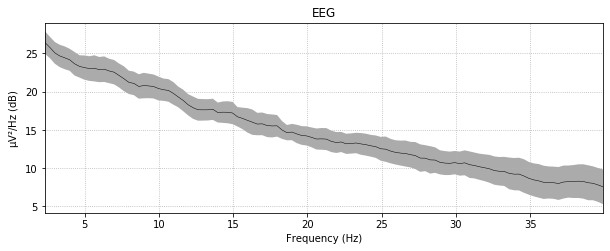

negative
    Using multitaper spectrum estimation with 7 DPSS windows


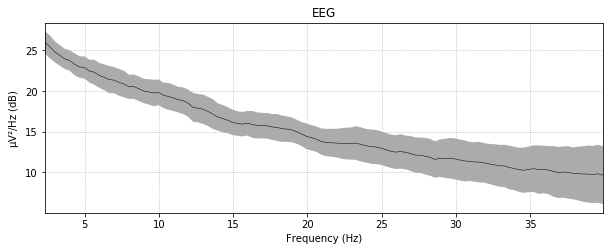

positive
    Using multitaper spectrum estimation with 7 DPSS windows


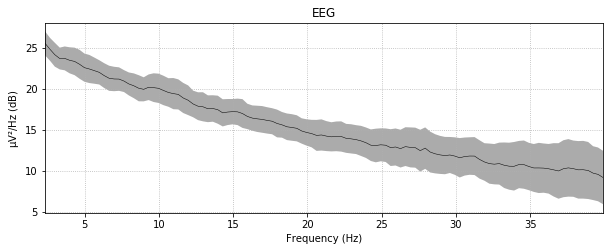

    Using multitaper spectrum estimation with 7 DPSS windows


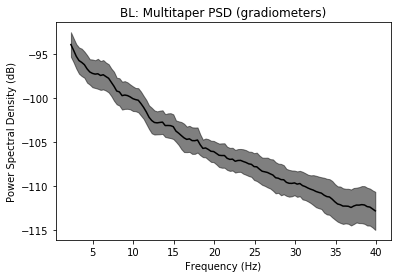

    Using multitaper spectrum estimation with 7 DPSS windows


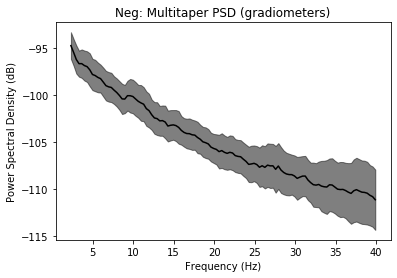

    Using multitaper spectrum estimation with 7 DPSS windows


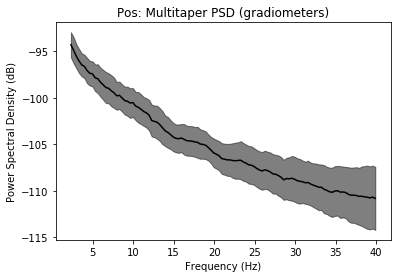

Effective window size : 2.000 (s)
Effective window size : 2.000 (s)


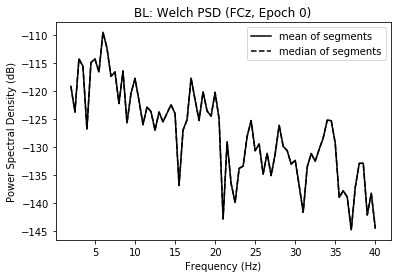

Effective window size : 2.000 (s)
Effective window size : 2.000 (s)


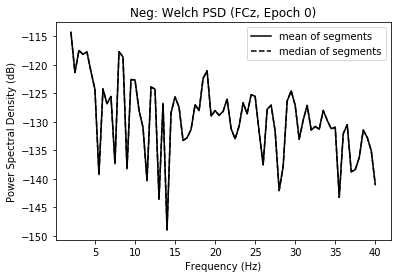

Effective window size : 2.000 (s)
Effective window size : 2.000 (s)


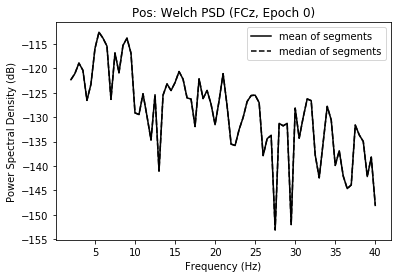

Applying baseline correction (mode: logratio)


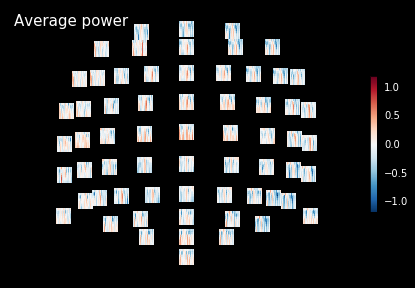

Applying baseline correction (mode: logratio)


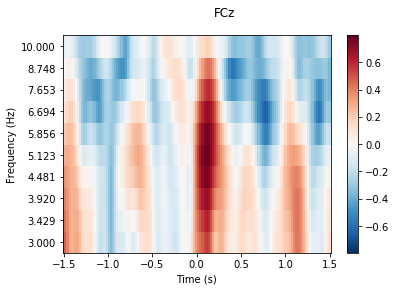

Applying baseline correction (mode: logratio)


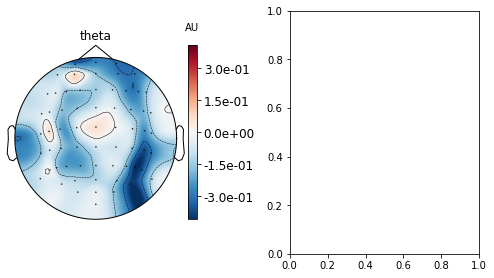

baseline
No baseline correction applied


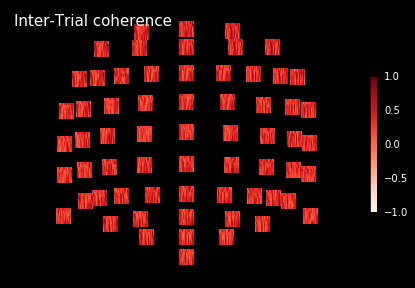

Applying baseline correction (mode: logratio)


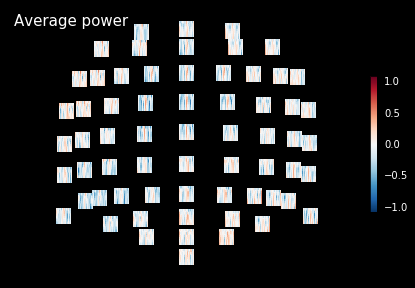

Applying baseline correction (mode: logratio)


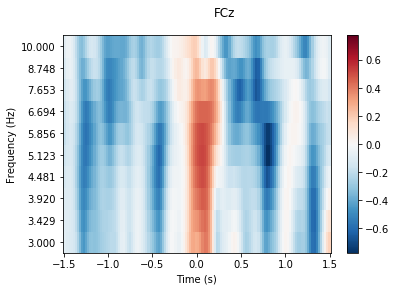

Applying baseline correction (mode: logratio)


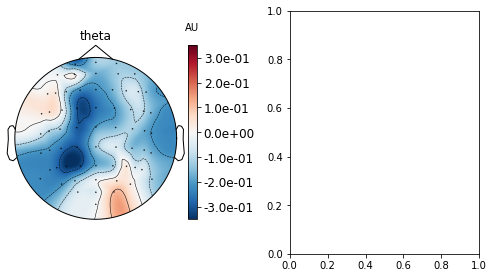

negative
No baseline correction applied


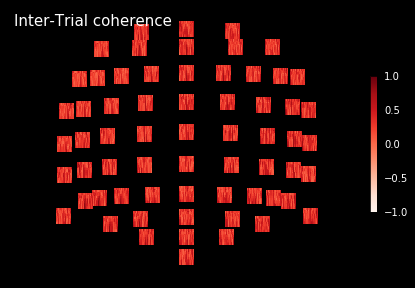

Applying baseline correction (mode: logratio)


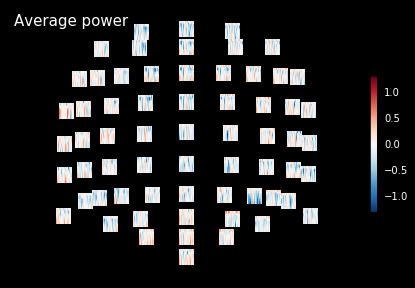

Applying baseline correction (mode: logratio)


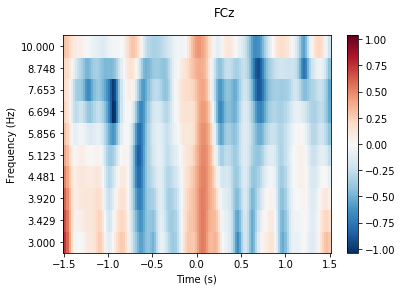

Applying baseline correction (mode: logratio)


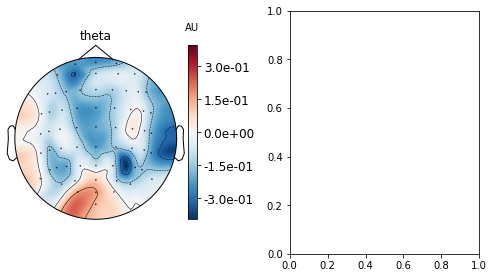

positive
No baseline correction applied


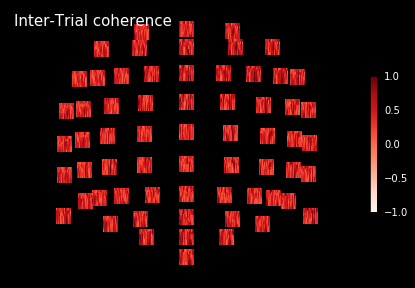

1
subj_09
baseline
    Using multitaper spectrum estimation with 7 DPSS windows


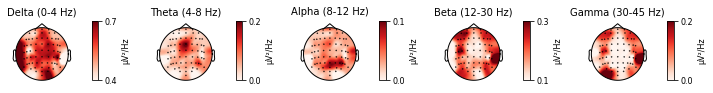

negative
    Using multitaper spectrum estimation with 7 DPSS windows


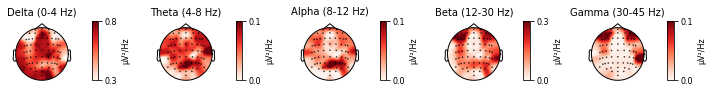

positive
    Using multitaper spectrum estimation with 7 DPSS windows


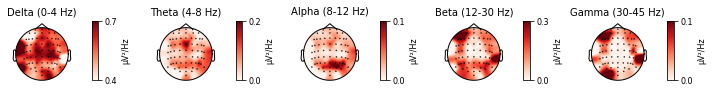

baseline
    Using multitaper spectrum estimation with 7 DPSS windows


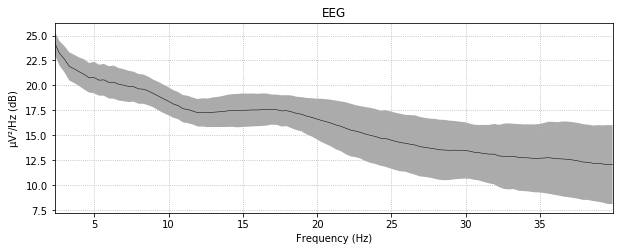

negative
    Using multitaper spectrum estimation with 7 DPSS windows


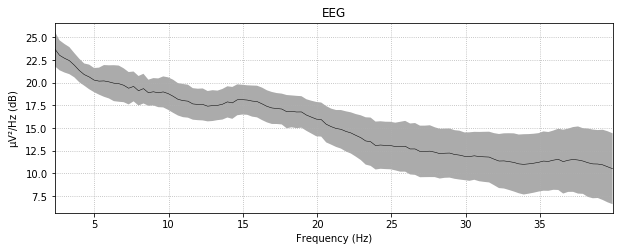

positive
    Using multitaper spectrum estimation with 7 DPSS windows


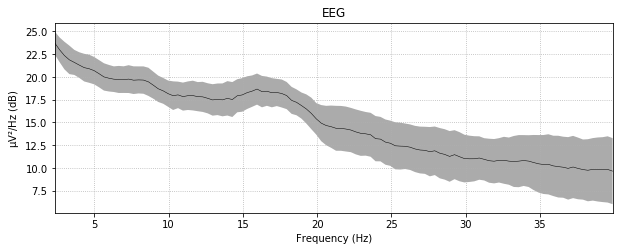

    Using multitaper spectrum estimation with 7 DPSS windows


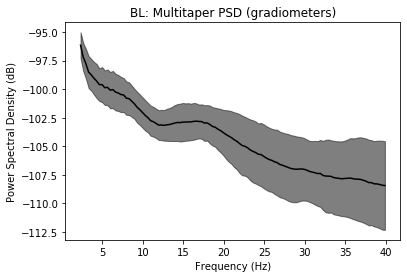

    Using multitaper spectrum estimation with 7 DPSS windows


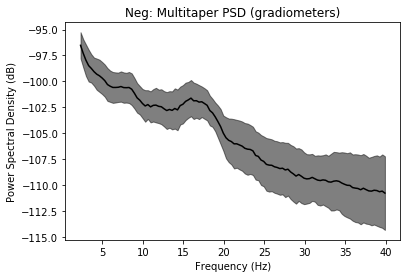

    Using multitaper spectrum estimation with 7 DPSS windows


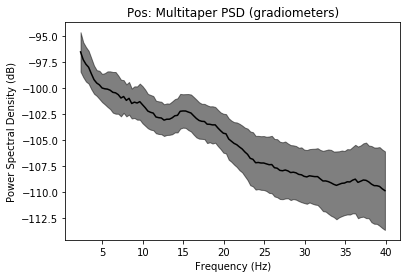

Effective window size : 2.000 (s)
Effective window size : 2.000 (s)


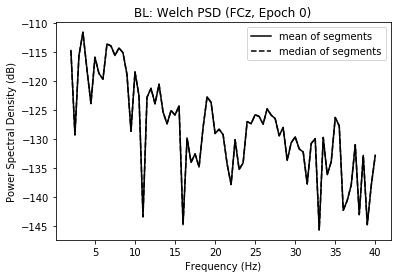

Effective window size : 2.000 (s)
Effective window size : 2.000 (s)


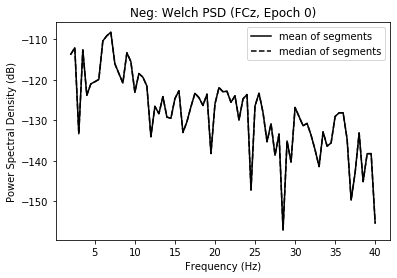

Effective window size : 2.000 (s)
Effective window size : 2.000 (s)


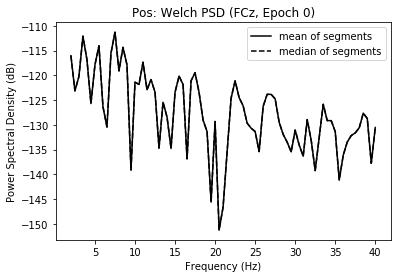

Applying baseline correction (mode: logratio)


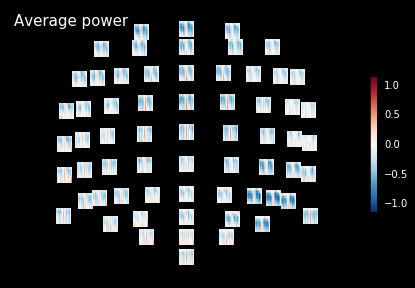

Applying baseline correction (mode: logratio)


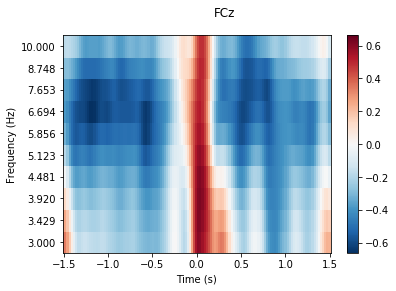

Applying baseline correction (mode: logratio)


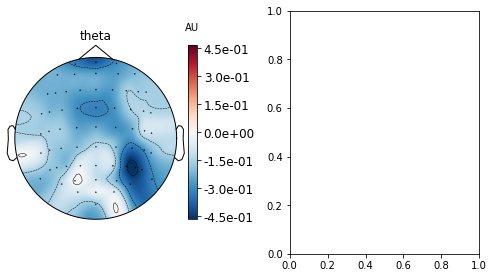

baseline
No baseline correction applied


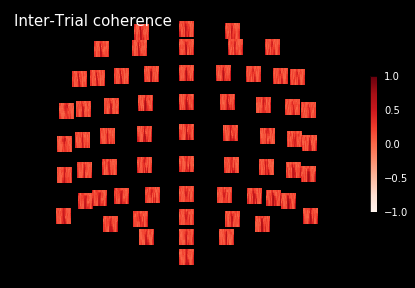

Applying baseline correction (mode: logratio)


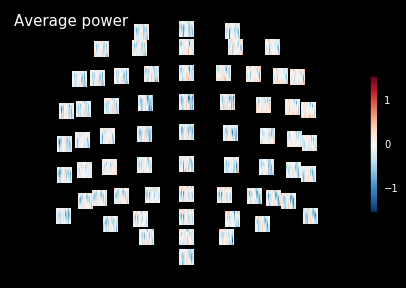

Applying baseline correction (mode: logratio)


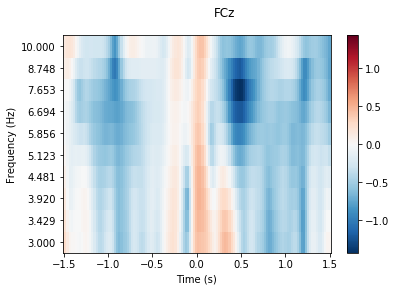

Applying baseline correction (mode: logratio)


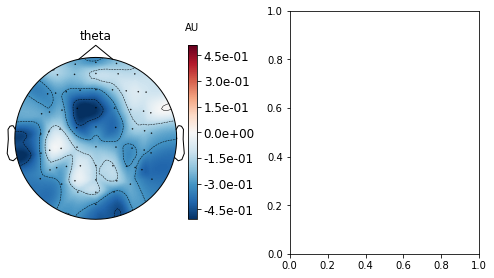

negative
No baseline correction applied


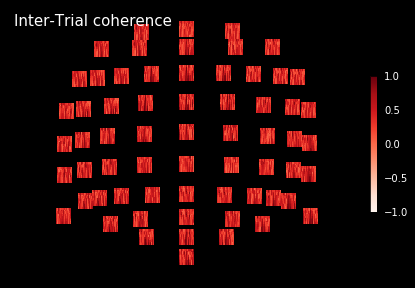

Applying baseline correction (mode: logratio)


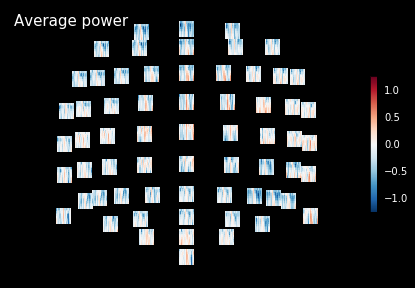

Applying baseline correction (mode: logratio)


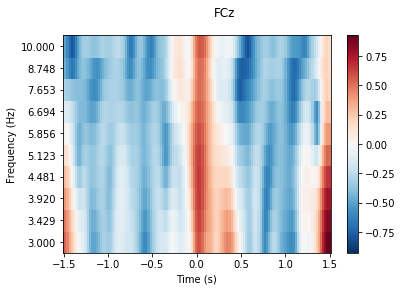

Applying baseline correction (mode: logratio)


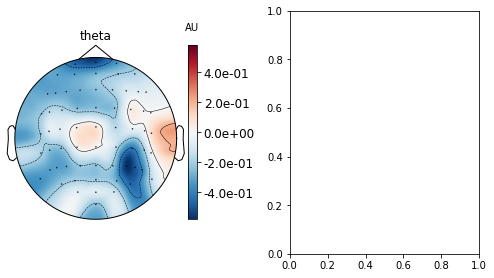

positive
No baseline correction applied


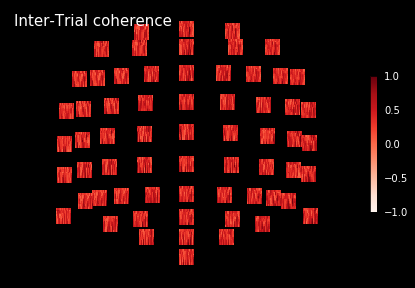

2
subj_18
baseline
    Using multitaper spectrum estimation with 7 DPSS windows


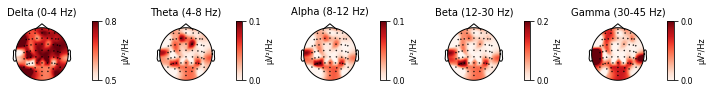

negative
    Using multitaper spectrum estimation with 7 DPSS windows


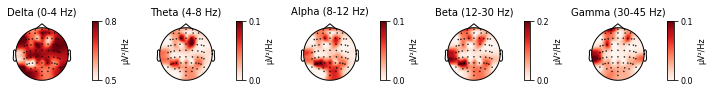

positive
    Using multitaper spectrum estimation with 7 DPSS windows


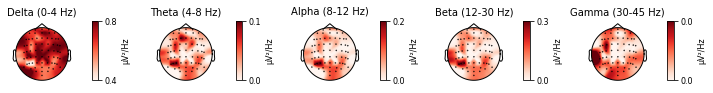

baseline
    Using multitaper spectrum estimation with 7 DPSS windows


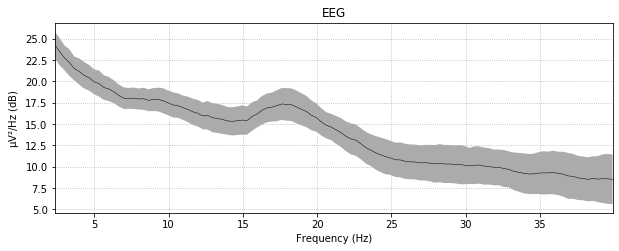

negative
    Using multitaper spectrum estimation with 7 DPSS windows


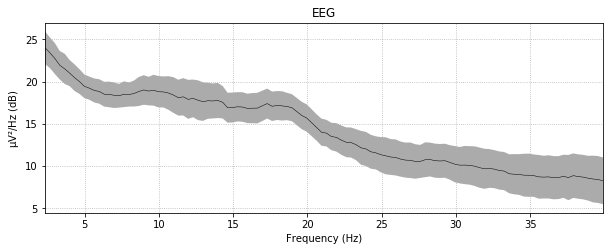

positive
    Using multitaper spectrum estimation with 7 DPSS windows


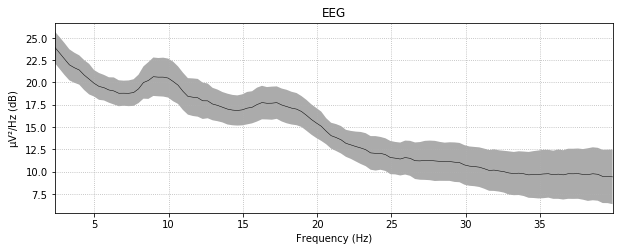

    Using multitaper spectrum estimation with 7 DPSS windows


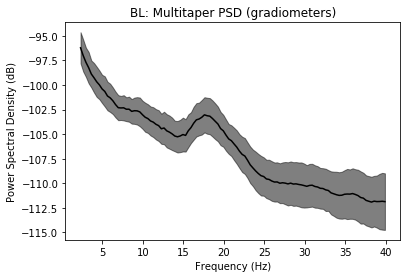

    Using multitaper spectrum estimation with 7 DPSS windows


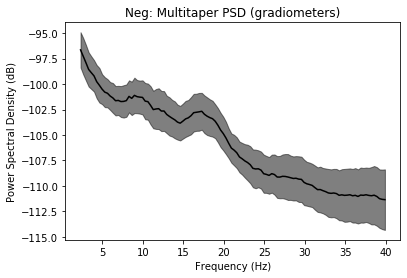

    Using multitaper spectrum estimation with 7 DPSS windows


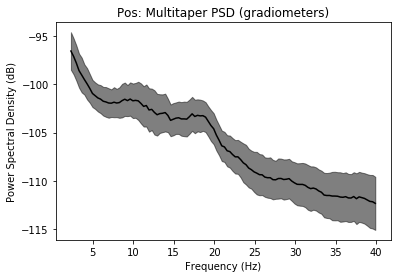

Effective window size : 2.000 (s)
Effective window size : 2.000 (s)


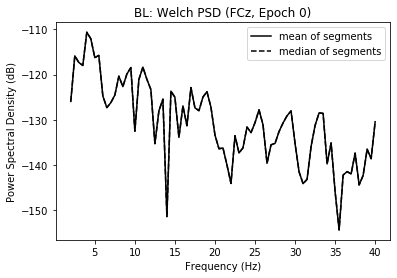

Effective window size : 2.000 (s)
Effective window size : 2.000 (s)


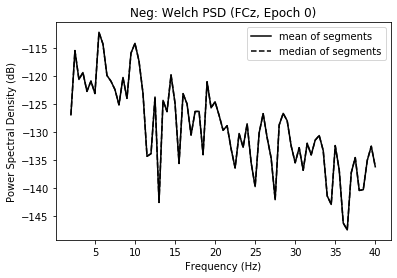

Effective window size : 2.000 (s)
Effective window size : 2.000 (s)


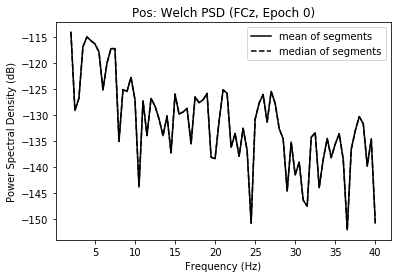

Applying baseline correction (mode: logratio)


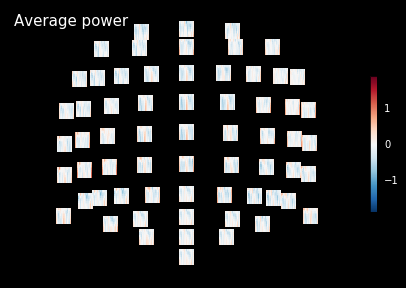

Applying baseline correction (mode: logratio)


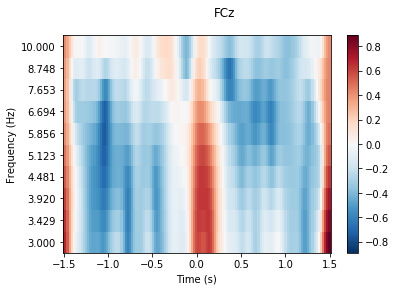

Applying baseline correction (mode: logratio)


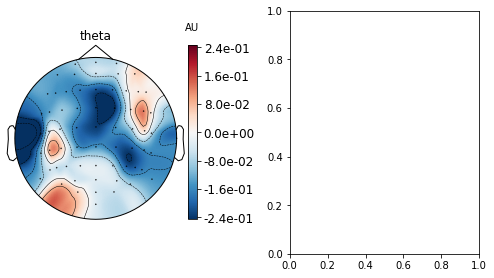

baseline
No baseline correction applied


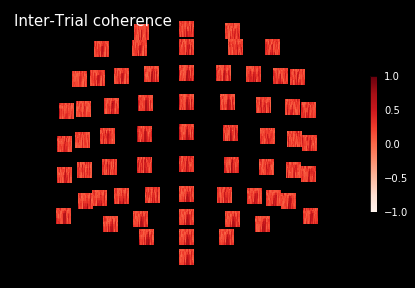

Applying baseline correction (mode: logratio)


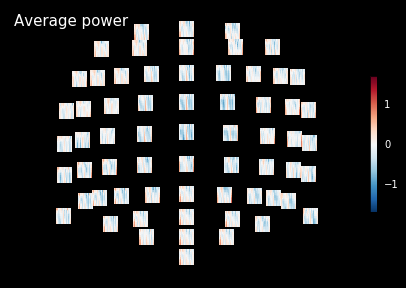

Applying baseline correction (mode: logratio)


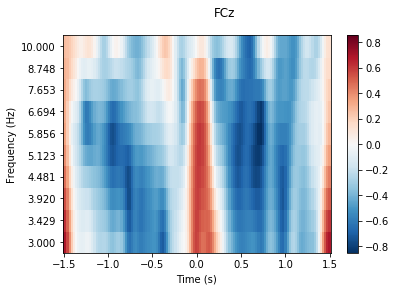

Applying baseline correction (mode: logratio)


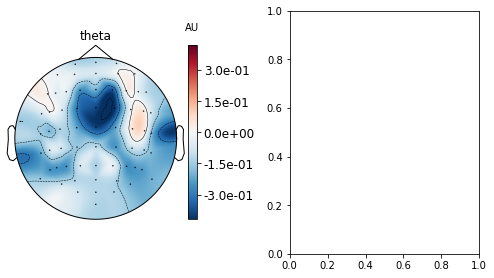

negative
No baseline correction applied


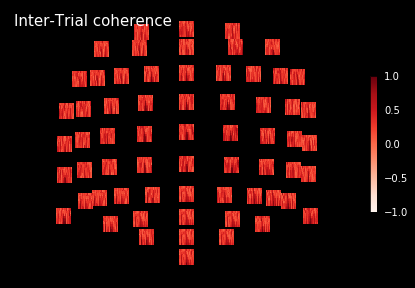

Applying baseline correction (mode: logratio)


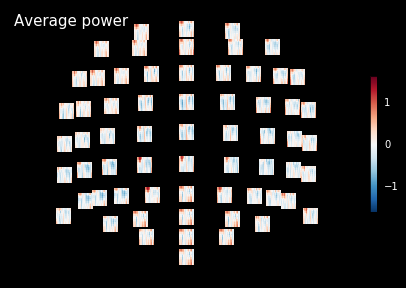

Applying baseline correction (mode: logratio)


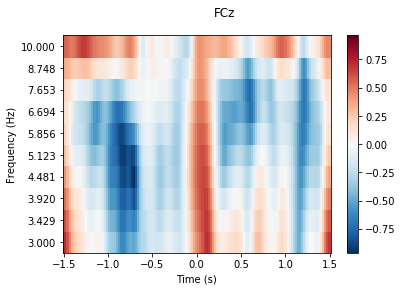

Applying baseline correction (mode: logratio)


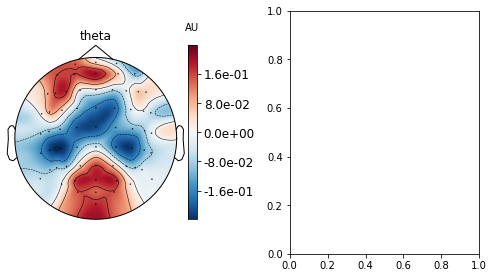

positive
No baseline correction applied


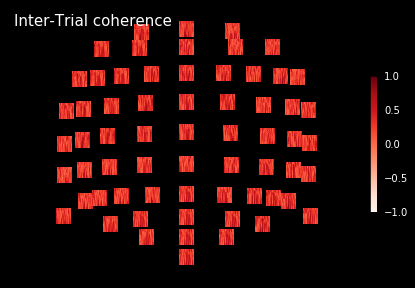

3
subj_22
baseline
    Using multitaper spectrum estimation with 7 DPSS windows


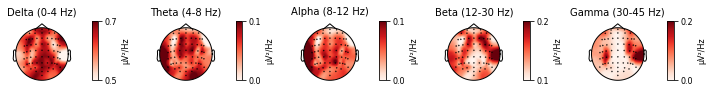

negative
    Using multitaper spectrum estimation with 7 DPSS windows


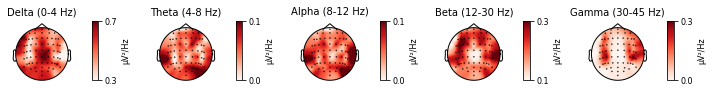

positive
    Using multitaper spectrum estimation with 7 DPSS windows


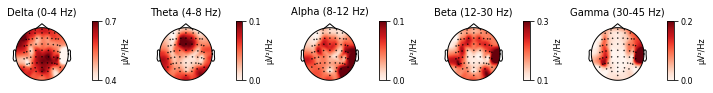

baseline
    Using multitaper spectrum estimation with 7 DPSS windows


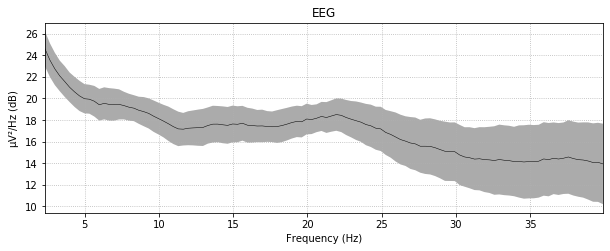

negative
    Using multitaper spectrum estimation with 7 DPSS windows


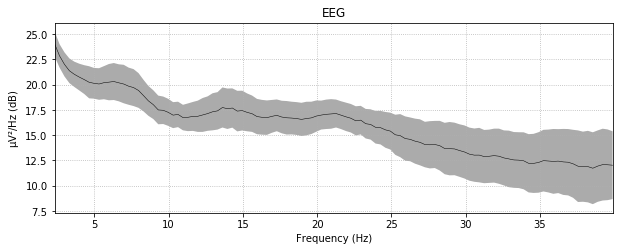

positive
    Using multitaper spectrum estimation with 7 DPSS windows


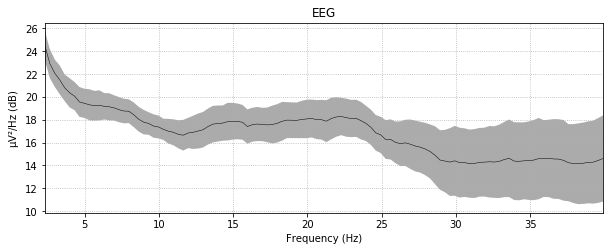

    Using multitaper spectrum estimation with 7 DPSS windows


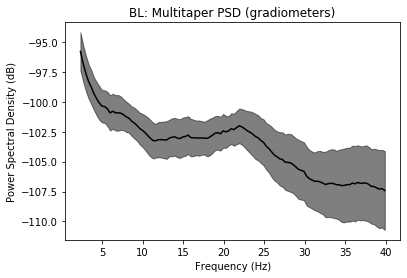

    Using multitaper spectrum estimation with 7 DPSS windows


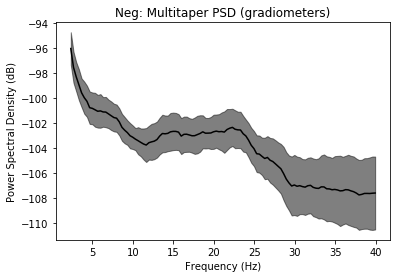

    Using multitaper spectrum estimation with 7 DPSS windows


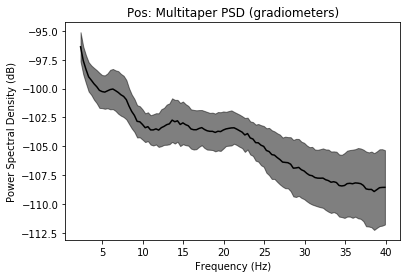

Effective window size : 2.000 (s)
Effective window size : 2.000 (s)


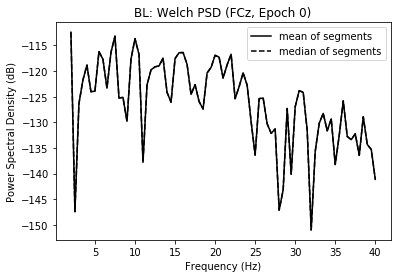

Effective window size : 2.000 (s)
Effective window size : 2.000 (s)


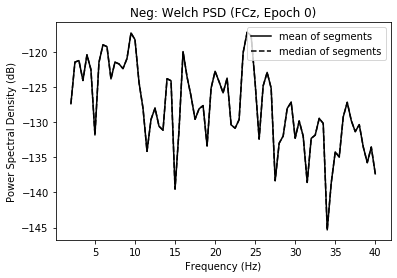

Effective window size : 2.000 (s)
Effective window size : 2.000 (s)


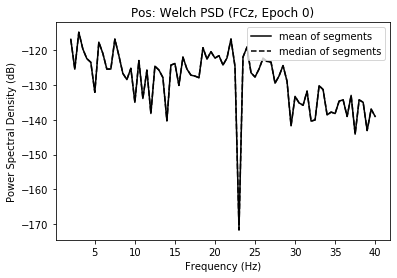

Applying baseline correction (mode: logratio)


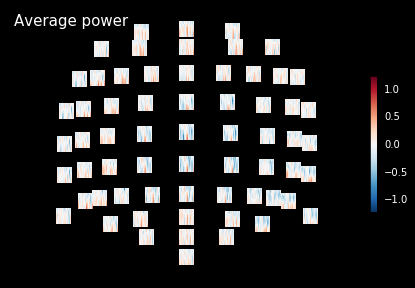

Applying baseline correction (mode: logratio)


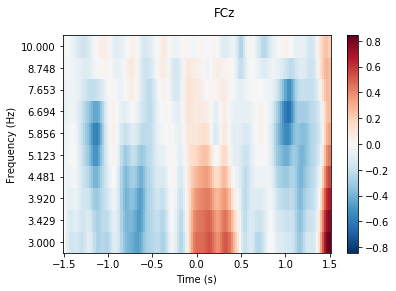

Applying baseline correction (mode: logratio)


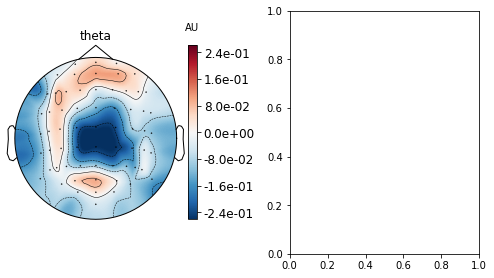

baseline
No baseline correction applied


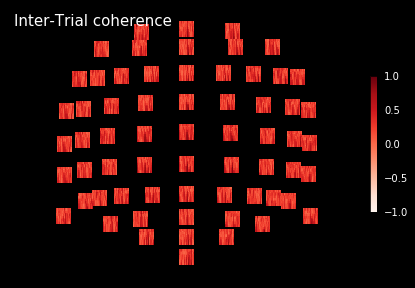

Applying baseline correction (mode: logratio)


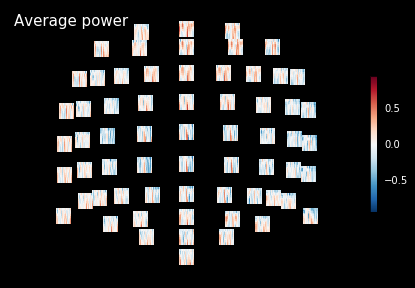

Applying baseline correction (mode: logratio)


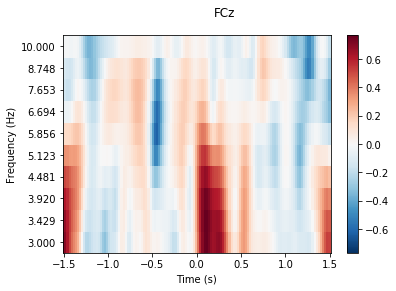

Applying baseline correction (mode: logratio)


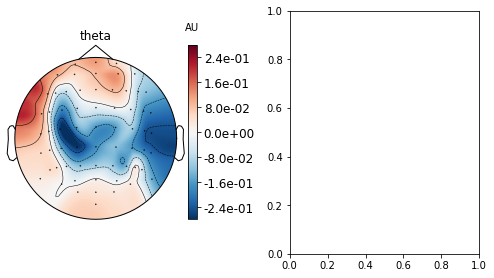

negative
No baseline correction applied


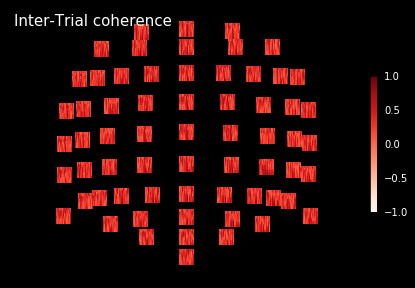

Applying baseline correction (mode: logratio)


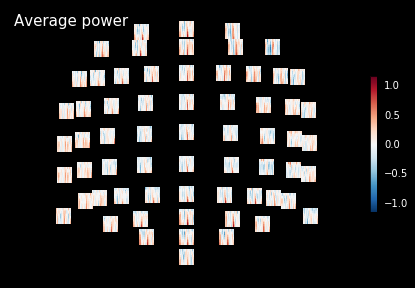

Applying baseline correction (mode: logratio)


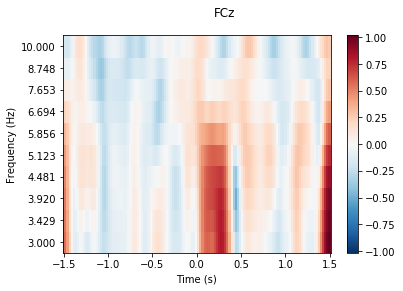

Applying baseline correction (mode: logratio)


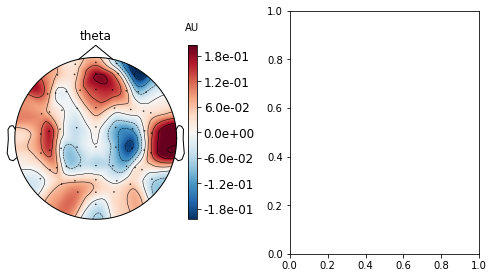

positive
No baseline correction applied


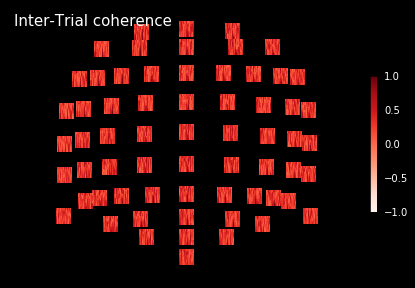

4
subj_36
baseline
    Using multitaper spectrum estimation with 7 DPSS windows


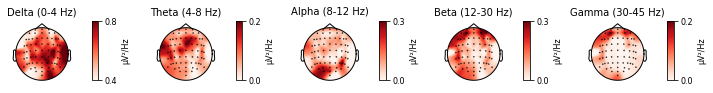

negative
    Using multitaper spectrum estimation with 7 DPSS windows


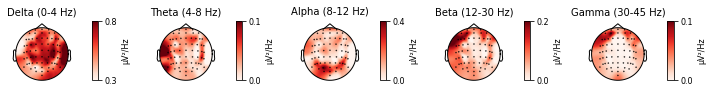

positive
    Using multitaper spectrum estimation with 7 DPSS windows


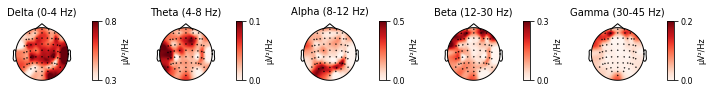

baseline
    Using multitaper spectrum estimation with 7 DPSS windows


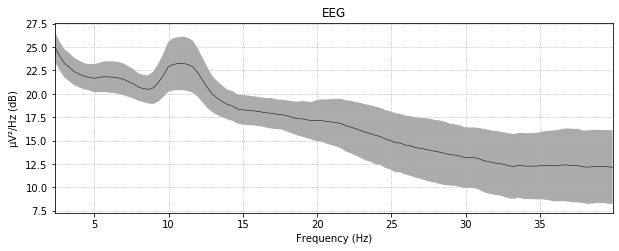

negative
    Using multitaper spectrum estimation with 7 DPSS windows


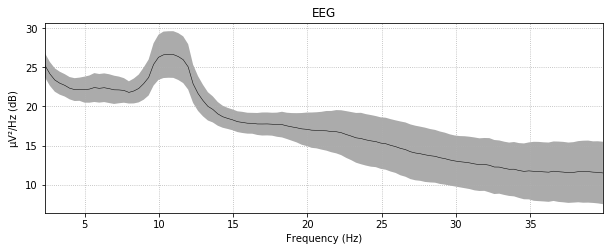

positive
    Using multitaper spectrum estimation with 7 DPSS windows


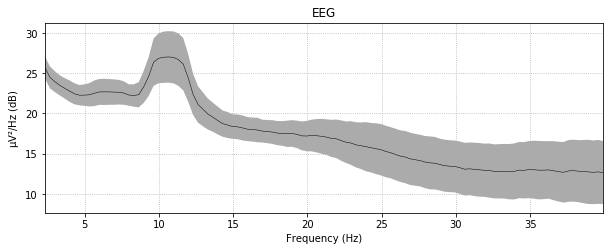

    Using multitaper spectrum estimation with 7 DPSS windows


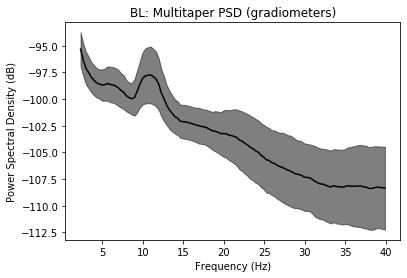

    Using multitaper spectrum estimation with 7 DPSS windows


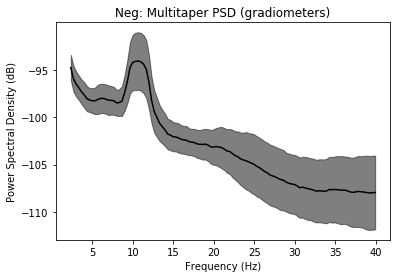

    Using multitaper spectrum estimation with 7 DPSS windows


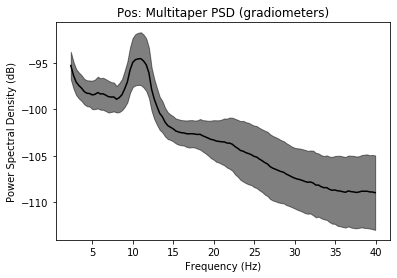

Effective window size : 2.000 (s)
Effective window size : 2.000 (s)


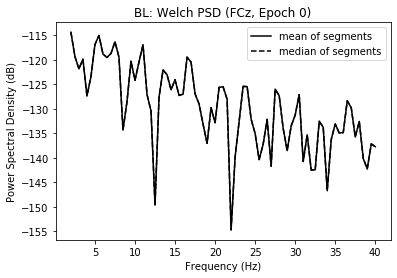

Effective window size : 2.000 (s)
Effective window size : 2.000 (s)


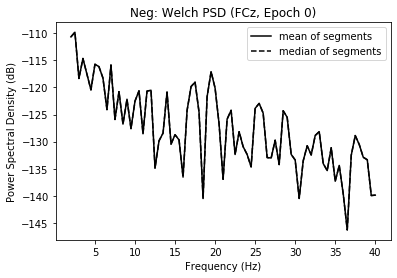

Effective window size : 2.000 (s)
Effective window size : 2.000 (s)


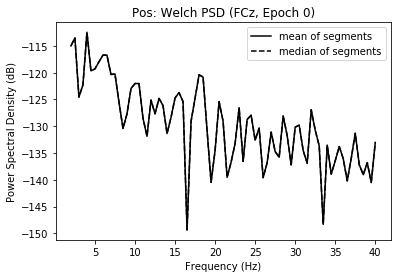

Applying baseline correction (mode: logratio)


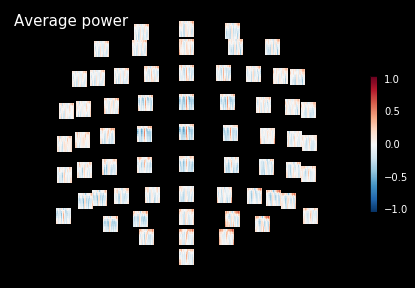

Applying baseline correction (mode: logratio)


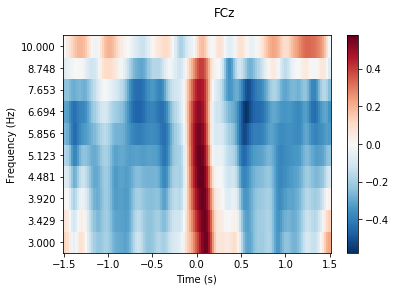

Applying baseline correction (mode: logratio)


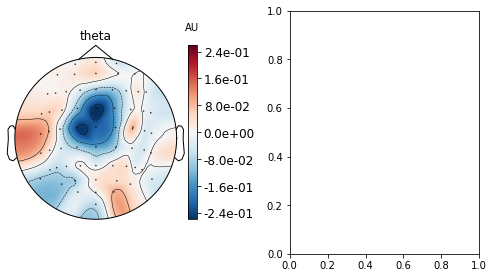

baseline
No baseline correction applied


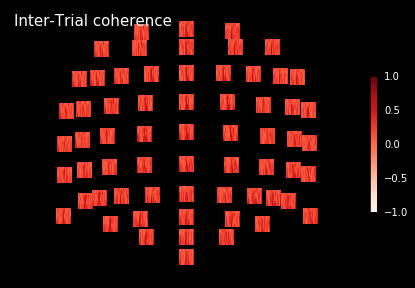

Applying baseline correction (mode: logratio)


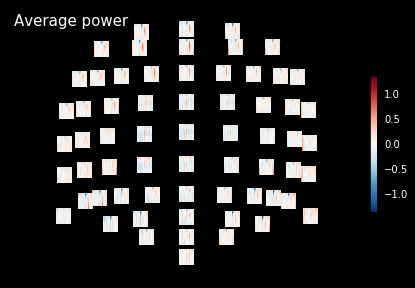

Applying baseline correction (mode: logratio)


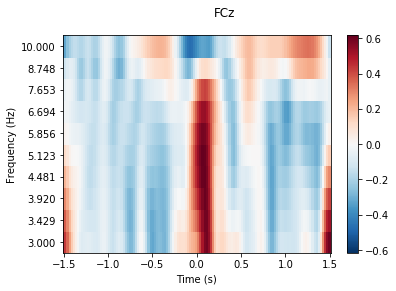

Applying baseline correction (mode: logratio)


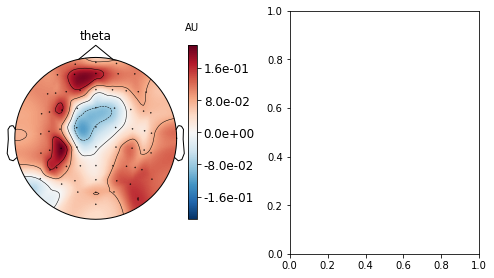

negative
No baseline correction applied


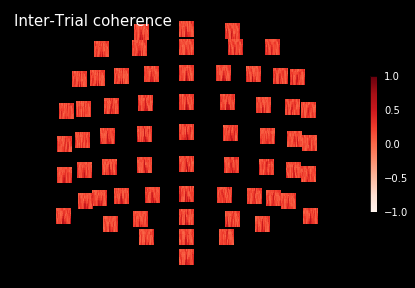

Applying baseline correction (mode: logratio)


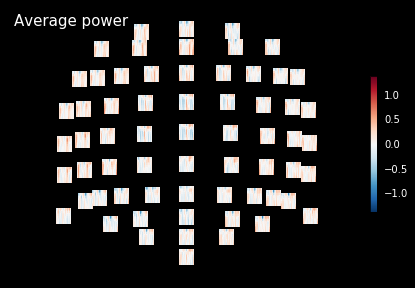

Applying baseline correction (mode: logratio)


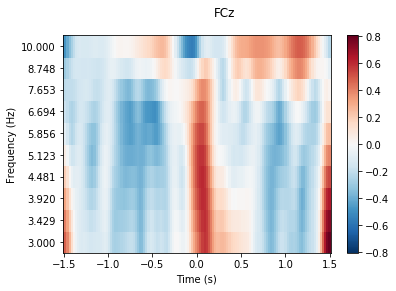

Applying baseline correction (mode: logratio)


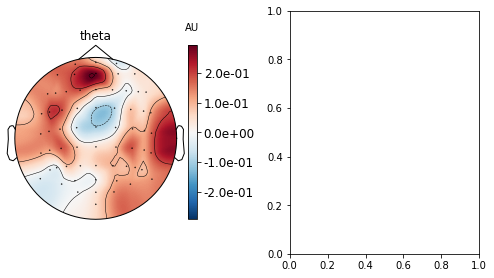

positive
No baseline correction applied


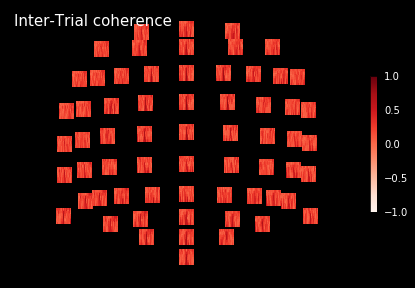

5
subj_03
baseline
    Using multitaper spectrum estimation with 7 DPSS windows


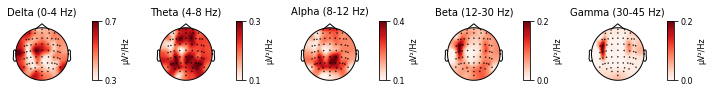

negative
    Using multitaper spectrum estimation with 7 DPSS windows


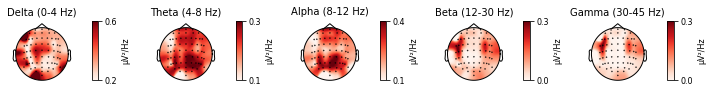

positive
    Using multitaper spectrum estimation with 7 DPSS windows


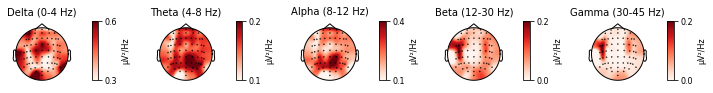

baseline
    Using multitaper spectrum estimation with 7 DPSS windows


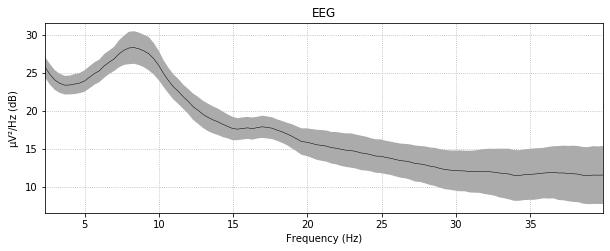

negative
    Using multitaper spectrum estimation with 7 DPSS windows


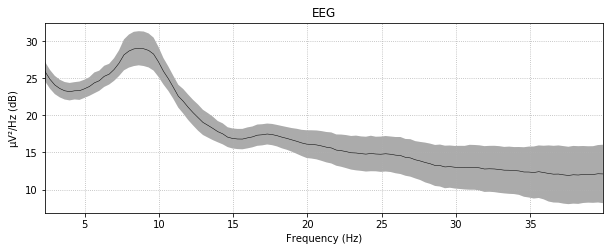

positive
    Using multitaper spectrum estimation with 7 DPSS windows


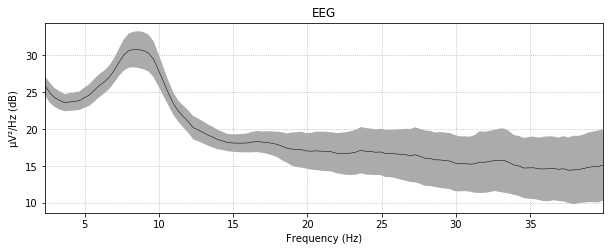

    Using multitaper spectrum estimation with 7 DPSS windows


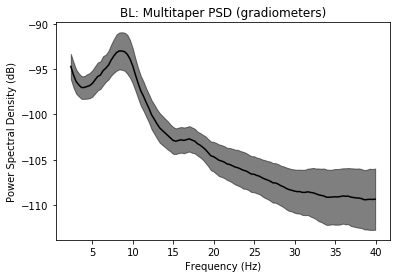

    Using multitaper spectrum estimation with 7 DPSS windows


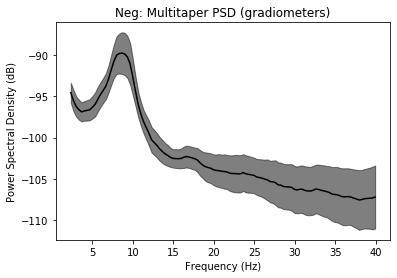

    Using multitaper spectrum estimation with 7 DPSS windows


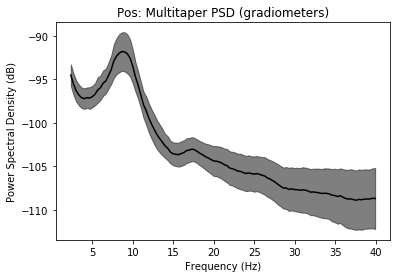

Effective window size : 2.000 (s)
Effective window size : 2.000 (s)


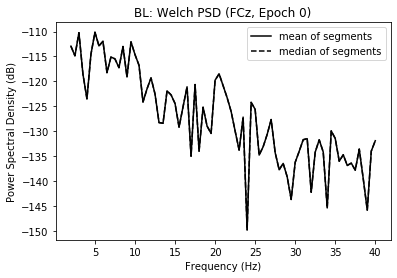

Effective window size : 2.000 (s)
Effective window size : 2.000 (s)


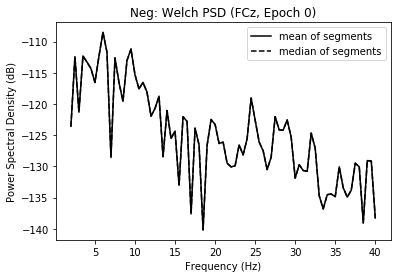

Effective window size : 2.000 (s)
Effective window size : 2.000 (s)


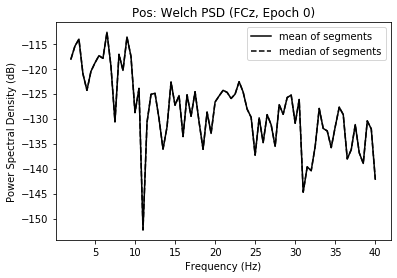

Applying baseline correction (mode: logratio)


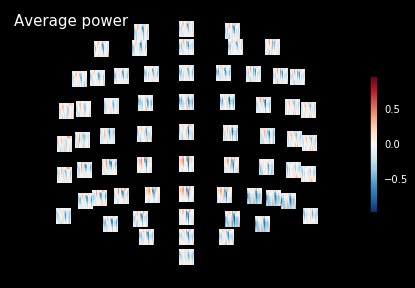

Applying baseline correction (mode: logratio)


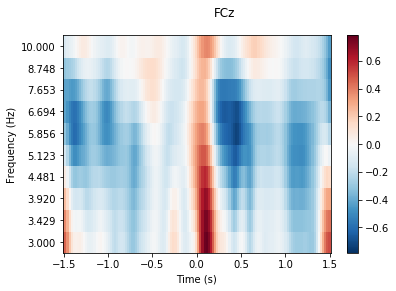

Applying baseline correction (mode: logratio)


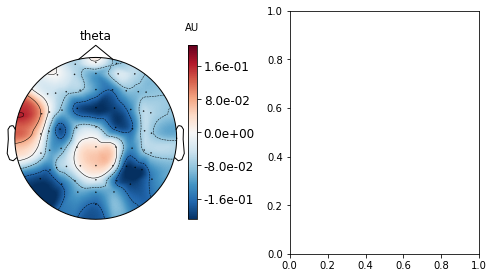

baseline
No baseline correction applied


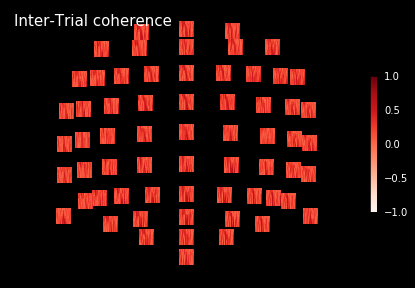

Applying baseline correction (mode: logratio)


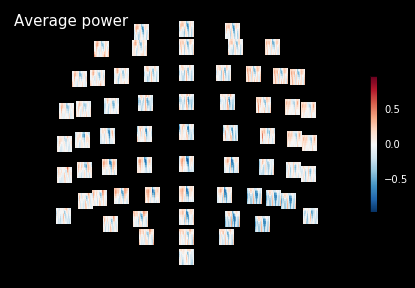

Applying baseline correction (mode: logratio)


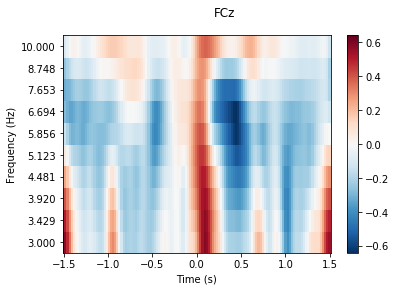

Applying baseline correction (mode: logratio)


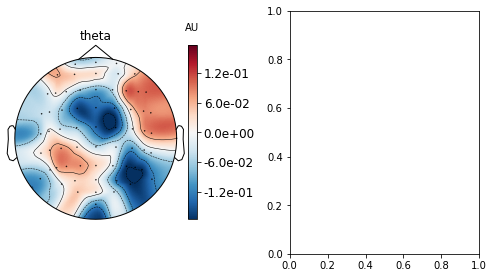

negative
No baseline correction applied


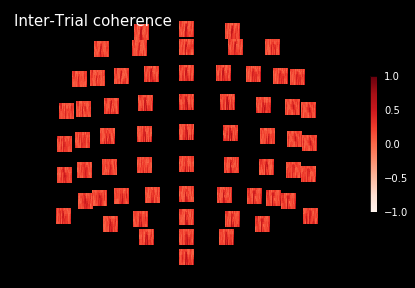

Applying baseline correction (mode: logratio)


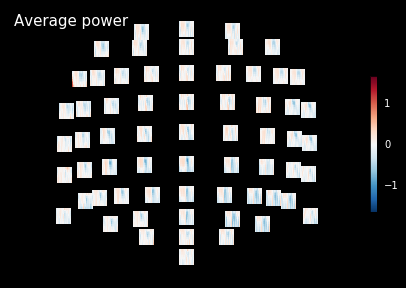

Applying baseline correction (mode: logratio)


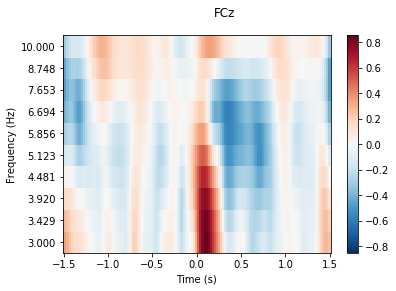

Applying baseline correction (mode: logratio)


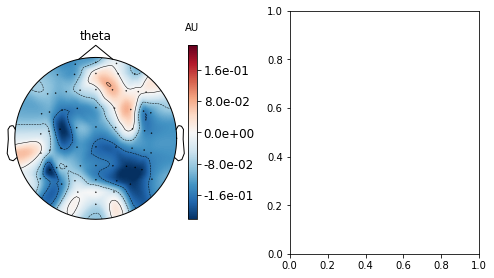

positive
No baseline correction applied


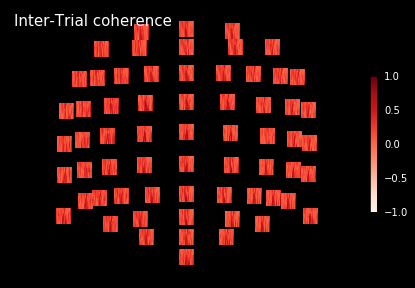

6
subj_05
baseline
    Using multitaper spectrum estimation with 7 DPSS windows


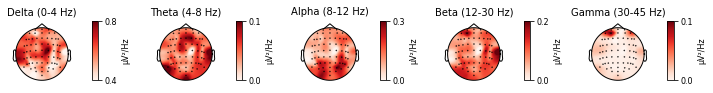

negative
    Using multitaper spectrum estimation with 7 DPSS windows


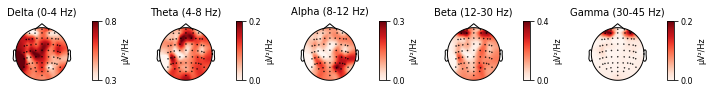

positive
    Using multitaper spectrum estimation with 7 DPSS windows


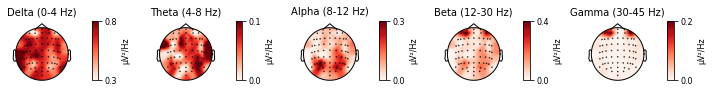

baseline
    Using multitaper spectrum estimation with 7 DPSS windows


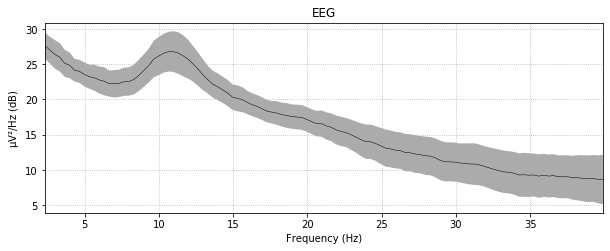

negative
    Using multitaper spectrum estimation with 7 DPSS windows


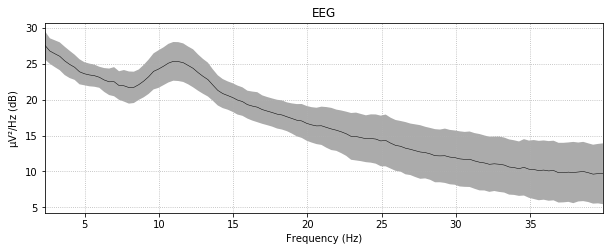

positive
    Using multitaper spectrum estimation with 7 DPSS windows


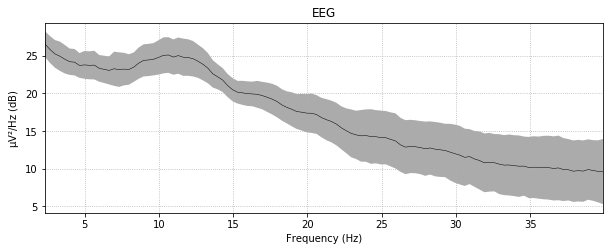

    Using multitaper spectrum estimation with 7 DPSS windows


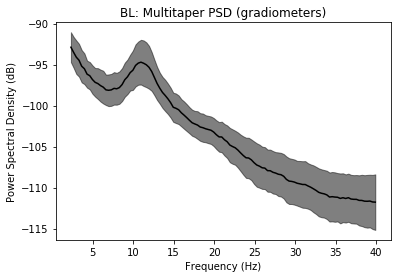

    Using multitaper spectrum estimation with 7 DPSS windows


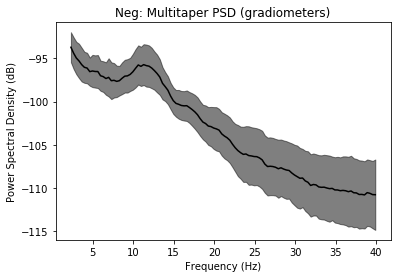

    Using multitaper spectrum estimation with 7 DPSS windows


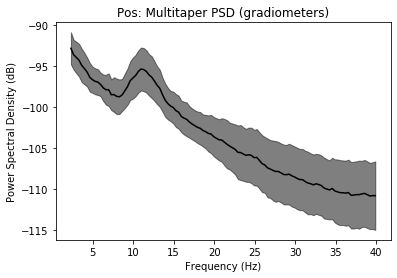

Effective window size : 2.000 (s)
Effective window size : 2.000 (s)


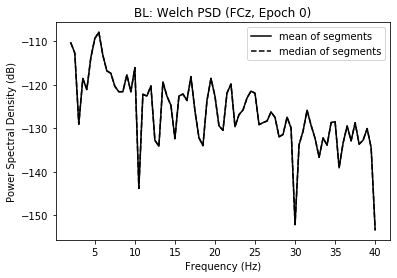

Effective window size : 2.000 (s)
Effective window size : 2.000 (s)


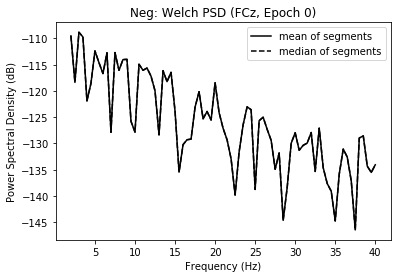

Effective window size : 2.000 (s)
Effective window size : 2.000 (s)


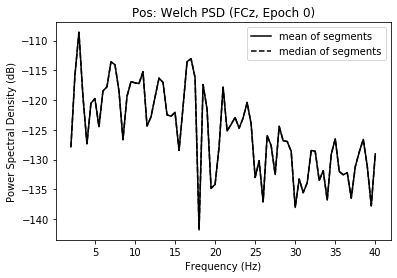

Applying baseline correction (mode: logratio)


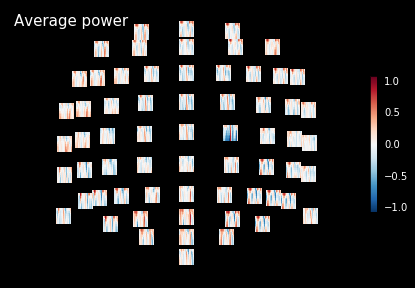

Applying baseline correction (mode: logratio)


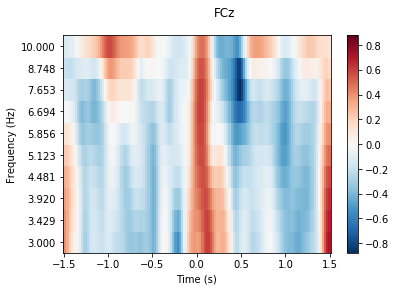

Applying baseline correction (mode: logratio)


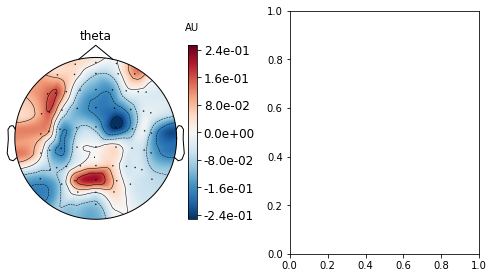

baseline
No baseline correction applied


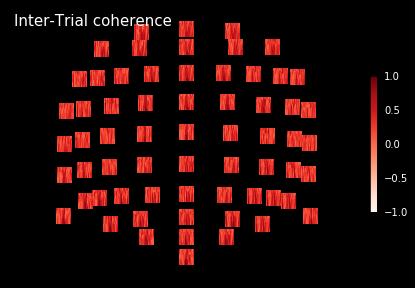

Applying baseline correction (mode: logratio)


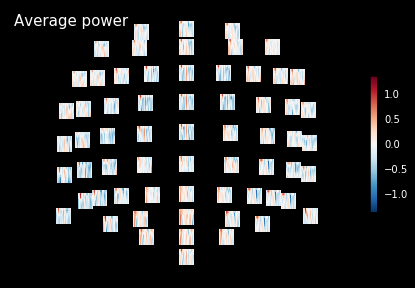

Applying baseline correction (mode: logratio)


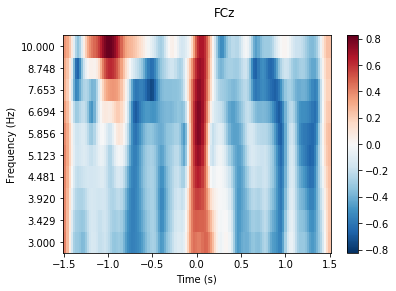

Applying baseline correction (mode: logratio)


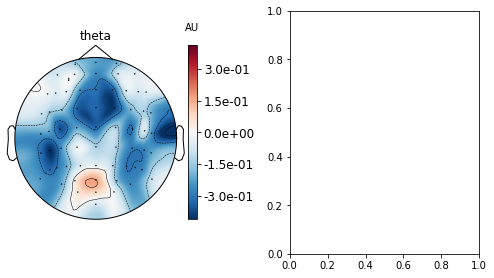

negative
No baseline correction applied


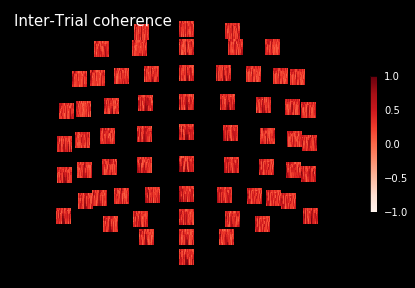

Applying baseline correction (mode: logratio)


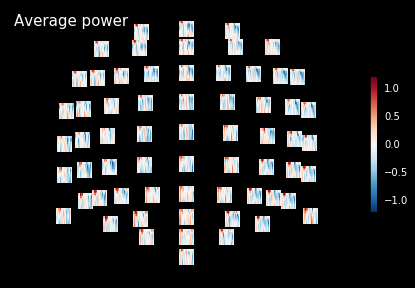

Applying baseline correction (mode: logratio)


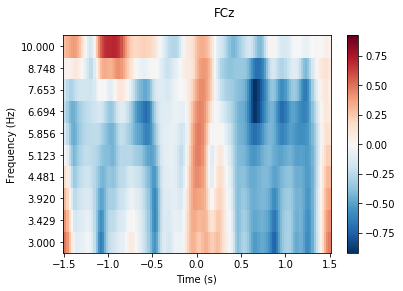

Applying baseline correction (mode: logratio)


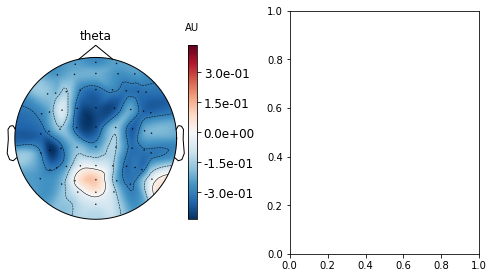

positive
No baseline correction applied


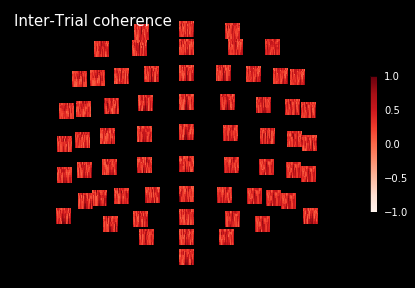

7
subj_12
baseline
    Using multitaper spectrum estimation with 7 DPSS windows


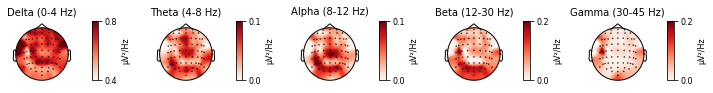

negative
    Using multitaper spectrum estimation with 7 DPSS windows


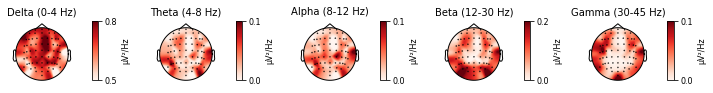

positive
    Using multitaper spectrum estimation with 7 DPSS windows


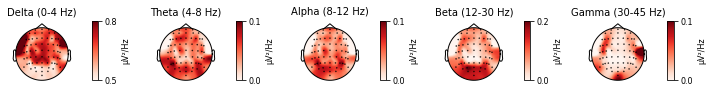

baseline
    Using multitaper spectrum estimation with 7 DPSS windows


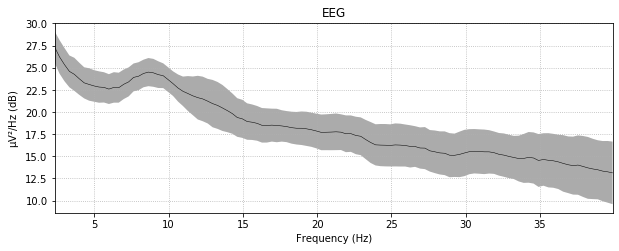

negative
    Using multitaper spectrum estimation with 7 DPSS windows


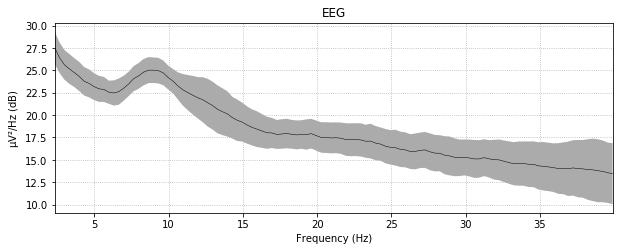

positive
    Using multitaper spectrum estimation with 7 DPSS windows


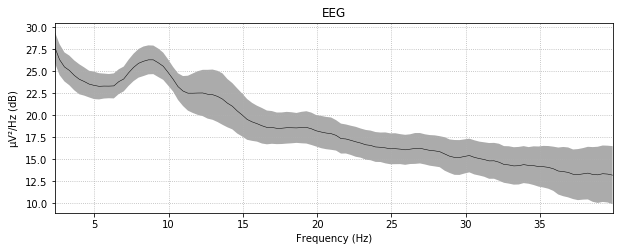

    Using multitaper spectrum estimation with 7 DPSS windows


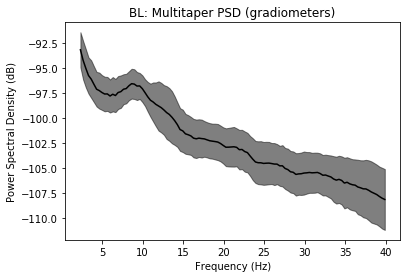

    Using multitaper spectrum estimation with 7 DPSS windows


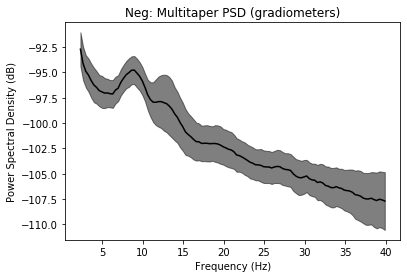

    Using multitaper spectrum estimation with 7 DPSS windows


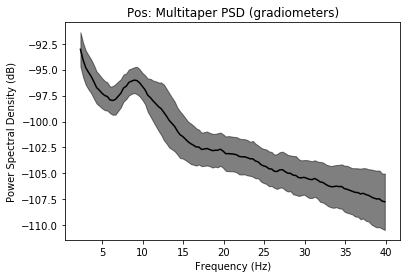

Effective window size : 2.000 (s)
Effective window size : 2.000 (s)


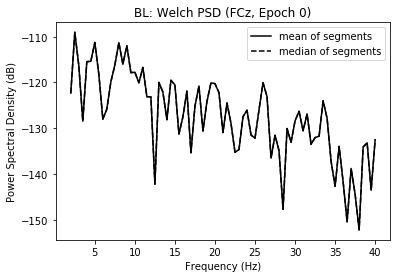

Effective window size : 2.000 (s)
Effective window size : 2.000 (s)


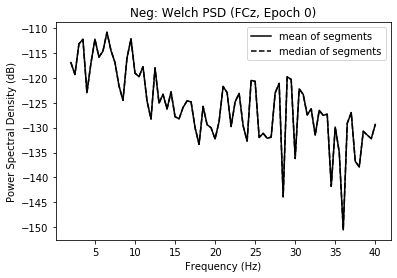

Effective window size : 2.000 (s)
Effective window size : 2.000 (s)


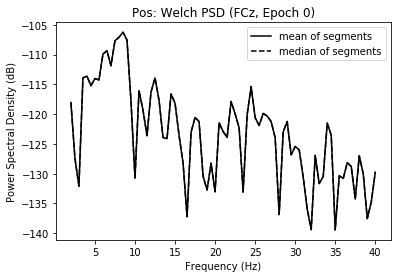

Applying baseline correction (mode: logratio)


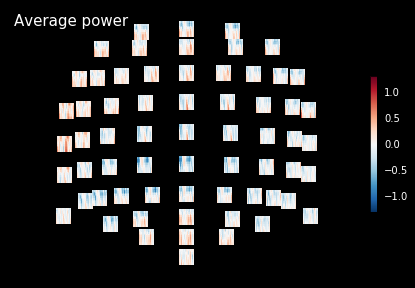

Applying baseline correction (mode: logratio)


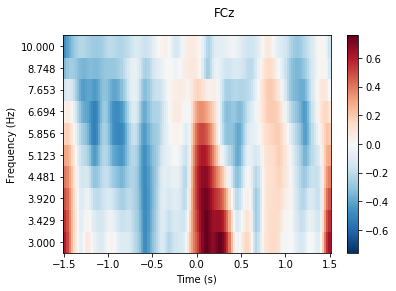

Applying baseline correction (mode: logratio)


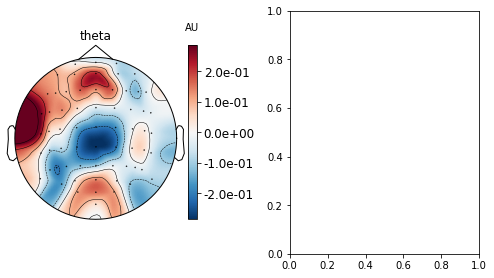

baseline
No baseline correction applied


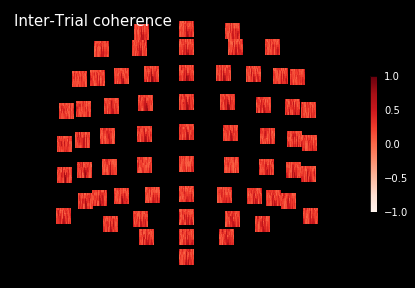

Applying baseline correction (mode: logratio)


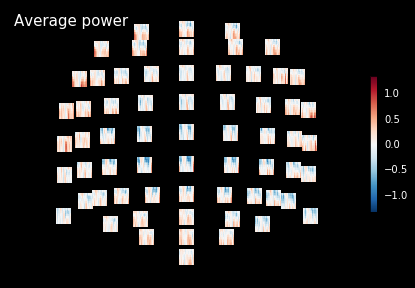

Applying baseline correction (mode: logratio)


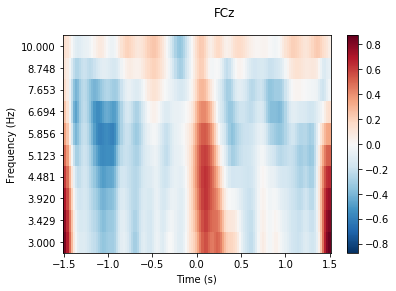

Applying baseline correction (mode: logratio)


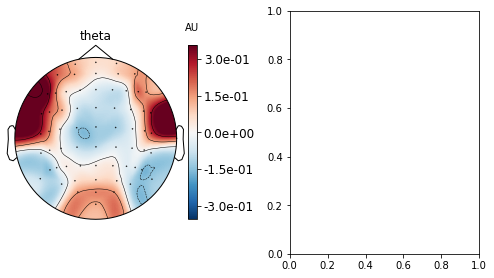

negative
No baseline correction applied


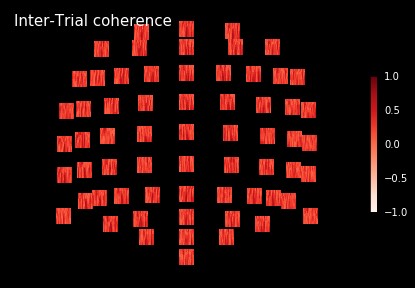

Applying baseline correction (mode: logratio)


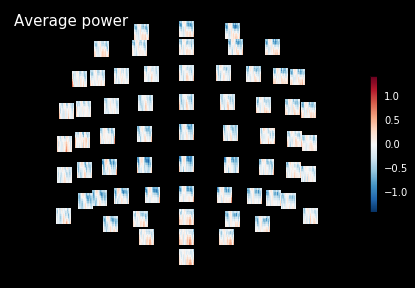

Applying baseline correction (mode: logratio)


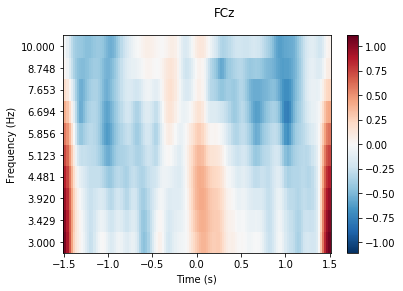

Applying baseline correction (mode: logratio)


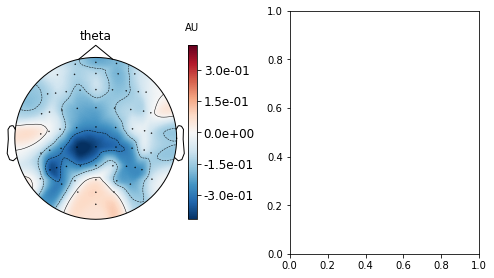

positive
No baseline correction applied


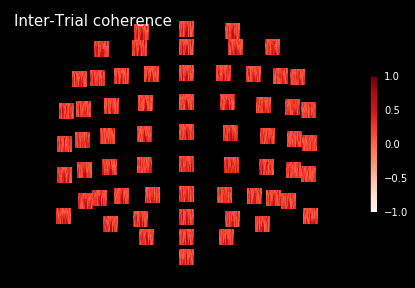

8
subj_20
baseline
    Using multitaper spectrum estimation with 7 DPSS windows


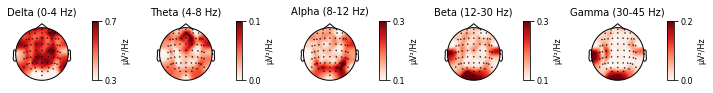

negative
    Using multitaper spectrum estimation with 7 DPSS windows


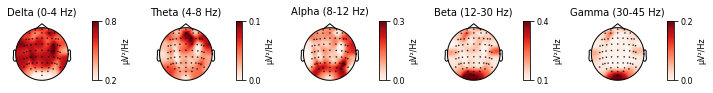

positive
    Using multitaper spectrum estimation with 7 DPSS windows


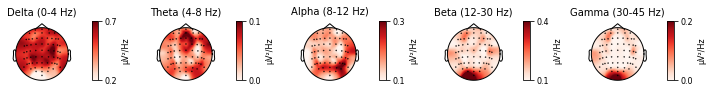

baseline
    Using multitaper spectrum estimation with 7 DPSS windows


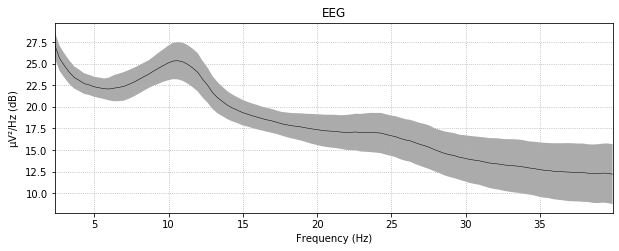

negative
    Using multitaper spectrum estimation with 7 DPSS windows


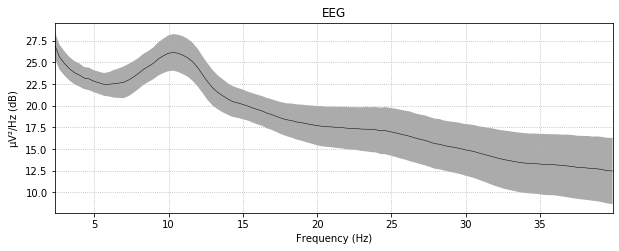

positive
    Using multitaper spectrum estimation with 7 DPSS windows


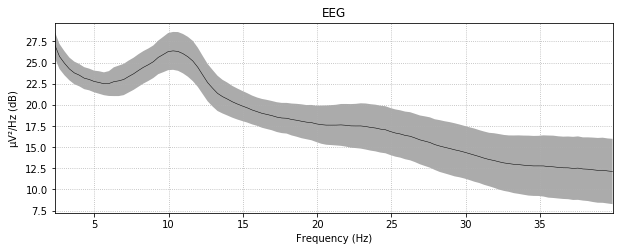

    Using multitaper spectrum estimation with 7 DPSS windows


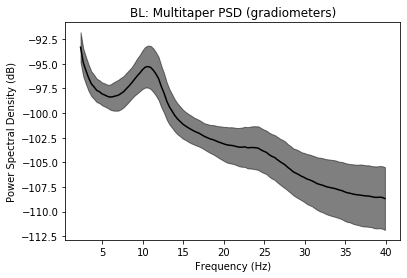

    Using multitaper spectrum estimation with 7 DPSS windows


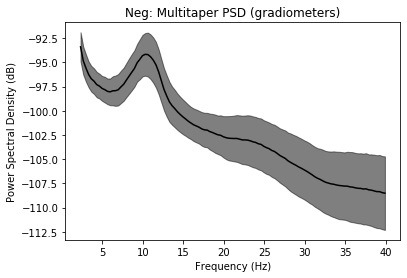

    Using multitaper spectrum estimation with 7 DPSS windows


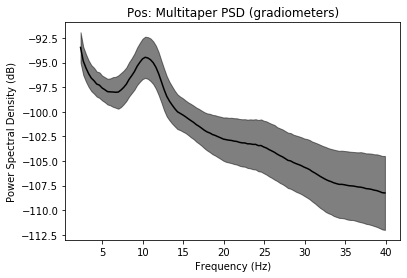

Effective window size : 2.000 (s)
Effective window size : 2.000 (s)


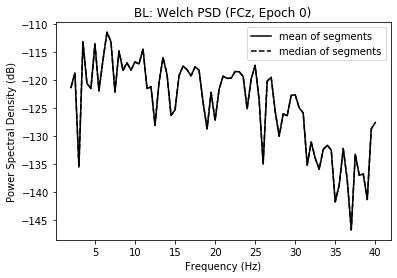

Effective window size : 2.000 (s)
Effective window size : 2.000 (s)


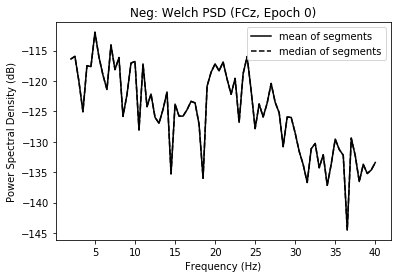

Effective window size : 2.000 (s)
Effective window size : 2.000 (s)


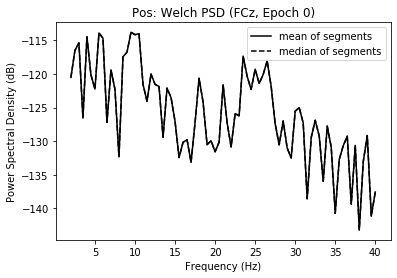

Applying baseline correction (mode: logratio)


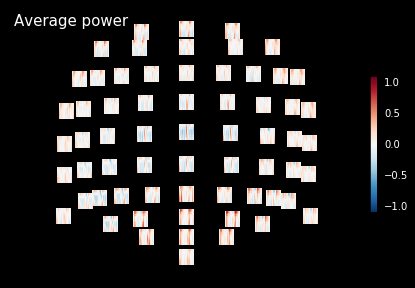

Applying baseline correction (mode: logratio)


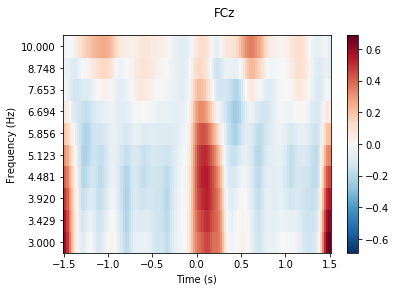

Applying baseline correction (mode: logratio)


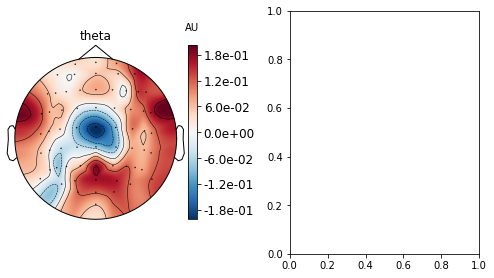

baseline
No baseline correction applied


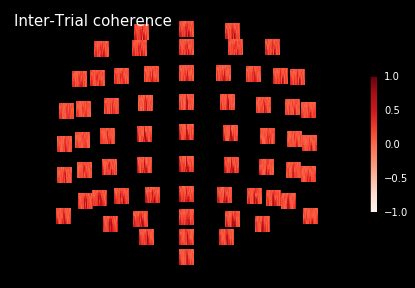

Applying baseline correction (mode: logratio)


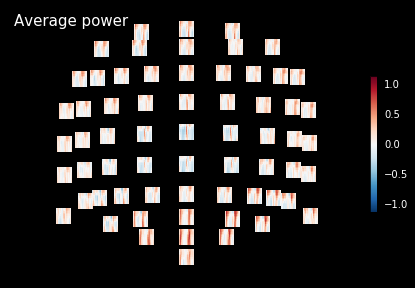

Applying baseline correction (mode: logratio)


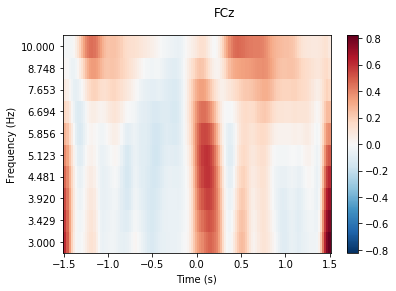

Applying baseline correction (mode: logratio)


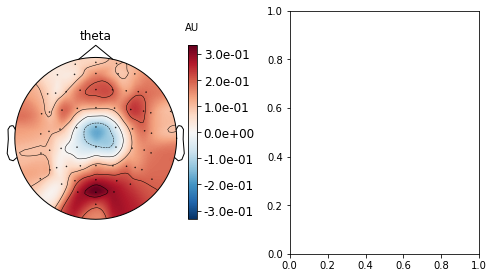

negative
No baseline correction applied


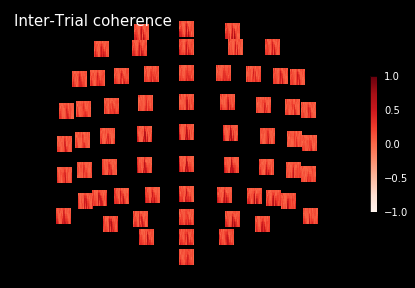

Applying baseline correction (mode: logratio)


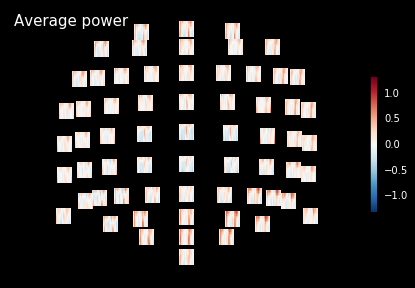

Applying baseline correction (mode: logratio)


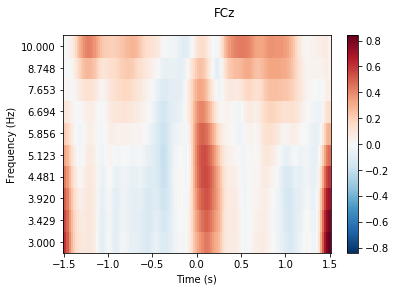

Applying baseline correction (mode: logratio)


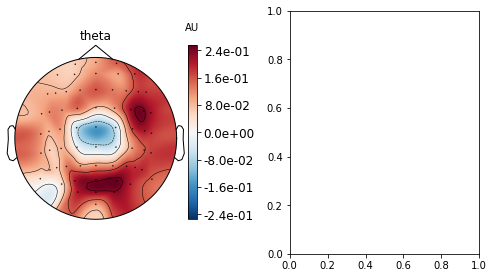

positive
No baseline correction applied


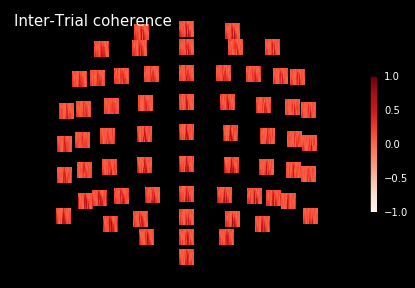

9
subj_32
baseline
    Using multitaper spectrum estimation with 7 DPSS windows


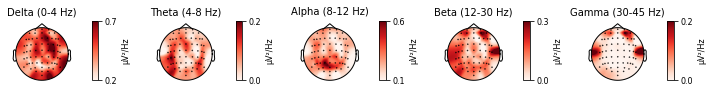

negative
    Using multitaper spectrum estimation with 7 DPSS windows


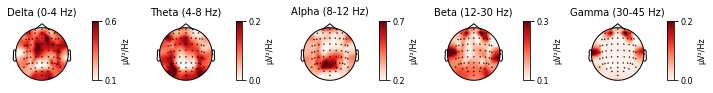

positive
    Using multitaper spectrum estimation with 7 DPSS windows


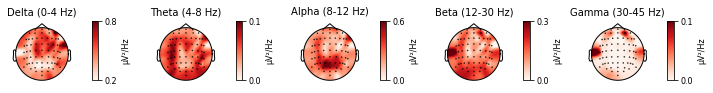

baseline
    Using multitaper spectrum estimation with 7 DPSS windows


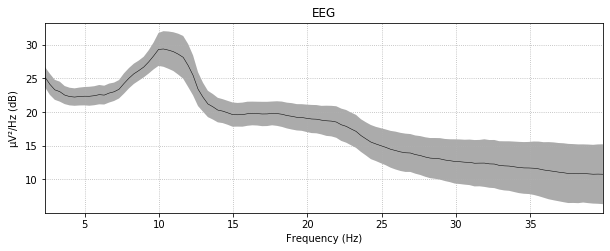

negative
    Using multitaper spectrum estimation with 7 DPSS windows


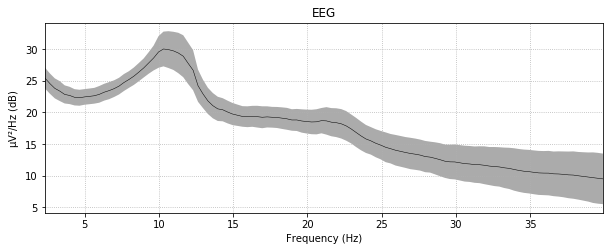

positive
    Using multitaper spectrum estimation with 7 DPSS windows


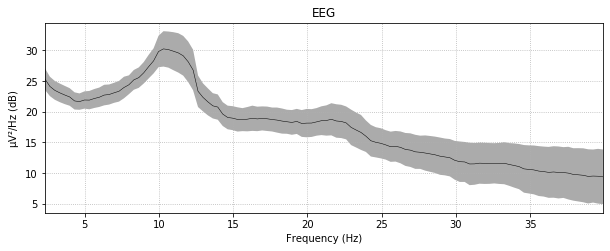

    Using multitaper spectrum estimation with 7 DPSS windows


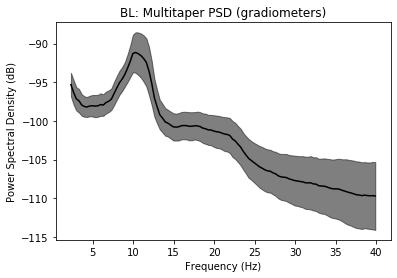

    Using multitaper spectrum estimation with 7 DPSS windows


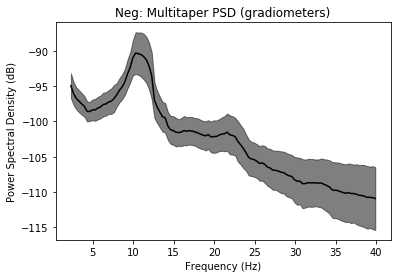

    Using multitaper spectrum estimation with 7 DPSS windows


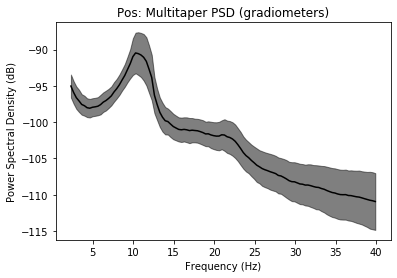

Effective window size : 2.000 (s)
Effective window size : 2.000 (s)


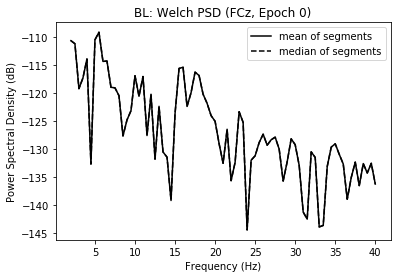

Effective window size : 2.000 (s)
Effective window size : 2.000 (s)


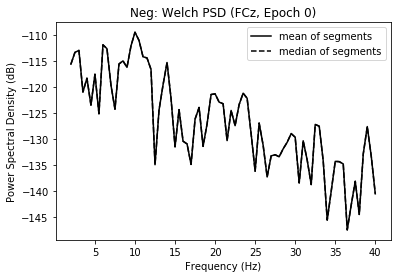

Effective window size : 2.000 (s)
Effective window size : 2.000 (s)


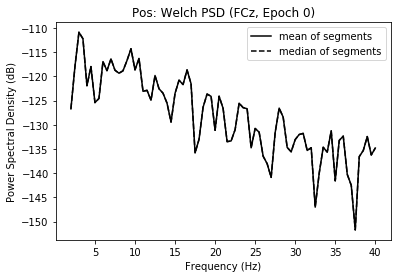

Applying baseline correction (mode: logratio)


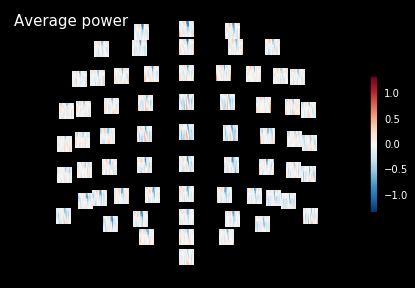

Applying baseline correction (mode: logratio)


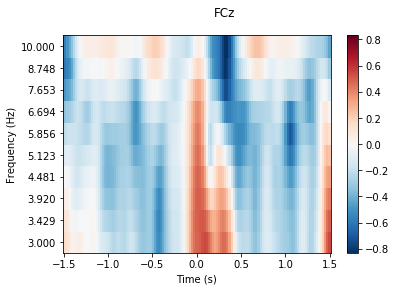

Applying baseline correction (mode: logratio)


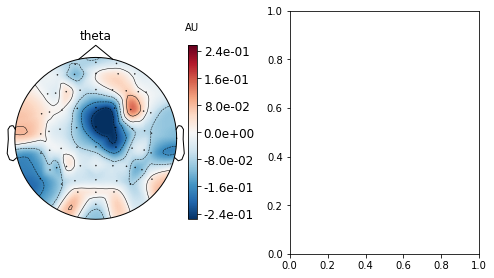

baseline
No baseline correction applied


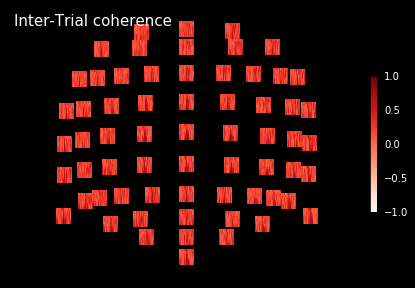

Applying baseline correction (mode: logratio)


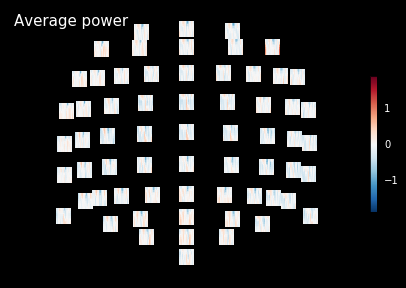

Applying baseline correction (mode: logratio)


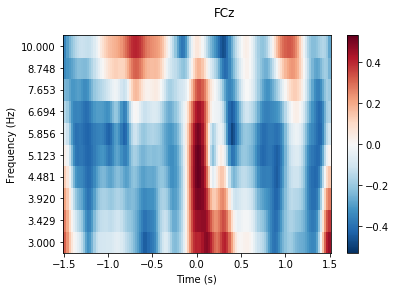

Applying baseline correction (mode: logratio)


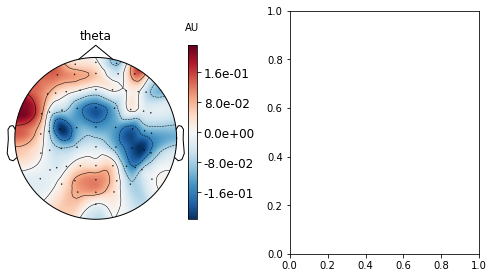

negative
No baseline correction applied


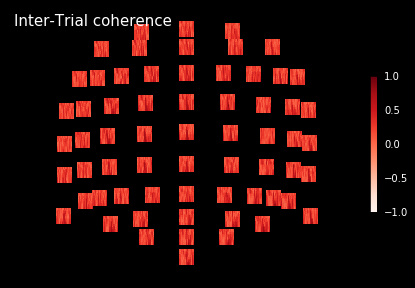

Applying baseline correction (mode: logratio)


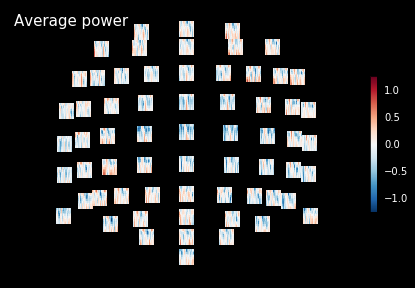

Applying baseline correction (mode: logratio)


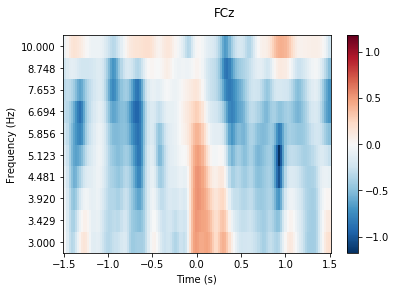

Applying baseline correction (mode: logratio)


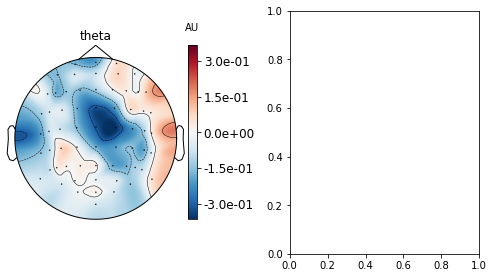

positive
No baseline correction applied


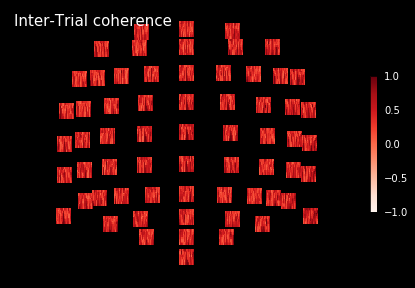

10
subj_24
baseline
    Using multitaper spectrum estimation with 7 DPSS windows


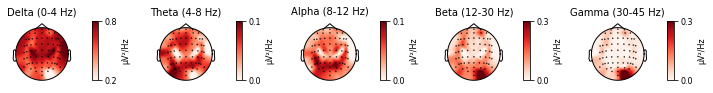

negative
    Using multitaper spectrum estimation with 7 DPSS windows


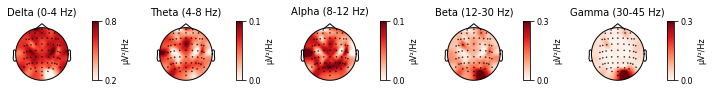

positive
    Using multitaper spectrum estimation with 7 DPSS windows


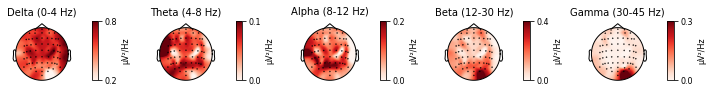

baseline
    Using multitaper spectrum estimation with 7 DPSS windows


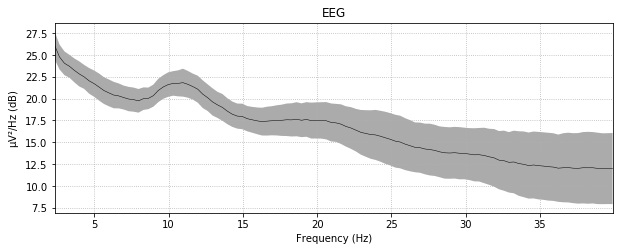

negative
    Using multitaper spectrum estimation with 7 DPSS windows


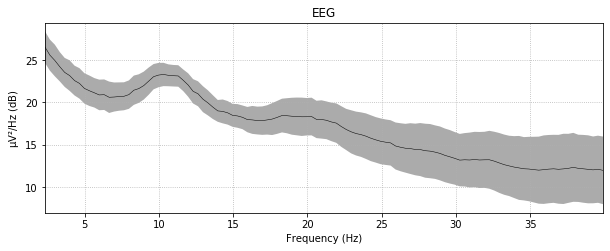

positive
    Using multitaper spectrum estimation with 7 DPSS windows


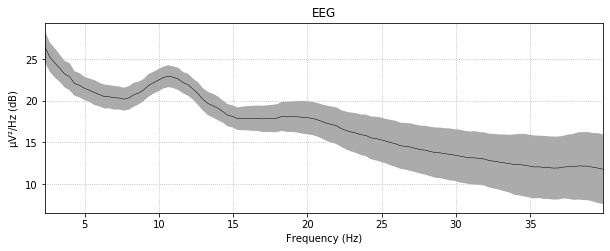

    Using multitaper spectrum estimation with 7 DPSS windows


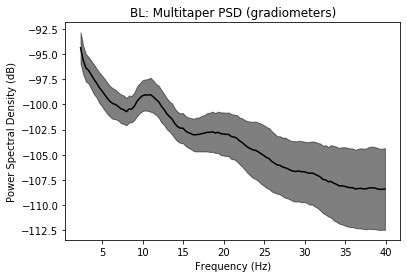

    Using multitaper spectrum estimation with 7 DPSS windows


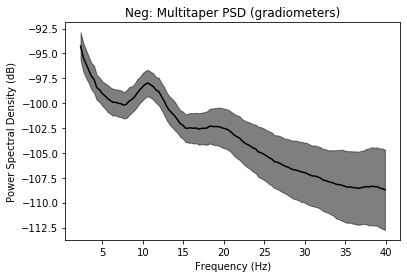

    Using multitaper spectrum estimation with 7 DPSS windows


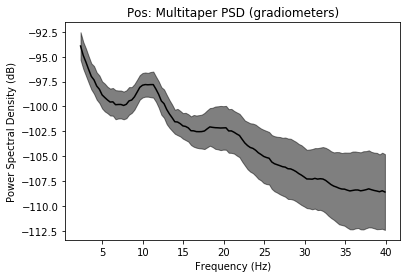

Effective window size : 2.000 (s)
Effective window size : 2.000 (s)


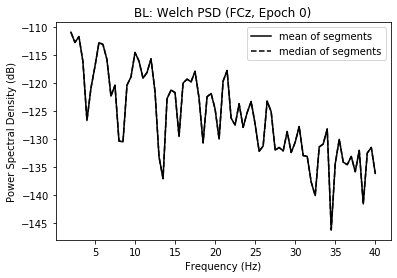

Effective window size : 2.000 (s)
Effective window size : 2.000 (s)


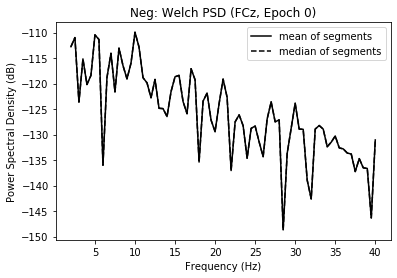

Effective window size : 2.000 (s)
Effective window size : 2.000 (s)


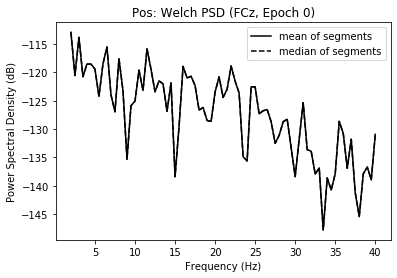

Applying baseline correction (mode: logratio)


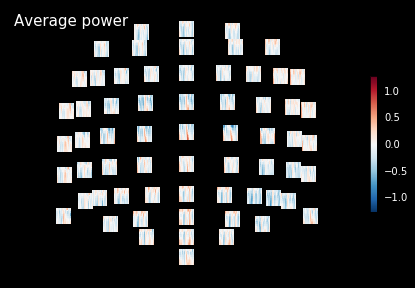

Applying baseline correction (mode: logratio)


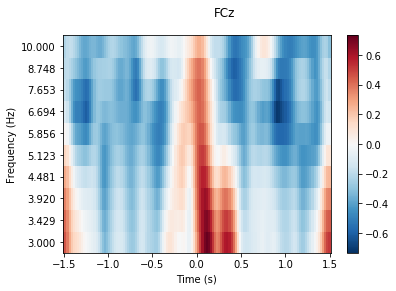

Applying baseline correction (mode: logratio)


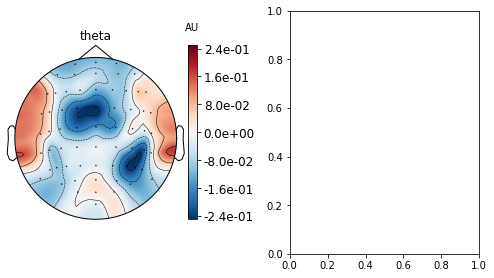

baseline
No baseline correction applied


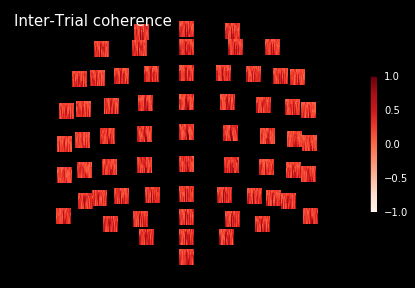

Applying baseline correction (mode: logratio)


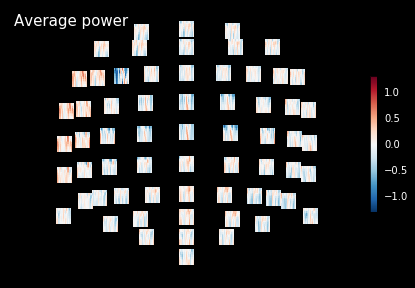

Applying baseline correction (mode: logratio)


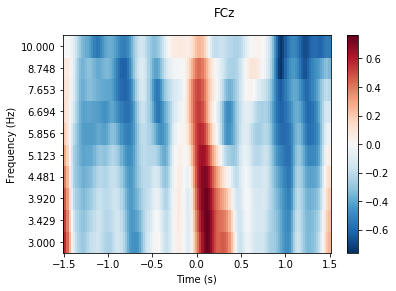

Applying baseline correction (mode: logratio)


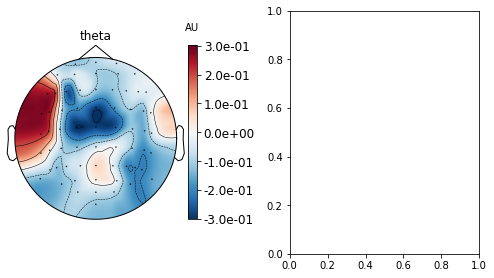

negative
No baseline correction applied


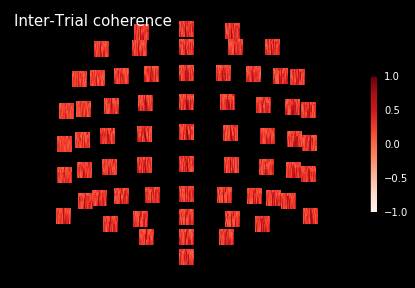

Applying baseline correction (mode: logratio)


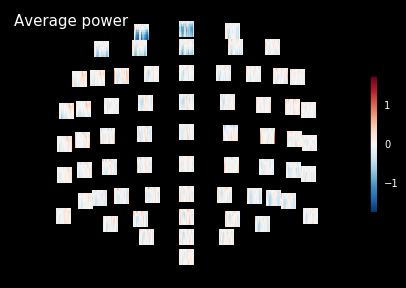

Applying baseline correction (mode: logratio)


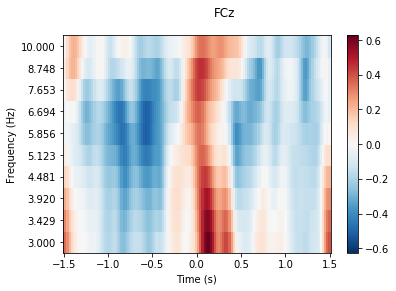

Applying baseline correction (mode: logratio)


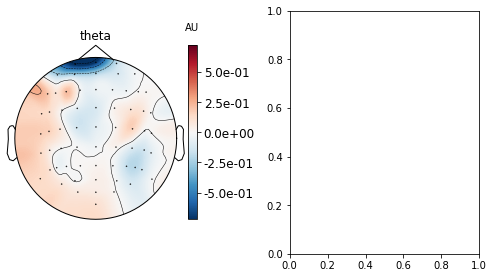

positive
No baseline correction applied


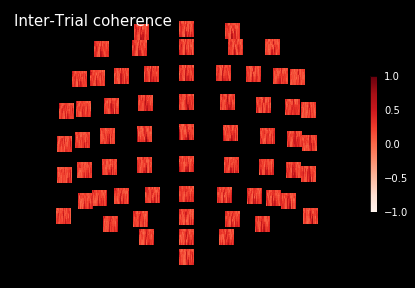

11
subj_35
baseline
    Using multitaper spectrum estimation with 7 DPSS windows


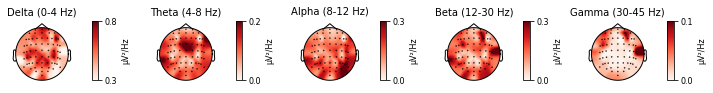

negative
    Using multitaper spectrum estimation with 7 DPSS windows


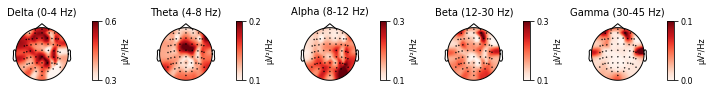

positive
    Using multitaper spectrum estimation with 7 DPSS windows


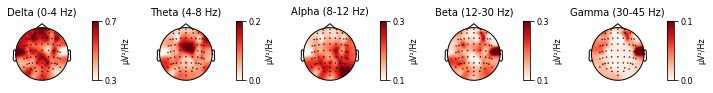

baseline
    Using multitaper spectrum estimation with 7 DPSS windows


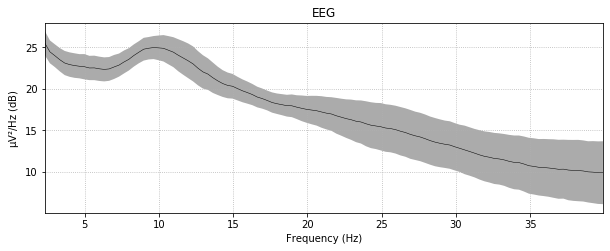

negative
    Using multitaper spectrum estimation with 7 DPSS windows


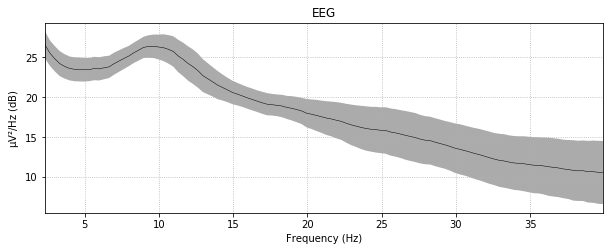

positive
    Using multitaper spectrum estimation with 7 DPSS windows


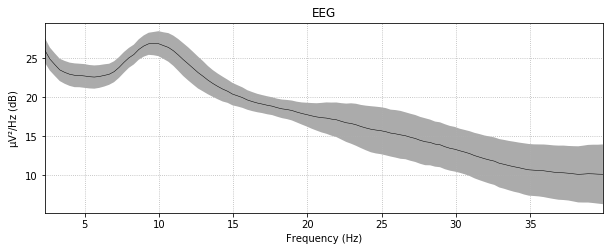

    Using multitaper spectrum estimation with 7 DPSS windows


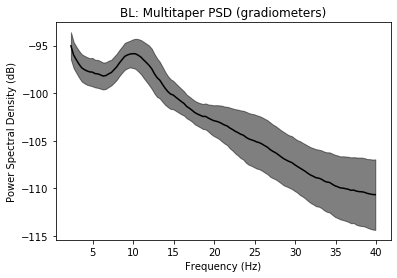

    Using multitaper spectrum estimation with 7 DPSS windows


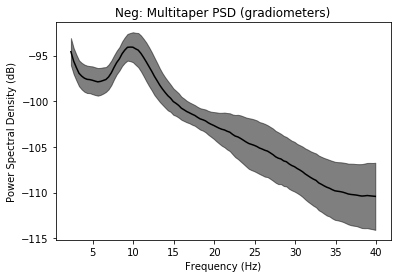

    Using multitaper spectrum estimation with 7 DPSS windows


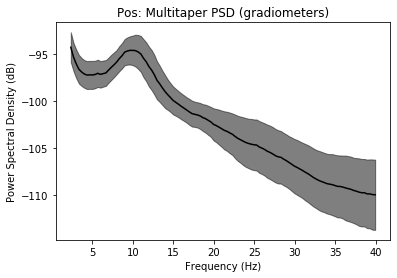

Effective window size : 2.000 (s)
Effective window size : 2.000 (s)


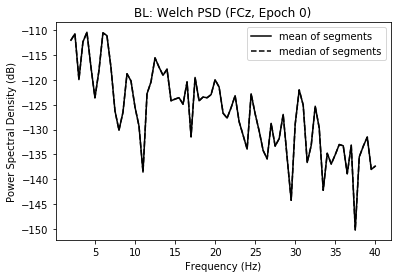

Effective window size : 2.000 (s)
Effective window size : 2.000 (s)


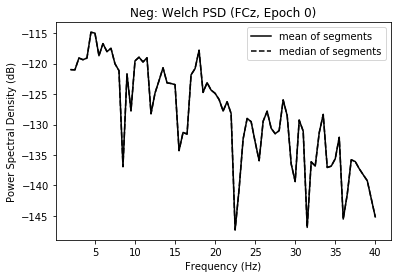

Effective window size : 2.000 (s)
Effective window size : 2.000 (s)


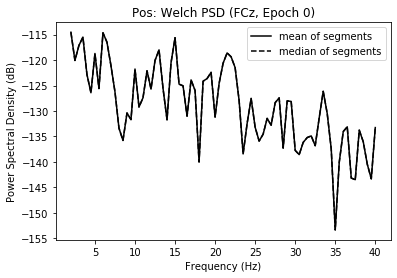

Applying baseline correction (mode: logratio)


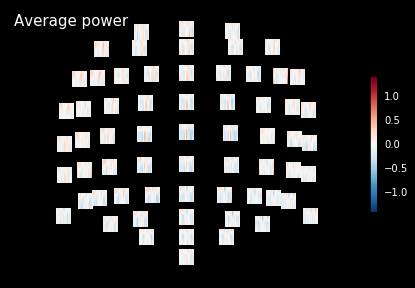

Applying baseline correction (mode: logratio)


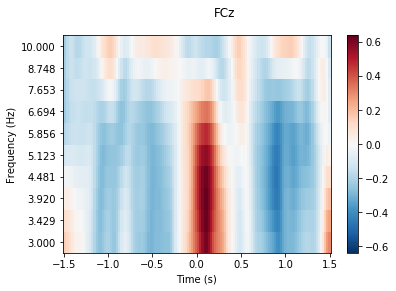

Applying baseline correction (mode: logratio)


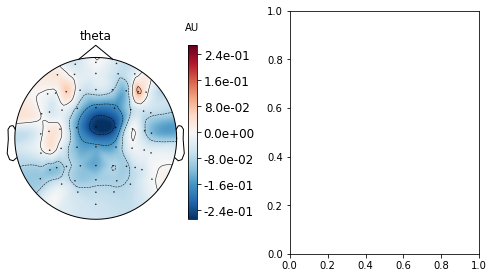

baseline
No baseline correction applied


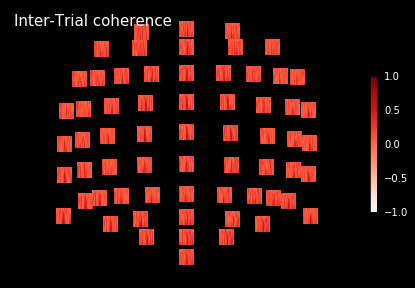

Applying baseline correction (mode: logratio)


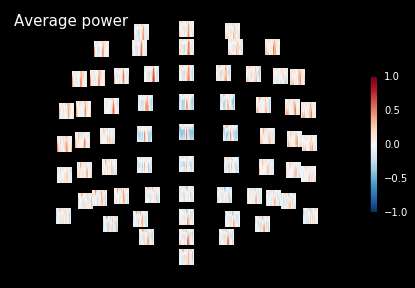

Applying baseline correction (mode: logratio)


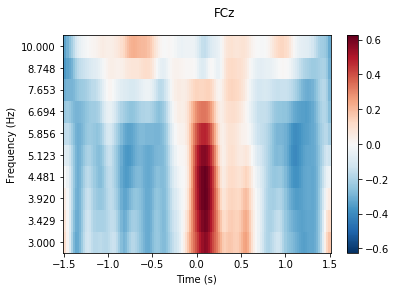

Applying baseline correction (mode: logratio)


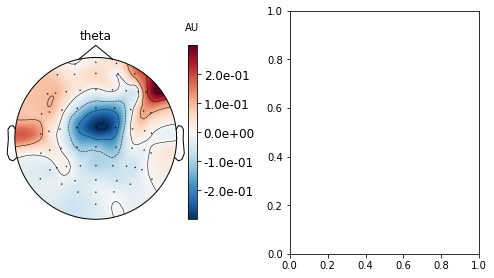

negative
No baseline correction applied


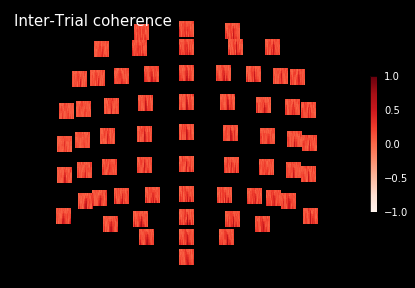

Applying baseline correction (mode: logratio)


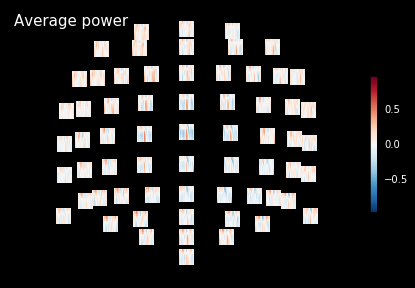

Applying baseline correction (mode: logratio)


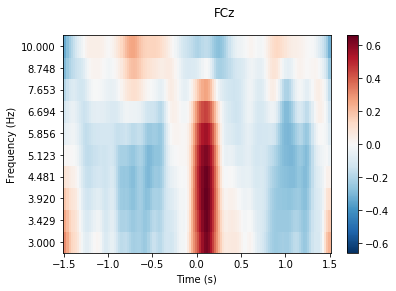

Applying baseline correction (mode: logratio)


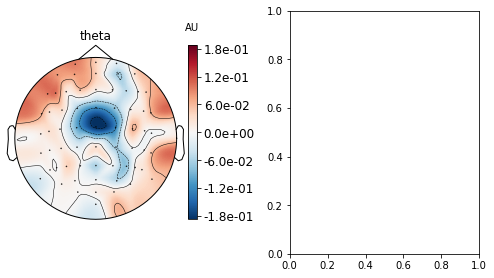

positive
No baseline correction applied


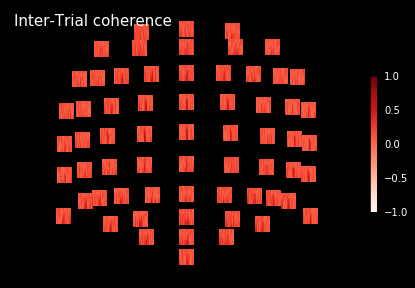

12
subj_14
baseline
    Using multitaper spectrum estimation with 7 DPSS windows


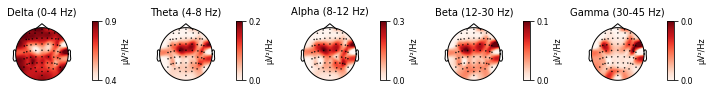

negative
    Using multitaper spectrum estimation with 7 DPSS windows


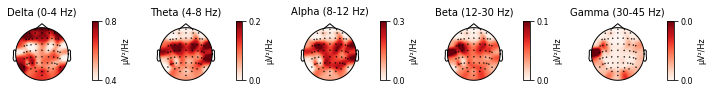

positive
    Using multitaper spectrum estimation with 7 DPSS windows


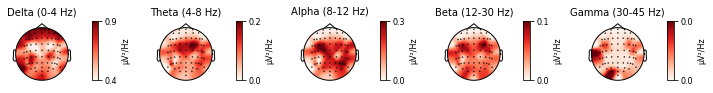

baseline
    Using multitaper spectrum estimation with 7 DPSS windows


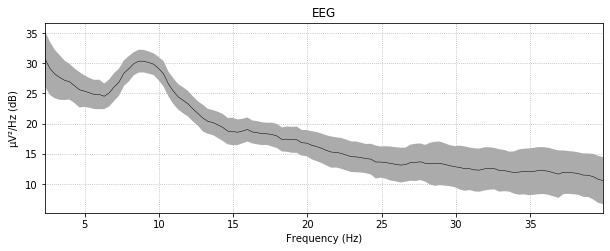

negative
    Using multitaper spectrum estimation with 7 DPSS windows


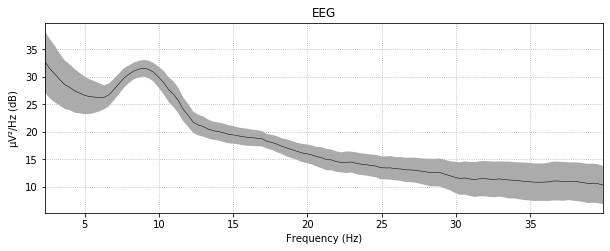

positive
    Using multitaper spectrum estimation with 7 DPSS windows


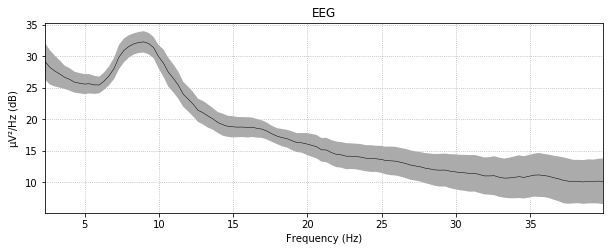

    Using multitaper spectrum estimation with 7 DPSS windows


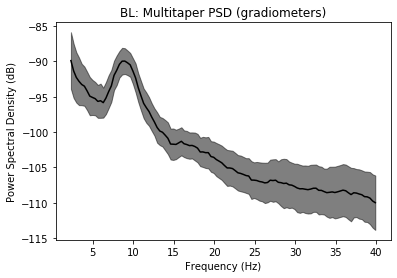

    Using multitaper spectrum estimation with 7 DPSS windows


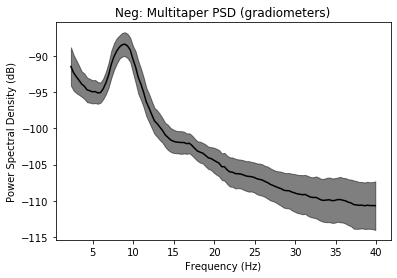

    Using multitaper spectrum estimation with 7 DPSS windows


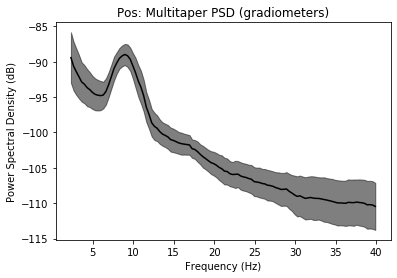

Effective window size : 2.000 (s)
Effective window size : 2.000 (s)


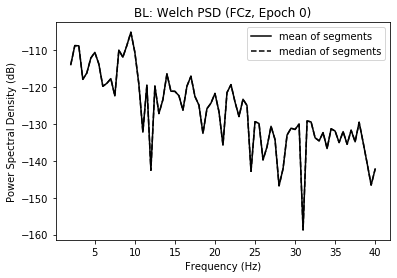

Effective window size : 2.000 (s)
Effective window size : 2.000 (s)


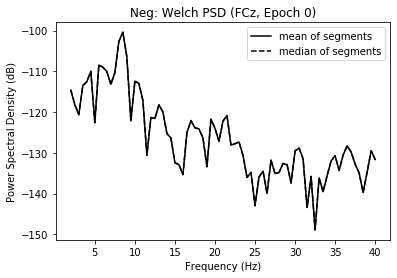

Effective window size : 2.000 (s)
Effective window size : 2.000 (s)


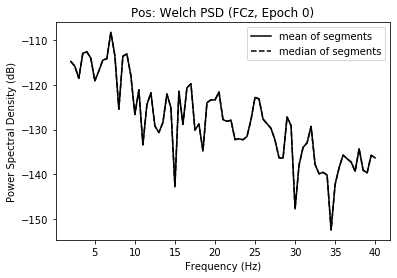

Applying baseline correction (mode: logratio)


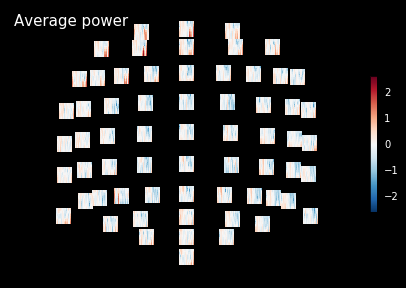

Applying baseline correction (mode: logratio)


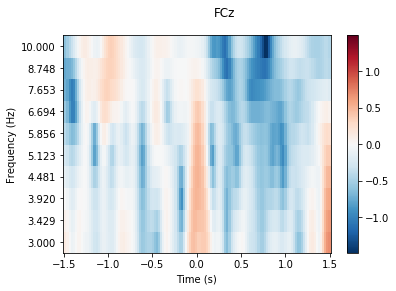

Applying baseline correction (mode: logratio)


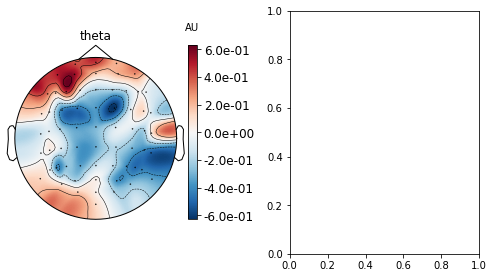

baseline
No baseline correction applied


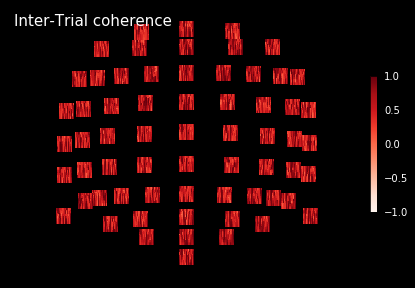

Applying baseline correction (mode: logratio)


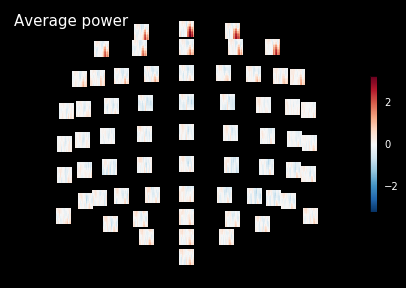

Applying baseline correction (mode: logratio)


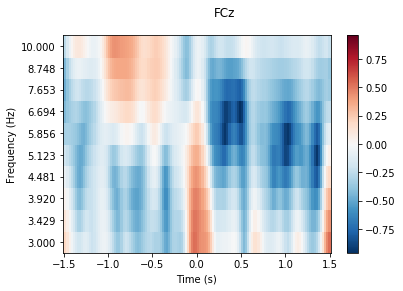

Applying baseline correction (mode: logratio)


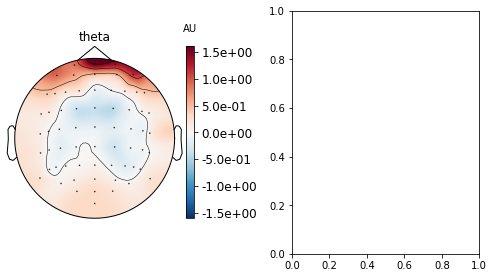

negative
No baseline correction applied


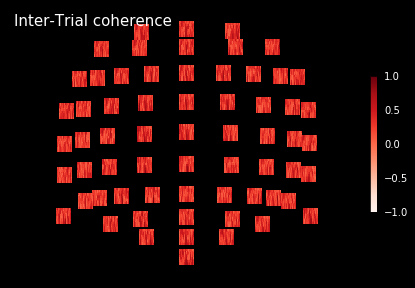

Applying baseline correction (mode: logratio)


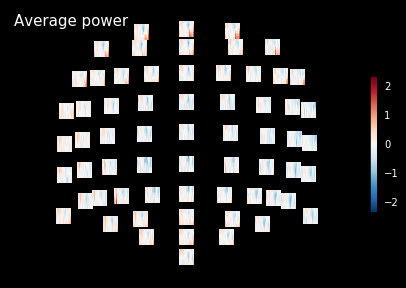

Applying baseline correction (mode: logratio)


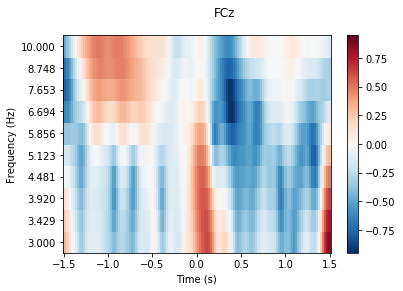

Applying baseline correction (mode: logratio)


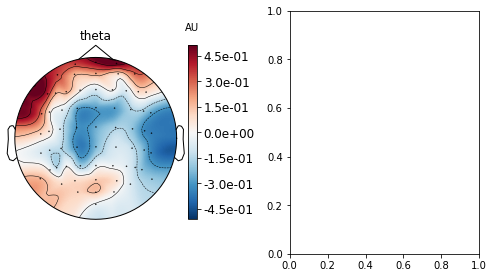

positive
No baseline correction applied


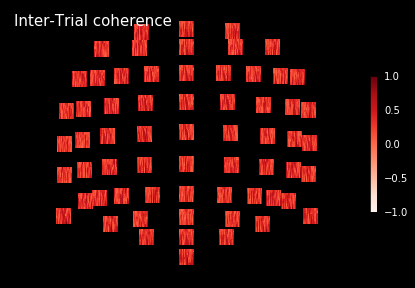

13
subj_16
baseline
    Using multitaper spectrum estimation with 7 DPSS windows


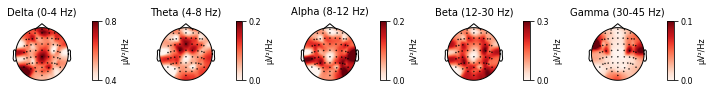

negative
    Using multitaper spectrum estimation with 7 DPSS windows


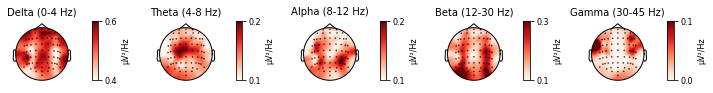

positive
    Using multitaper spectrum estimation with 7 DPSS windows


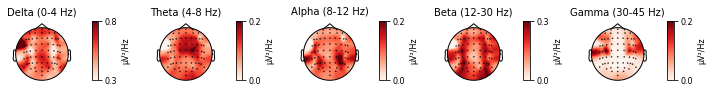

baseline
    Using multitaper spectrum estimation with 7 DPSS windows


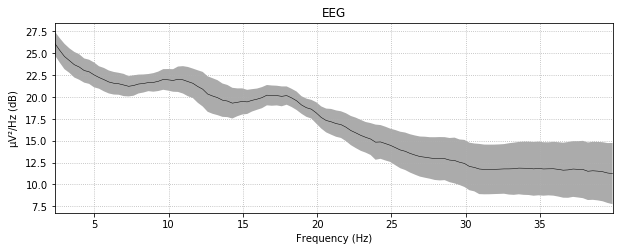

negative
    Using multitaper spectrum estimation with 7 DPSS windows


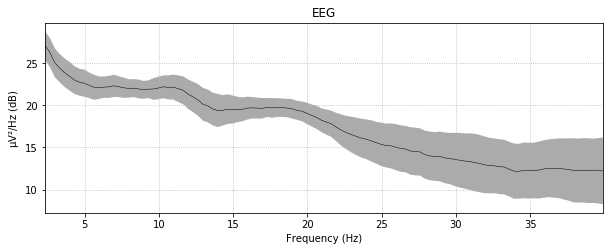

positive
    Using multitaper spectrum estimation with 7 DPSS windows


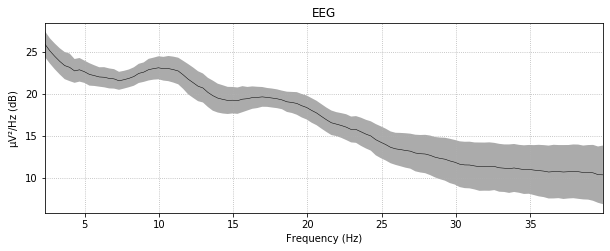

    Using multitaper spectrum estimation with 7 DPSS windows


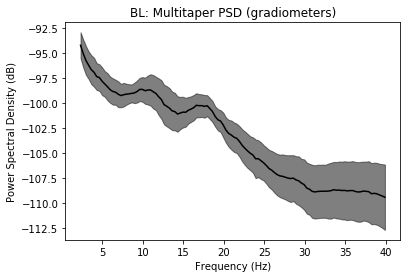

    Using multitaper spectrum estimation with 7 DPSS windows


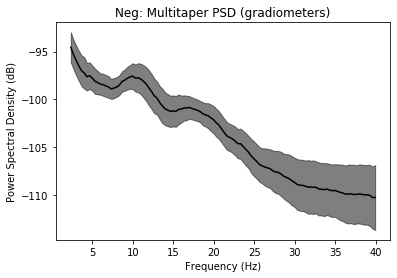

    Using multitaper spectrum estimation with 7 DPSS windows


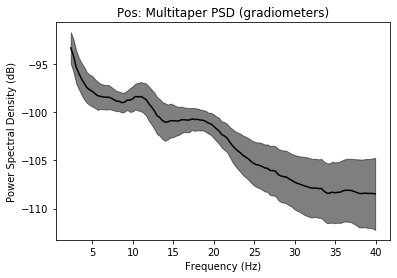

Effective window size : 2.000 (s)
Effective window size : 2.000 (s)


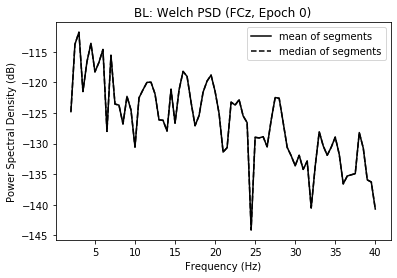

Effective window size : 2.000 (s)
Effective window size : 2.000 (s)


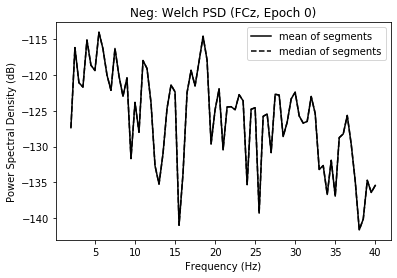

Effective window size : 2.000 (s)
Effective window size : 2.000 (s)


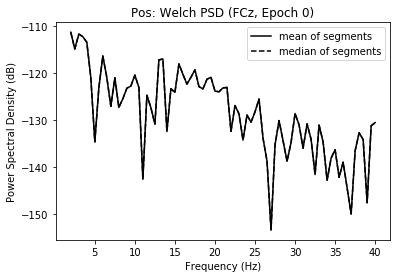

Applying baseline correction (mode: logratio)


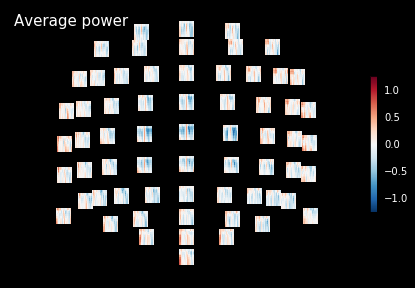

Applying baseline correction (mode: logratio)


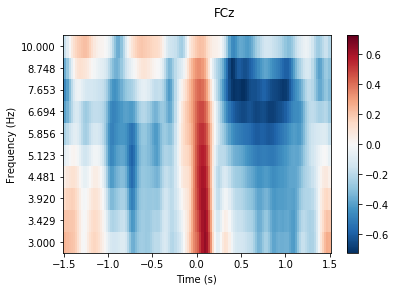

Applying baseline correction (mode: logratio)


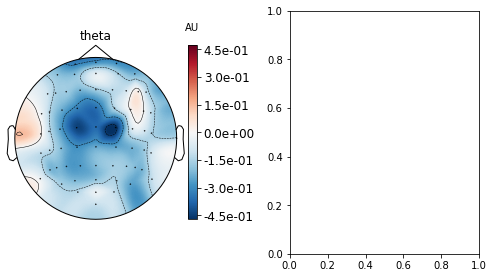

baseline
No baseline correction applied


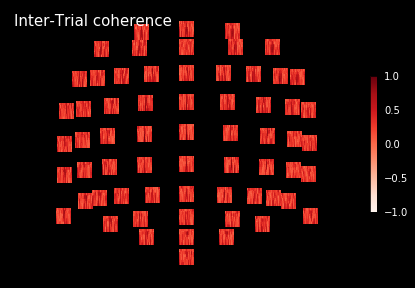

Applying baseline correction (mode: logratio)


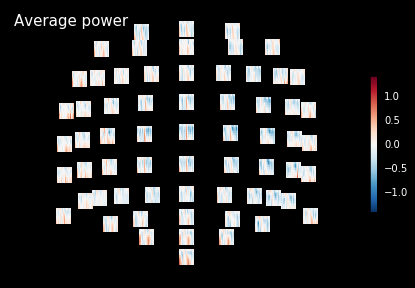

Applying baseline correction (mode: logratio)


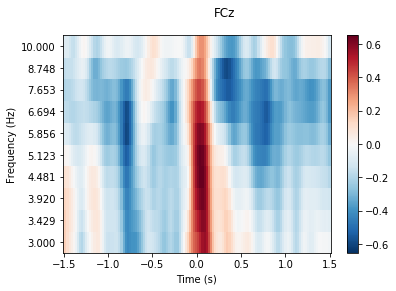

Applying baseline correction (mode: logratio)


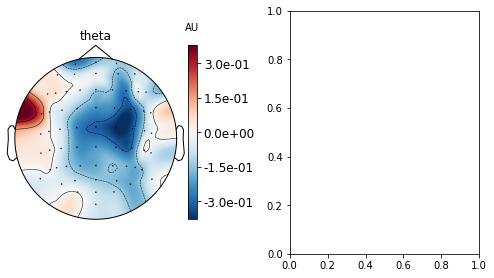

negative
No baseline correction applied


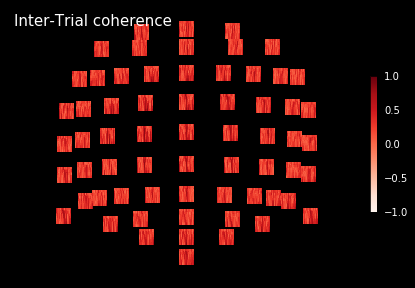

Applying baseline correction (mode: logratio)


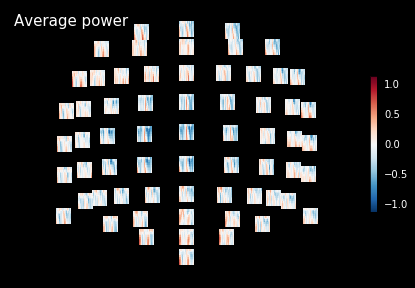

Applying baseline correction (mode: logratio)


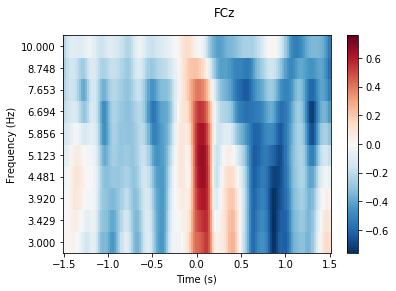

Applying baseline correction (mode: logratio)


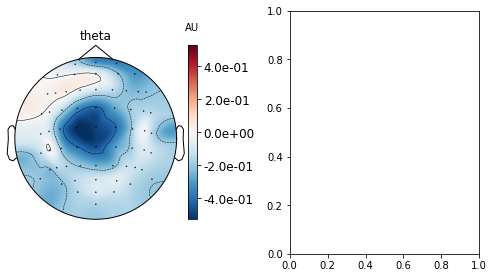

positive
No baseline correction applied


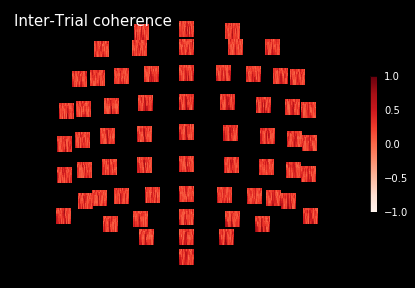

14
subj_28
baseline
    Using multitaper spectrum estimation with 7 DPSS windows


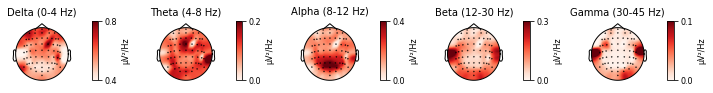

negative
    Using multitaper spectrum estimation with 7 DPSS windows


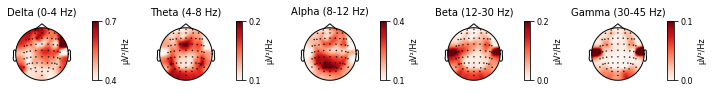

positive
    Using multitaper spectrum estimation with 7 DPSS windows


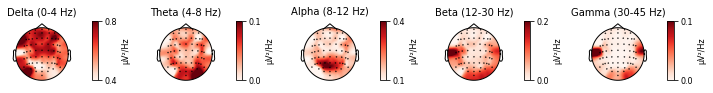

baseline
    Using multitaper spectrum estimation with 7 DPSS windows


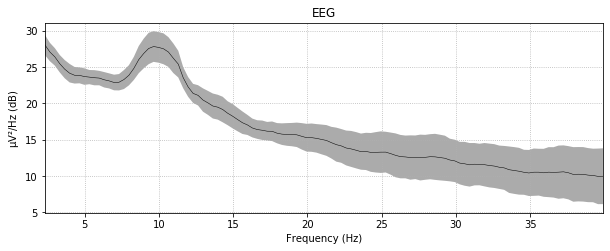

negative
    Using multitaper spectrum estimation with 7 DPSS windows


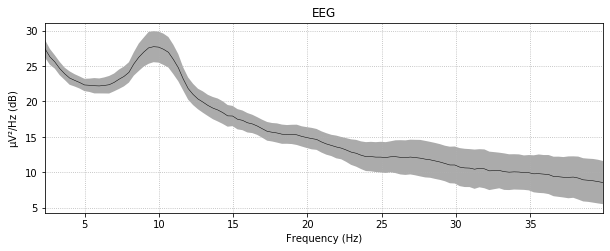

positive
    Using multitaper spectrum estimation with 7 DPSS windows


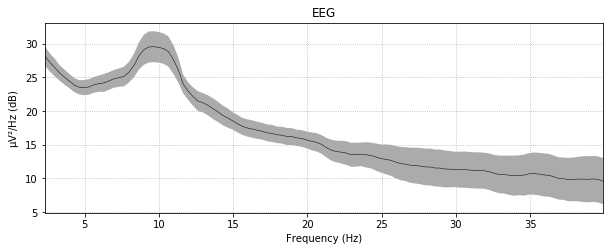

    Using multitaper spectrum estimation with 7 DPSS windows


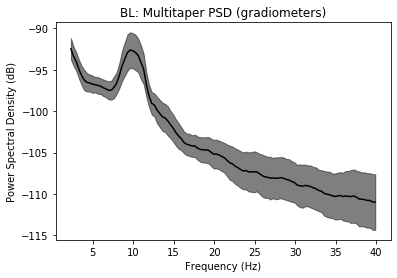

    Using multitaper spectrum estimation with 7 DPSS windows


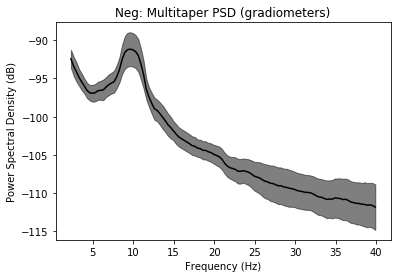

    Using multitaper spectrum estimation with 7 DPSS windows


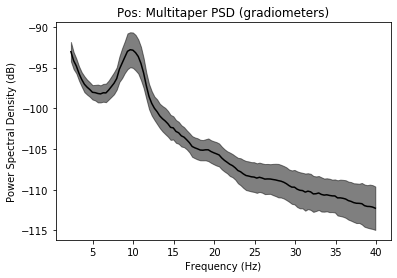

Effective window size : 2.000 (s)
Effective window size : 2.000 (s)


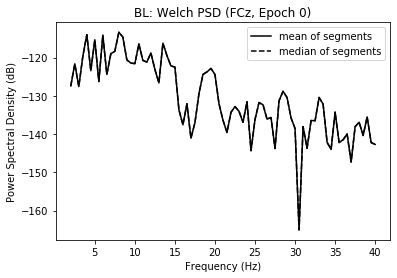

Effective window size : 2.000 (s)
Effective window size : 2.000 (s)


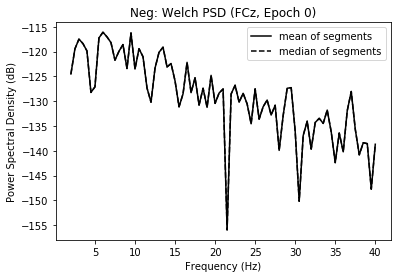

Effective window size : 2.000 (s)
Effective window size : 2.000 (s)


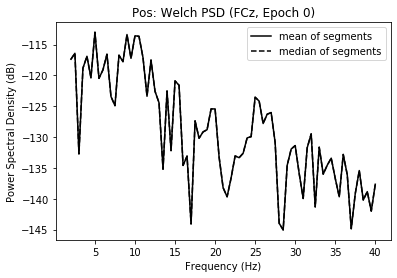

Applying baseline correction (mode: logratio)


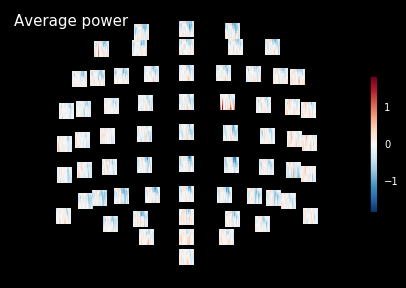

Applying baseline correction (mode: logratio)


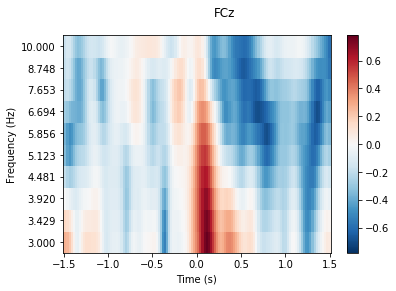

Applying baseline correction (mode: logratio)


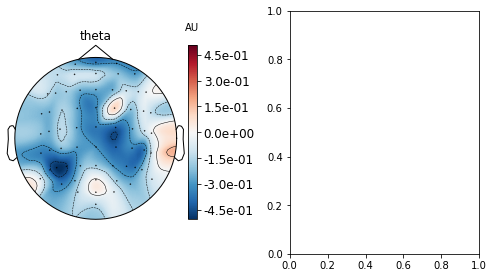

baseline
No baseline correction applied


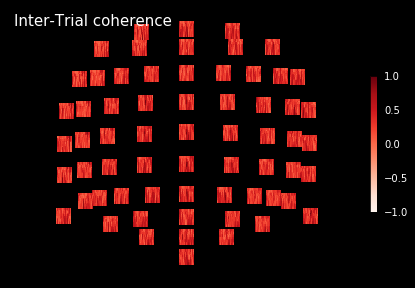

Applying baseline correction (mode: logratio)


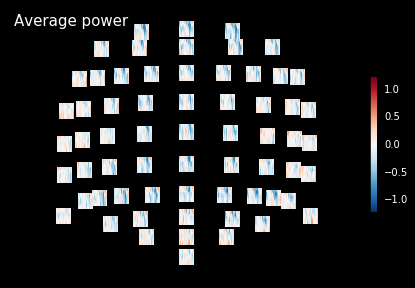

Applying baseline correction (mode: logratio)


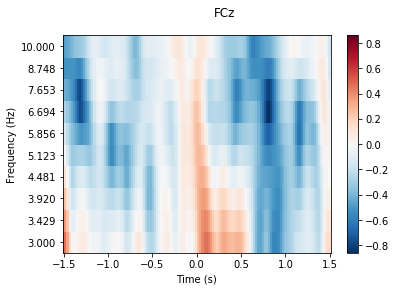

Applying baseline correction (mode: logratio)


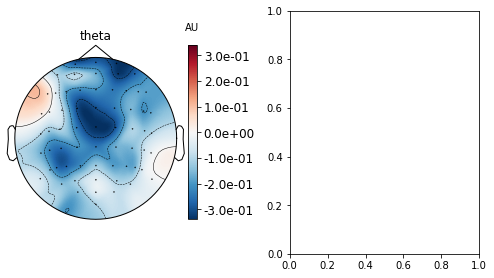

negative
No baseline correction applied


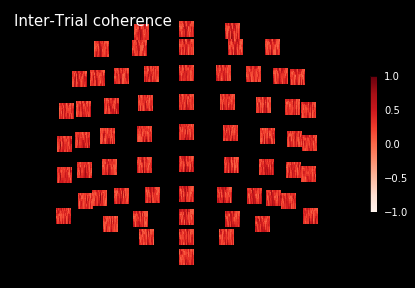

Applying baseline correction (mode: logratio)


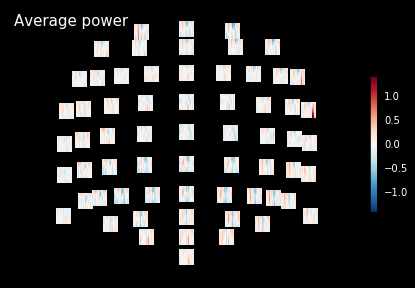

Applying baseline correction (mode: logratio)


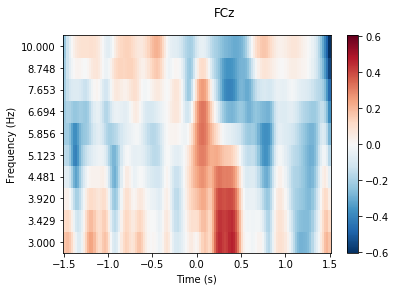

Applying baseline correction (mode: logratio)


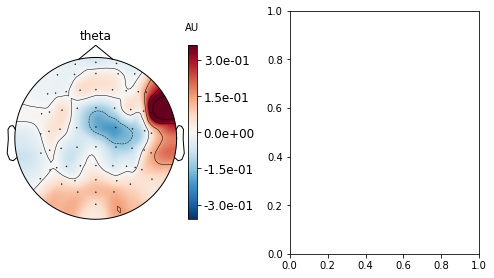

positive
No baseline correction applied


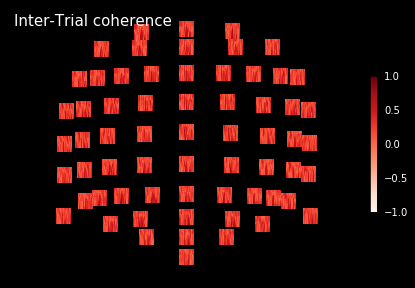

In [7]:
for i, j in enumerate(neg_incongruent_incorrect_erps_base.keys()):
    print(i)
    print(j)
    
    neg_incon_incorr_epochs_base = neg_incongruent_incorrect_base[j]
    neg_incon_incorr_epochs_pos = neg_incongruent_incorrect_pos[j]
    neg_incon_incorr_epochs_neg = neg_incongruent_incorrect_neg[j]
    
    # topo plots
    print('baseline')
    neg_incon_incorr_epochs_base.plot_psd_topomap(ch_type='eeg', normalize=True);
    print('negative')
    neg_incon_incorr_epochs_pos.plot_psd_topomap(ch_type='eeg', normalize=True);
    print('positive')
    neg_incon_incorr_epochs_neg.plot_psd_topomap(ch_type='eeg', normalize=True);
    
    ## Spectral info plots
    
    print('baseline')
    neg_incon_incorr_epochs_base.plot_psd(fmin=2., fmax=40., average=True, spatial_colors=False);
    print('negative')
    neg_incon_incorr_epochs_neg.plot_psd(fmin=2., fmax=40., average=True, spatial_colors=False);
    print('positive')
    neg_incon_incorr_epochs_pos.plot_psd(fmin=2., fmax=40., average=True, spatial_colors=False);
    
    ## PSD plots
    
    f, ax = plt.subplots()
    psds, freqs = psd_multitaper(neg_incon_incorr_epochs_base, fmin=2, fmax=40, n_jobs=1)
    psds = 10. * np.log10(psds)
    psds_mean = psds.mean(0).mean(0)
    psds_std = psds.mean(0).std(0)

    ax.plot(freqs, psds_mean, color='k')
    ax.fill_between(freqs, psds_mean - psds_std, psds_mean + psds_std,
                    color='k', alpha=.5)
    ax.set(title='BL: Multitaper PSD (gradiometers)', xlabel='Frequency (Hz)',
           ylabel='Power Spectral Density (dB)')
    plt.show()
    
    f, ax = plt.subplots()
    psds, freqs = psd_multitaper(neg_incon_incorr_epochs_pos, fmin=2, fmax=40, n_jobs=1)
    psds = 10. * np.log10(psds)
    psds_mean = psds.mean(0).mean(0)
    psds_std = psds.mean(0).std(0)

    ax.plot(freqs, psds_mean, color='k')
    ax.fill_between(freqs, psds_mean - psds_std, psds_mean + psds_std,
                    color='k', alpha=.5)
    ax.set(title='Neg: Multitaper PSD (gradiometers)', xlabel='Frequency (Hz)',
           ylabel='Power Spectral Density (dB)')
    plt.show()
    
    f, ax = plt.subplots()
    psds, freqs = psd_multitaper(neg_incon_incorr_epochs_neg, fmin=2, fmax=40, n_jobs=1)
    psds = 10. * np.log10(psds)
    psds_mean = psds.mean(0).mean(0)
    psds_std = psds.mean(0).std(0)

    ax.plot(freqs, psds_mean, color='k')
    ax.fill_between(freqs, psds_mean - psds_std, psds_mean + psds_std,
                    color='k', alpha=.5)
    ax.set(title='Pos: Multitaper PSD (gradiometers)', xlabel='Frequency (Hz)',
           ylabel='Power Spectral Density (dB)')
    plt.show()
    
    
    ## welch plots
    
    # baseline
        # Estimate PSDs based on "mean" and "median" averaging for comparison.
    kwargs = dict(fmin=2, fmax=40, n_jobs=1)
    psds_welch_mean, freqs_mean = psd_welch(neg_incon_incorr_epochs_base, average='mean', **kwargs)
    psds_welch_median, freqs_median = psd_welch(neg_incon_incorr_epochs_base, average='median', **kwargs)

    # Convert power to dB scale.
    psds_welch_mean = 10 * np.log10(psds_welch_mean)
    psds_welch_median = 10 * np.log10(psds_welch_median)

    # We will only plot the PSD for a single sensor in the first epoch.
    ch_name = 'FCz'
    ch_idx = neg_incon_incorr_epochs_base.info['ch_names'].index(ch_name)
    epo_idx = 0

    _, ax = plt.subplots()
    ax.plot(freqs_mean, psds_welch_mean[epo_idx, ch_idx, :], color='k',
            ls='-', label='mean of segments')
    ax.plot(freqs_median, psds_welch_median[epo_idx, ch_idx, :], color='k',
            ls='--', label='median of segments')

    ax.set(title='BL: Welch PSD ({}, Epoch {})'.format(ch_name, epo_idx),
           xlabel='Frequency (Hz)', ylabel='Power Spectral Density (dB)')
    ax.legend(loc='upper right')
    plt.show()

    # negative 
    
        # Estimate PSDs based on "mean" and "median" averaging for comparison.
    kwargs = dict(fmin=2, fmax=40, n_jobs=1)
    psds_welch_mean, freqs_mean = psd_welch(neg_incon_incorr_epochs_neg, average='mean', **kwargs)
    psds_welch_median, freqs_median = psd_welch(neg_incon_incorr_epochs_neg, average='median', **kwargs)

    # Convert power to dB scale.
    psds_welch_mean = 10 * np.log10(psds_welch_mean)
    psds_welch_median = 10 * np.log10(psds_welch_median)

    # We will only plot the PSD for a single sensor in the first epoch.
    ch_name = 'FCz'
    ch_idx = neg_incon_incorr_epochs_neg.info['ch_names'].index(ch_name)
    epo_idx = 0

    _, ax = plt.subplots()
    ax.plot(freqs_mean, psds_welch_mean[epo_idx, ch_idx, :], color='k',
            ls='-', label='mean of segments')
    ax.plot(freqs_median, psds_welch_median[epo_idx, ch_idx, :], color='k',
            ls='--', label='median of segments')

    ax.set(title='Neg: Welch PSD ({}, Epoch {})'.format(ch_name, epo_idx),
           xlabel='Frequency (Hz)', ylabel='Power Spectral Density (dB)')
    ax.legend(loc='upper right')
    plt.show()  
    
    # positive 
    
        # Estimate PSDs based on "mean" and "median" averaging for comparison.
    kwargs = dict(fmin=2, fmax=40, n_jobs=1)
    psds_welch_mean, freqs_mean = psd_welch(neg_incon_incorr_epochs_pos, average='mean', **kwargs)
    psds_welch_median, freqs_median = psd_welch(neg_incon_incorr_epochs_pos, average='median', **kwargs)

    # Convert power to dB scale.
    psds_welch_mean = 10 * np.log10(psds_welch_mean)
    psds_welch_median = 10 * np.log10(psds_welch_median)

    # We will only plot the PSD for a single sensor in the first epoch.
    ch_name = 'FCz'
    ch_idx = neg_incon_incorr_epochs_pos.info['ch_names'].index(ch_name)
    epo_idx = 0

    _, ax = plt.subplots()
    ax.plot(freqs_mean, psds_welch_mean[epo_idx, ch_idx, :], color='k',
            ls='-', label='mean of segments')
    ax.plot(freqs_median, psds_welch_median[epo_idx, ch_idx, :], color='k',
            ls='--', label='median of segments')

    ax.set(title='Pos: Welch PSD ({}, Epoch {})'.format(ch_name, epo_idx),
           xlabel='Frequency (Hz)', ylabel='Power Spectral Density (dB)')
    ax.legend(loc='upper right')
    plt.show()  
    
    # mortlet time-freq representation
    
    # baseline
    
    # define define frequencies of interest (log-spaced) using morlet wave
    freqs = np.logspace(*np.log10([3, 10]), num=10)
    n_cycles = freqs / 2.  # different number of cycle per frequency
    power, itc = tfr_morlet(neg_incon_incorr_epochs_base, freqs=freqs, n_cycles=n_cycles, use_fft=True,
                            return_itc=True, decim=3, n_jobs=1)
    
    power.plot_topo(baseline=(-0.5, 0), mode='logratio', title='Average power')
    power.plot([-18], baseline=(-0.5, 0), mode='logratio', title=power.ch_names[-18])

    fig, axis = plt.subplots(1, 2, figsize=(7, 4))
    power.plot_topomap(ch_type='eeg', tmin=0.5, tmax=1.5, fmin=3, fmax=9,
                       baseline=(-0.5, 0), mode='logratio', axes=axis[0],
                       title='theta', show=False)
    mne.viz.tight_layout()
    plt.show()
    
    print('baseline')
    itc.plot_topo(title='Inter-Trial coherence', vmin=-1., vmax=1., cmap='Reds');
    # negative
    
    # define define frequencies of interest (log-spaced) using morlet wave
    freqs = np.logspace(*np.log10([3, 10]), num=10)
    n_cycles = freqs / 2.  # different number of cycle per frequency
    power, itc = tfr_morlet(neg_incon_incorr_epochs_neg, freqs=freqs, n_cycles=n_cycles, use_fft=True,
                            return_itc=True, decim=3, n_jobs=1)
    
    power.plot_topo(baseline=(-0.5, 0), mode='logratio', title='Average power')
    power.plot([-18], baseline=(-0.5, 0), mode='logratio', title=power.ch_names[-18])

    fig, axis = plt.subplots(1, 2, figsize=(7, 4))
    power.plot_topomap(ch_type='eeg', tmin=0.5, tmax=1.5, fmin=3, fmax=9,
                       baseline=(-0.5, 0), mode='logratio', axes=axis[0],
                       title='theta', show=False)
    mne.viz.tight_layout()
    plt.show()

    print('negative')
    itc.plot_topo(title='Inter-Trial coherence', vmin=-1., vmax=1., cmap='Reds');
    
    # positive
    
    # define define frequencies of interest (log-spaced) using morlet wave
    freqs = np.logspace(*np.log10([3, 10]), num=10)
    n_cycles = freqs / 2.  # different number of cycle per frequency
    power, itc = tfr_morlet(neg_incon_incorr_epochs_pos, freqs=freqs, n_cycles=n_cycles, use_fft=True,
                            return_itc=True, decim=3, n_jobs=1)
    
    power.plot_topo(baseline=(-0.5, 0), mode='logratio', title='Average power')
    power.plot([-18], baseline=(-0.5, 0), mode='logratio', title=power.ch_names[-18])

    fig, axis = plt.subplots(1, 2, figsize=(7, 4))
    power.plot_topomap(ch_type='eeg', tmin=0.5, tmax=1.5, fmin=3, fmax=9,
                       baseline=(-0.5, 0), mode='logratio', axes=axis[0],
                       title='theta', show=False)
    mne.viz.tight_layout()
    plt.show()
    
    print('positive')
    itc.plot_topo(title='Inter-Trial coherence', vmin=-1., vmax=1., cmap='Reds');

### or use https://mne.tools/stable/auto_tutorials/time-freq/20_sensors_time_frequency.html
Frequency and time-frequency sensor analysis

In [8]:
from mne.baseline import rescale
from mne.stats import bootstrap_confidence_interval

0
subj_07
baseline
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


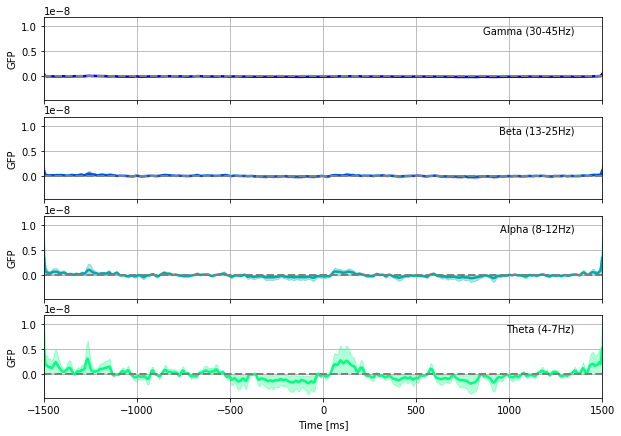

negative
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


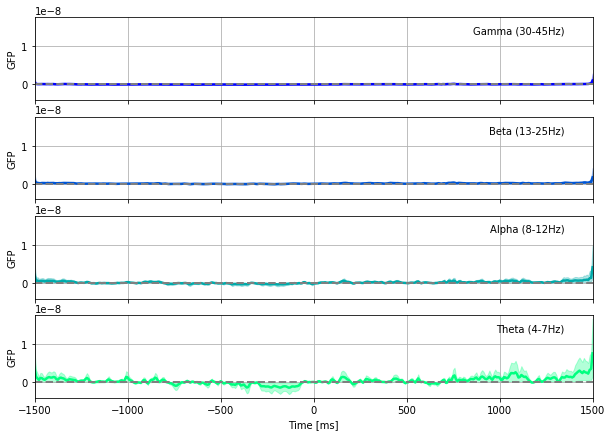

positive
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


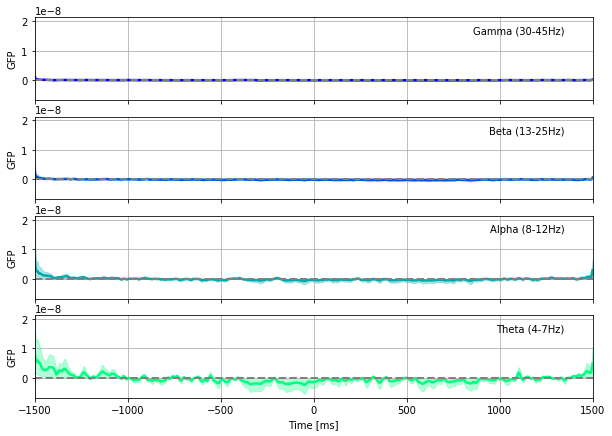

1
subj_09
baseline
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


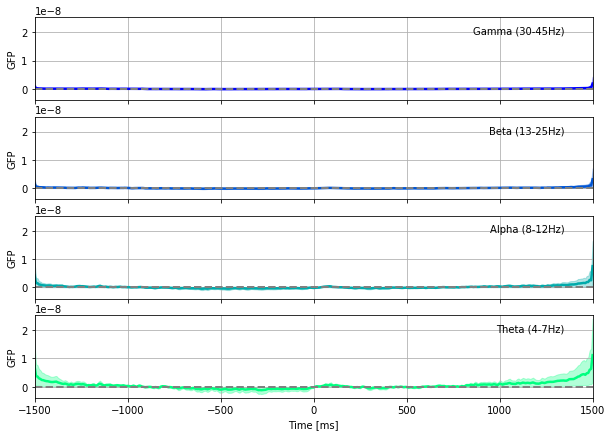

negative
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


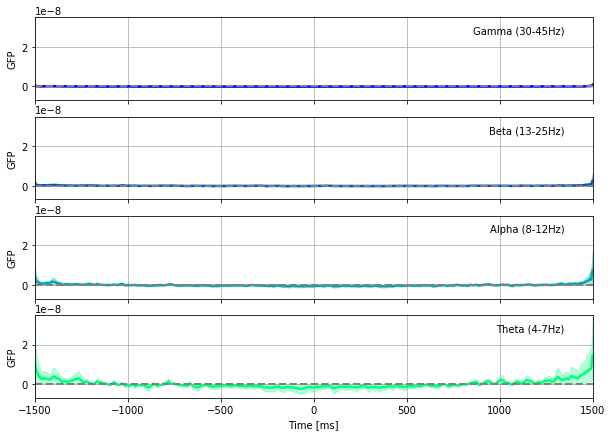

positive
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


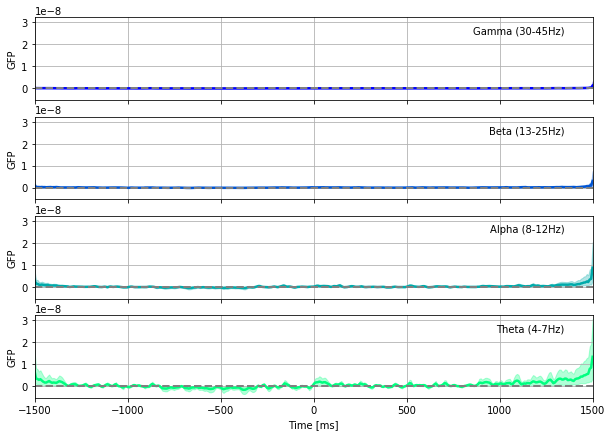

2
subj_18
baseline
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


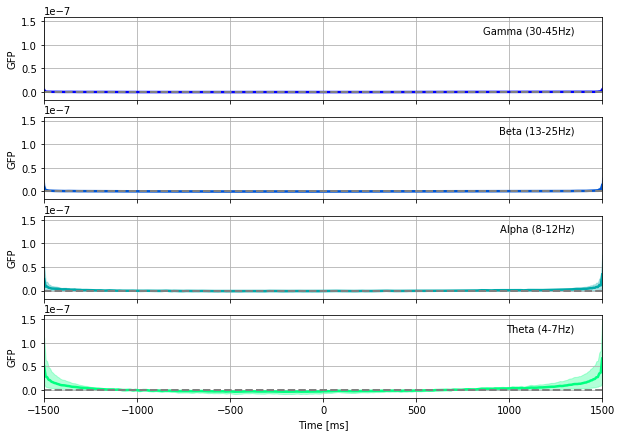

negative
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


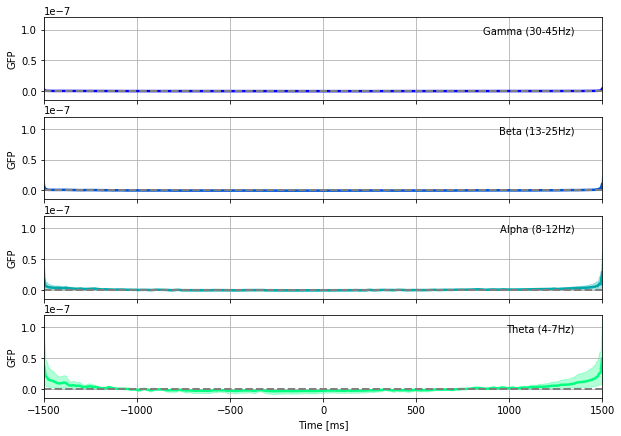

positive
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


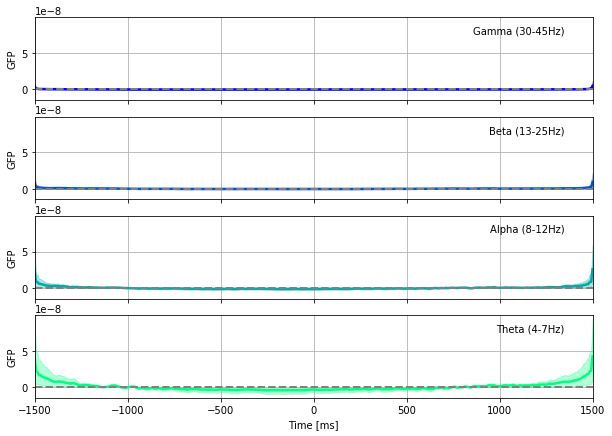

3
subj_22
baseline
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


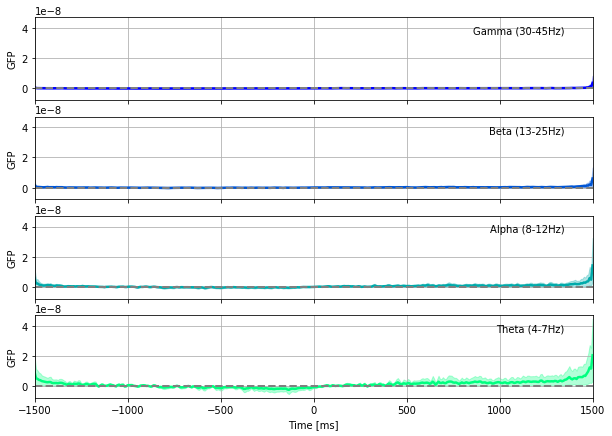

negative
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


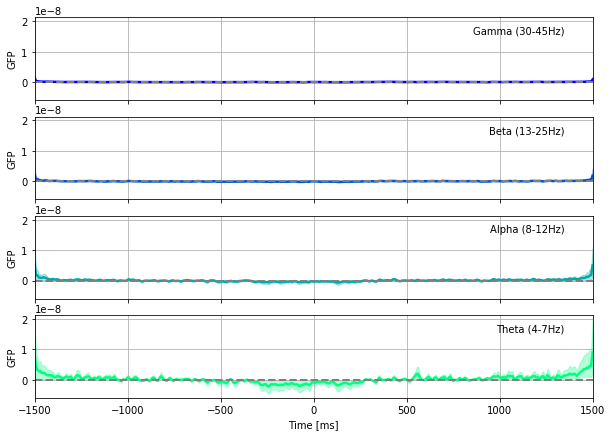

positive
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


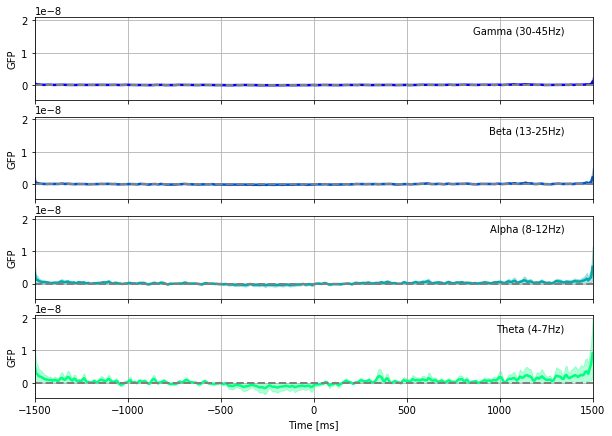

4
subj_36
baseline
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


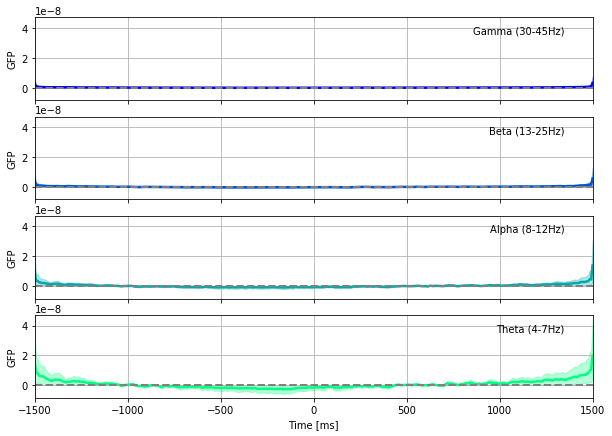

negative
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


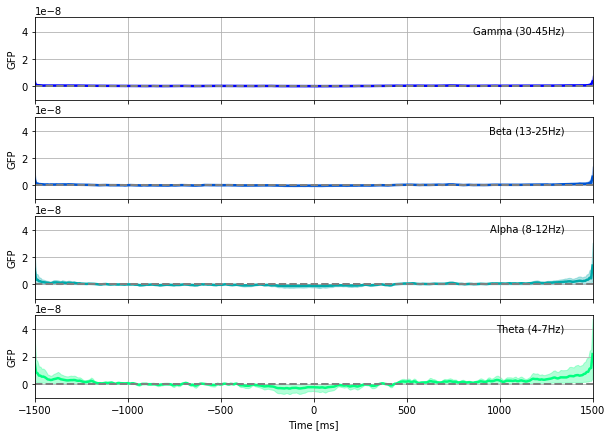

positive
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


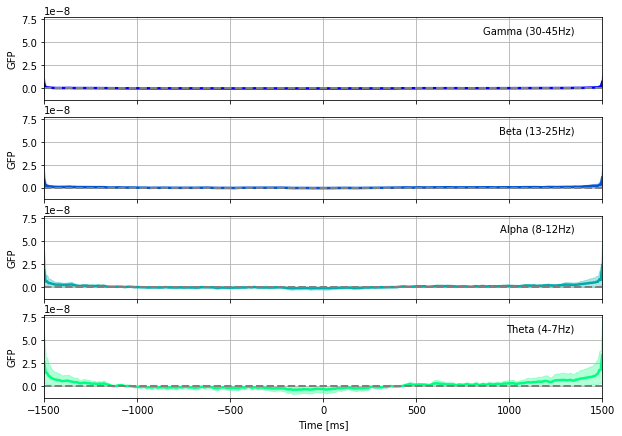

5
subj_03
baseline
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


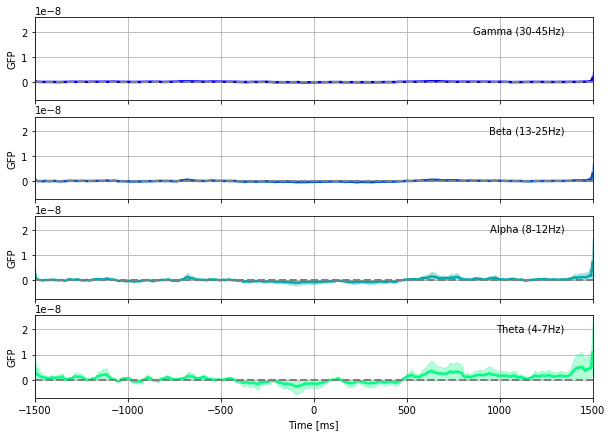

negative
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


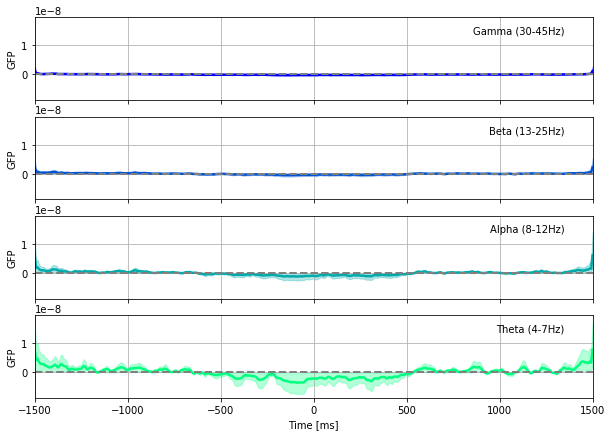

positive
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


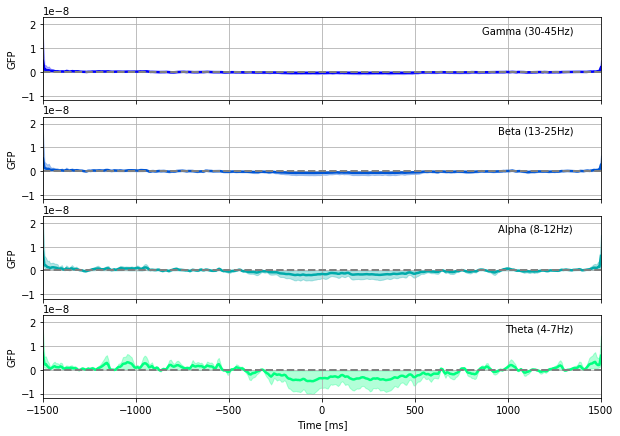

6
subj_05
baseline
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


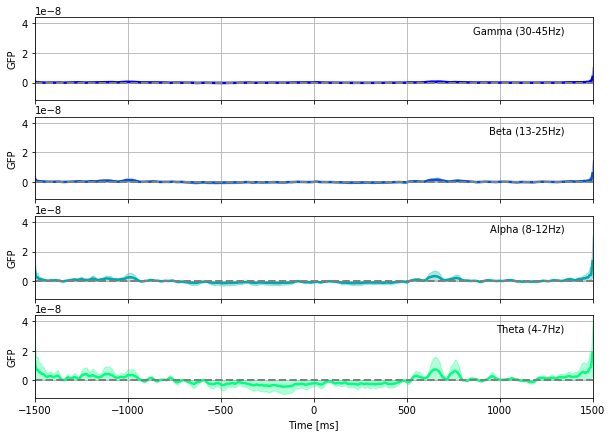

negative
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


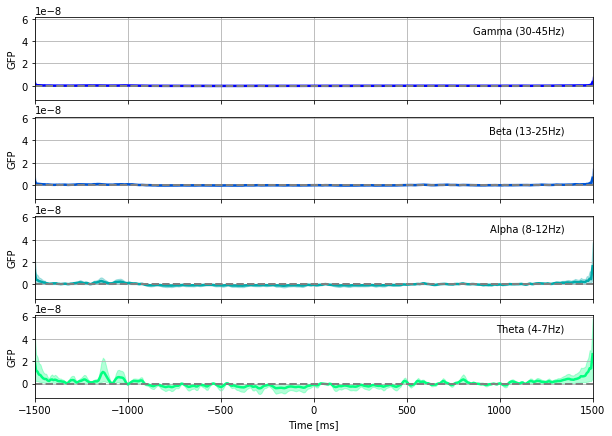

positive
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


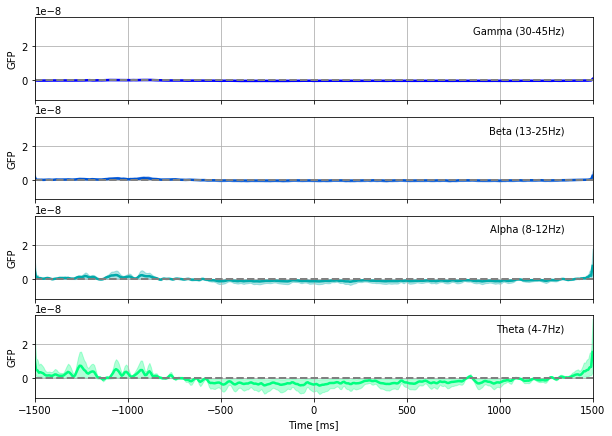

7
subj_12
baseline
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


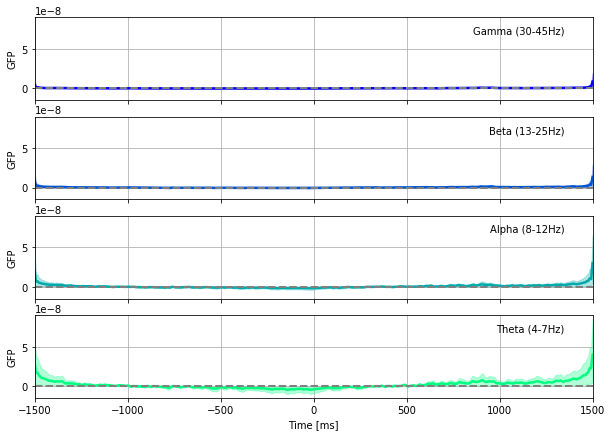

negative
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


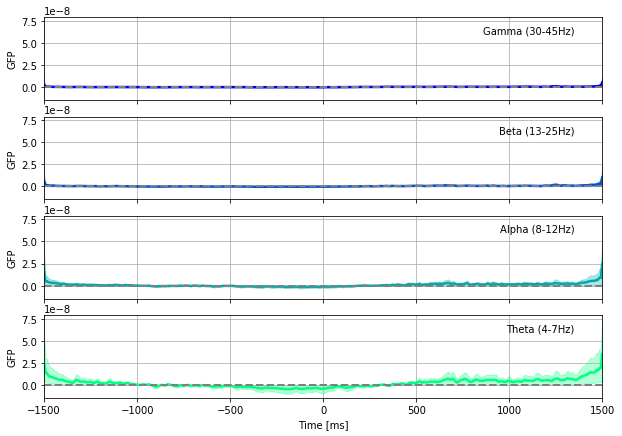

positive
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


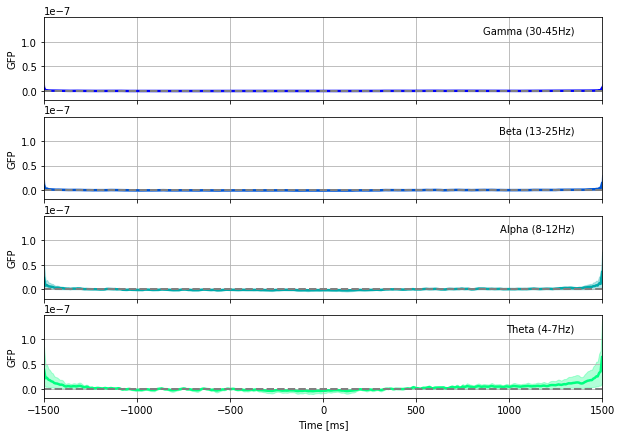

8
subj_20
baseline
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


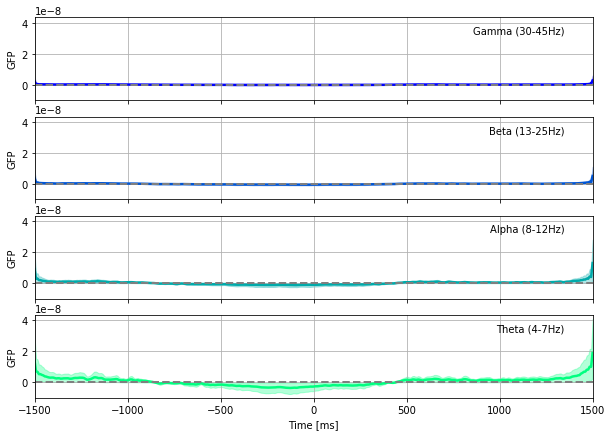

negative
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


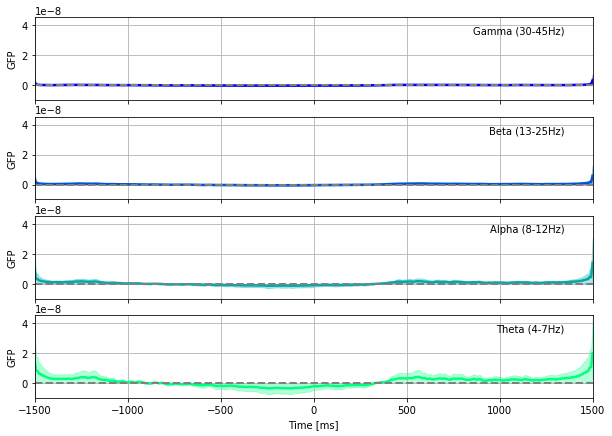

positive
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


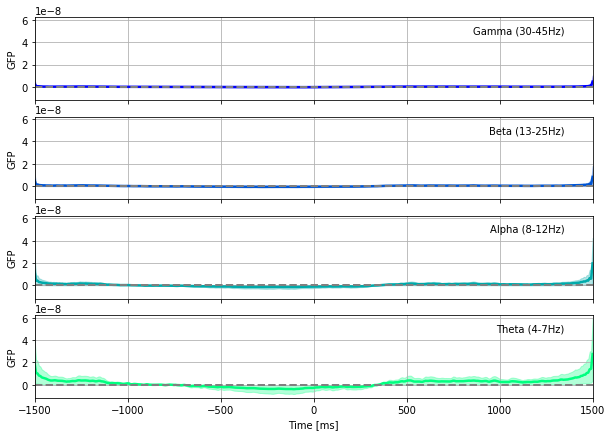

9
subj_32
baseline
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


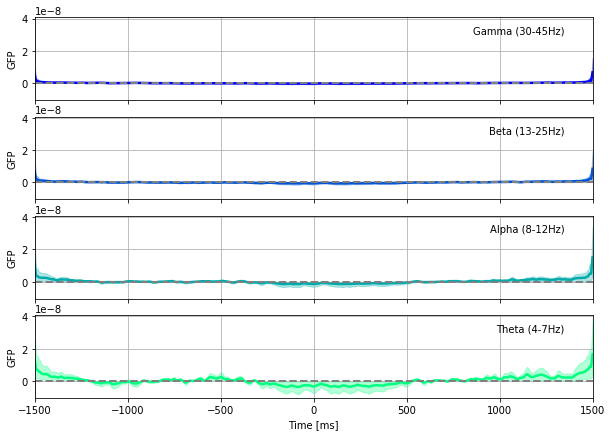

negative
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


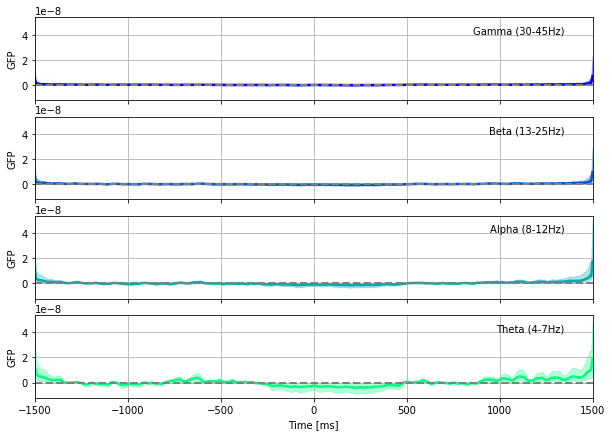

positive
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


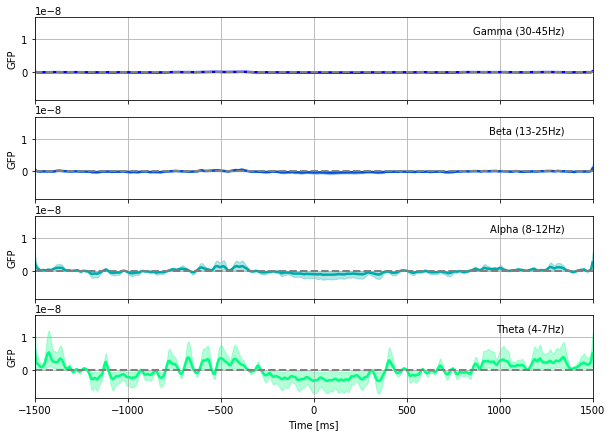

10
subj_24
baseline
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


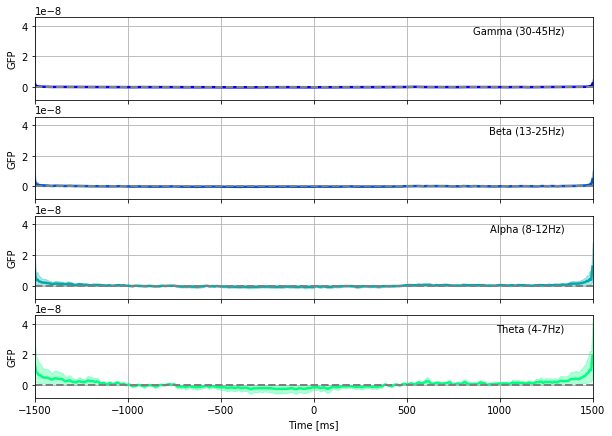

negative
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


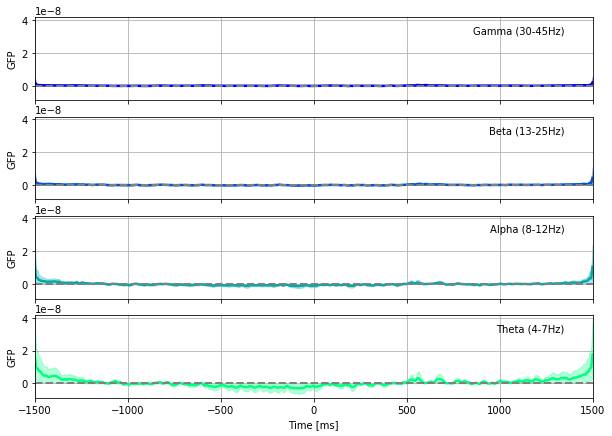

positive
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


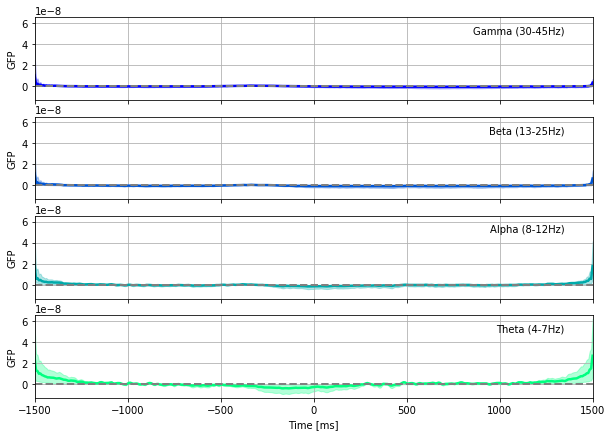

11
subj_35
baseline
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


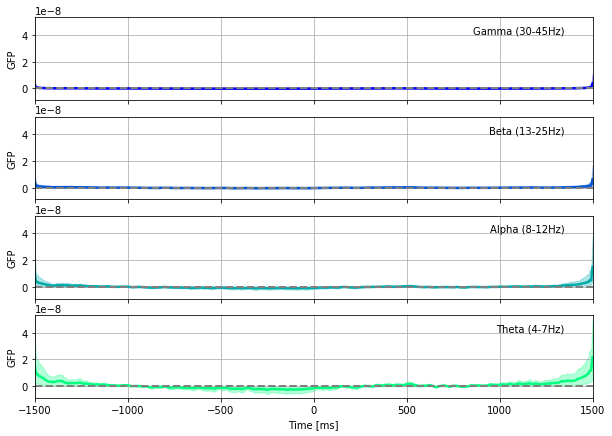

negative
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


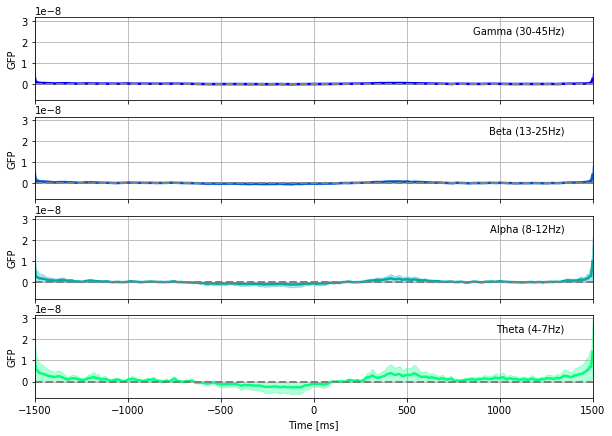

positive
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


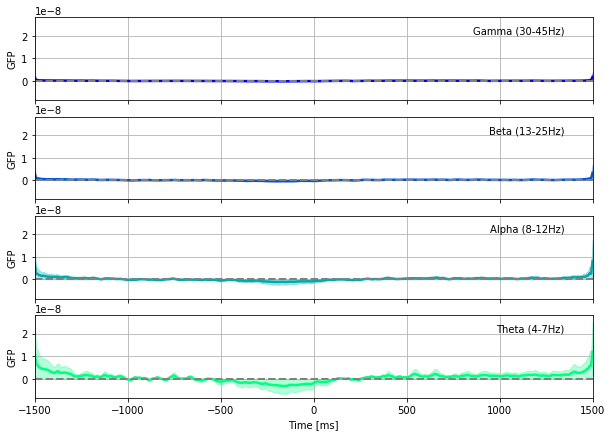

12
subj_14
baseline
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


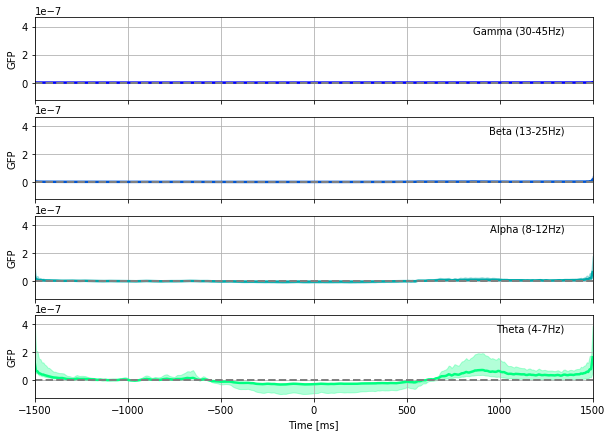

negative
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


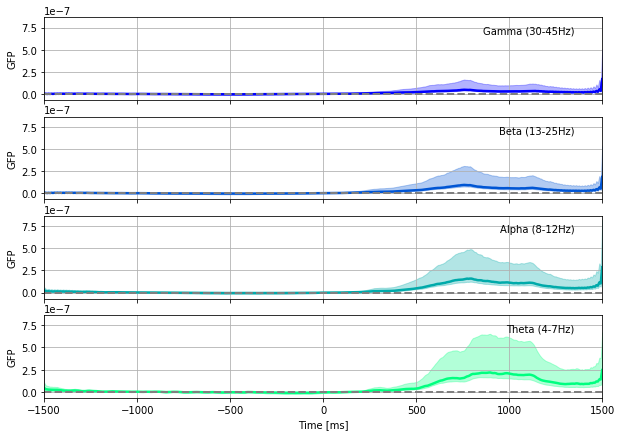

positive
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


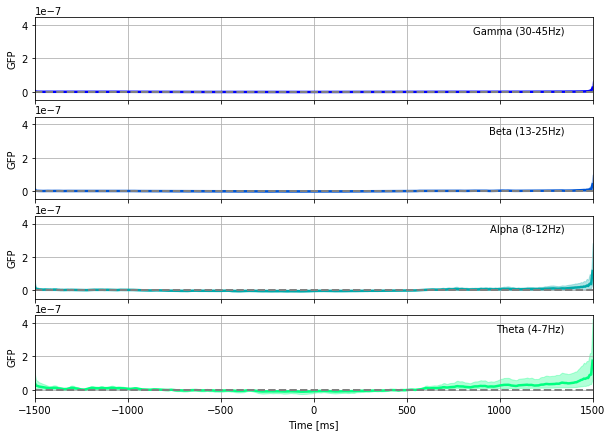

13
subj_16
baseline
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


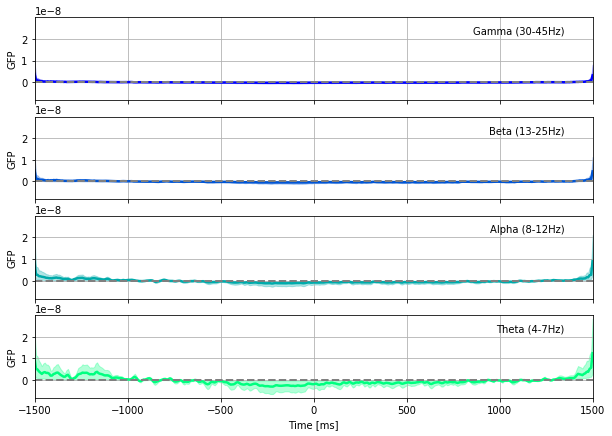

negative
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


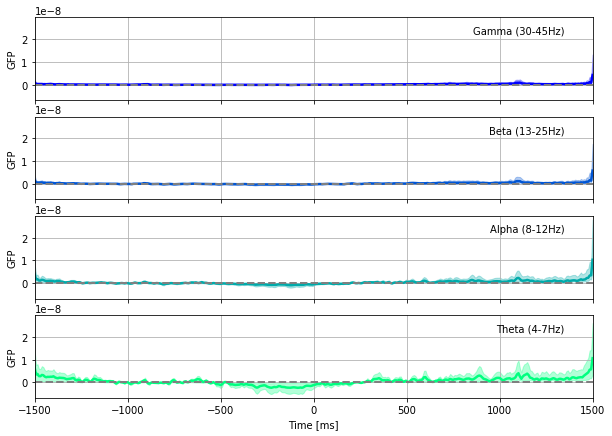

positive
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


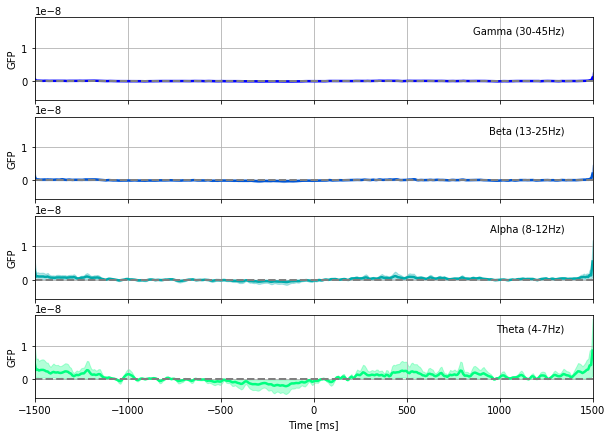

14
subj_28
baseline
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


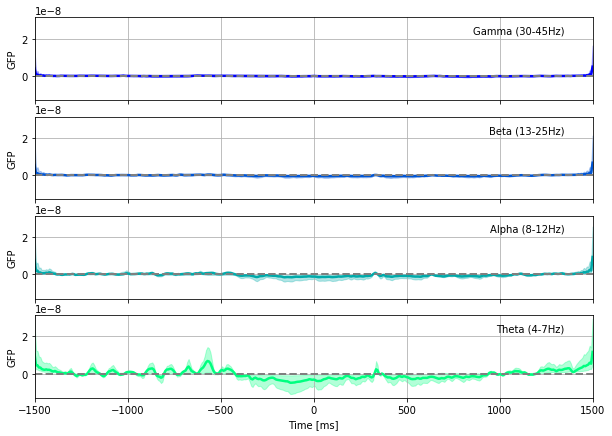

negative
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


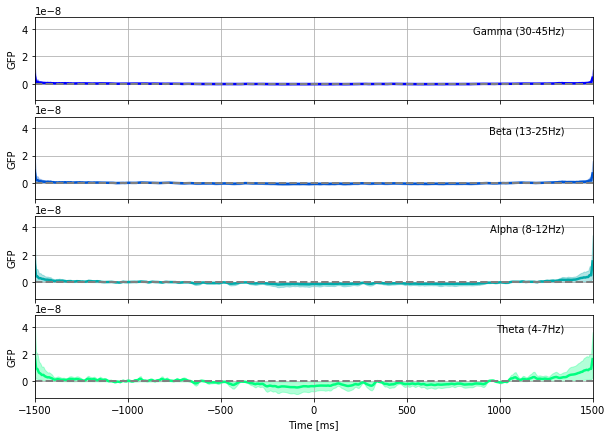

positive
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Subtracting Evoked from Epochs
[done]
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


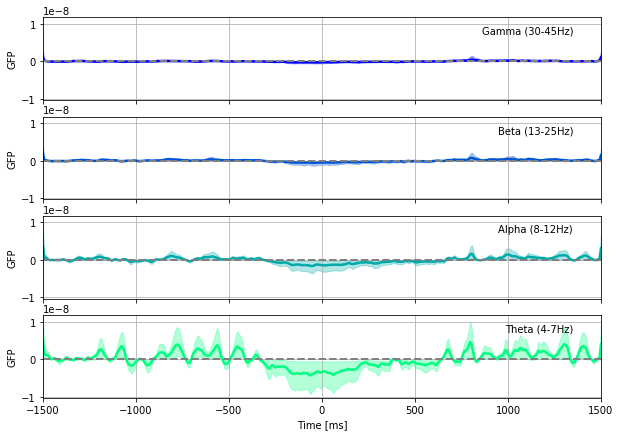

In [9]:
# let's explore some frequency bands
iter_freqs = [
    ('Theta', 4, 7),
    ('Alpha', 8, 12),
    ('Beta', 13, 25),
    ('Gamma', 30, 45)
]

    

# Helper function for plotting spread
def stat_fun(x):
    """Return sum of squares."""
    return np.sum(x ** 2, axis=0)
for i, j in enumerate(neg_incongruent_incorrect_erps_base.keys()):
    print(i)
    print(j)
    
    # Global field power baseline
    print('baseline')
    
    neg_incon_incorr_epochs_base = neg_incongruent_incorrect_base[j]

    

    frequency_map = list()
    for band, fmin, fmax in iter_freqs:

    #epochs = mne.Epochs(raw, events, event_id, tmin, tmax, baseline=baseline,
    #                    reject=dict(grad=4000e-13, eog=350e-6),
    #                    preload=True)
    # remove evoked response
        neg_incon_incorr_epochs_base.subtract_evoked()

        # get analytic signal (envelope)
        neg_incon_incorr_epochs_base.apply_hilbert(envelope=True)
        frequency_map.append(((band, fmin, fmax), neg_incon_incorr_epochs_base.average()))




    # Plot
    fig, axes = plt.subplots(4, 1, figsize=(10, 7), sharex=True, sharey=True)
    colors = plt.get_cmap('winter_r')(np.linspace(0, 1, 4))
    for ((freq_name, fmin, fmax), average), color, ax in zip(
            frequency_map, colors, axes.ravel()[::-1]):
        times = average.times * 1e3
        gfp = np.sum(average.data ** 2, axis=0)
        gfp = mne.baseline.rescale(gfp, times, baseline=(None, 0))
        ax.plot(times, gfp, label=freq_name, color=color, linewidth=2.5)
        ax.axhline(0, linestyle='--', color='grey', linewidth=2)
        ci_low, ci_up = bootstrap_confidence_interval(average.data, random_state=0,
                                                      stat_fun=stat_fun)
        ci_low = rescale(ci_low, average.times, baseline=(None, 0))
        ci_up = rescale(ci_up, average.times, baseline=(None, 0))
        ax.fill_between(times, gfp + ci_up, gfp - ci_low, color=color, alpha=0.3)
        ax.grid(True)
        ax.set_ylabel('GFP')
        ax.annotate('%s (%d-%dHz)' % (freq_name, fmin, fmax),
                    xy=(0.95, 0.8),
                    horizontalalignment='right',
                    xycoords='axes fraction')
        ax.set_xlim(-1500, 1500)

    axes.ravel()[-1].set_xlabel('Time [ms]')
    plt.show()
    
    # Global field power negative    
    print('negative')
    
    neg_incon_incorr_epochs_neg = neg_incongruent_incorrect_neg[j]
    

    frequency_map = list()
    for band, fmin, fmax in iter_freqs:

    #epochs = mne.Epochs(raw, events, event_id, tmin, tmax, baseline=baseline,
    #                    reject=dict(grad=4000e-13, eog=350e-6),
    #                    preload=True)
    # remove evoked response
        neg_incon_incorr_epochs_neg.subtract_evoked()

        # get analytic signal (envelope)
        neg_incon_incorr_epochs_neg.apply_hilbert(envelope=True)
        frequency_map.append(((band, fmin, fmax), neg_incon_incorr_epochs_neg.average()))




    # Plot
    fig, axes = plt.subplots(4, 1, figsize=(10, 7), sharex=True, sharey=True)
    colors = plt.get_cmap('winter_r')(np.linspace(0, 1, 4))
    for ((freq_name, fmin, fmax), average), color, ax in zip(
            frequency_map, colors, axes.ravel()[::-1]):
        times = average.times * 1e3
        gfp = np.sum(average.data ** 2, axis=0)
        gfp = mne.baseline.rescale(gfp, times, baseline=(None, 0))
        ax.plot(times, gfp, label=freq_name, color=color, linewidth=2.5)
        ax.axhline(0, linestyle='--', color='grey', linewidth=2)
        ci_low, ci_up = bootstrap_confidence_interval(average.data, random_state=0,
                                                      stat_fun=stat_fun)
        ci_low = rescale(ci_low, average.times, baseline=(None, 0))
        ci_up = rescale(ci_up, average.times, baseline=(None, 0))
        ax.fill_between(times, gfp + ci_up, gfp - ci_low, color=color, alpha=0.3)
        ax.grid(True)
        ax.set_ylabel('GFP')
        ax.annotate('%s (%d-%dHz)' % (freq_name, fmin, fmax),
                    xy=(0.95, 0.8),
                    horizontalalignment='right',
                    xycoords='axes fraction')
        ax.set_xlim(-1500, 1500)

    axes.ravel()[-1].set_xlabel('Time [ms]')    
    plt.show()
    
    
    # Global field power positive
    print('positive')
    
    neg_incon_incorr_epochs_pos = neg_incongruent_incorrect_pos[j]
    

    frequency_map = list()
    for band, fmin, fmax in iter_freqs:

    #epochs = mne.Epochs(raw, events, event_id, tmin, tmax, baseline=baseline,
    #                    reject=dict(grad=4000e-13, eog=350e-6),
    #                    preload=True)
    # remove evoked response
        neg_incon_incorr_epochs_pos.subtract_evoked()

        # get analytic signal (envelope)
        neg_incon_incorr_epochs_pos.apply_hilbert(envelope=True)
        frequency_map.append(((band, fmin, fmax), neg_incon_incorr_epochs_pos.average()))




    # Plot
    fig, axes = plt.subplots(4, 1, figsize=(10, 7), sharex=True, sharey=True)
    colors = plt.get_cmap('winter_r')(np.linspace(0, 1, 4))
    for ((freq_name, fmin, fmax), average), color, ax in zip(
            frequency_map, colors, axes.ravel()[::-1]):
        times = average.times * 1e3
        gfp = np.sum(average.data ** 2, axis=0)
        gfp = mne.baseline.rescale(gfp, times, baseline=(None, 0))
        ax.plot(times, gfp, label=freq_name, color=color, linewidth=2.5)
        ax.axhline(0, linestyle='--', color='grey', linewidth=2)
        ci_low, ci_up = bootstrap_confidence_interval(average.data, random_state=0,
                                                      stat_fun=stat_fun)
        ci_low = rescale(ci_low, average.times, baseline=(None, 0))
        ci_up = rescale(ci_up, average.times, baseline=(None, 0))
        ax.fill_between(times, gfp + ci_up, gfp - ci_low, color=color, alpha=0.3)
        ax.grid(True)
        ax.set_ylabel('GFP')
        ax.annotate('%s (%d-%dHz)' % (freq_name, fmin, fmax),
                    xy=(0.95, 0.8),
                    horizontalalignment='right',
                    xycoords='axes fraction')
        ax.set_xlim(-1500, 1500)

    axes.ravel()[-1].set_xlabel('Time [ms]') 
    plt.show()